In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import networkx as nx
import subprocess
import time
from sklearn.manifold import TSNE
import seaborn as sns
from sklearn.metrics.pairwise import euclidean_distances

# Load Dataset

In [2]:
scenario = 11
dsn = pd.read_csv(f'C:\\Users\\popul\\Documents\\Homework\\cs_6490\\project\\CS6490_NetworkSecurity_FinalProject\\botembed\\data\\scenario_{scenario}.csv')

In [3]:
# make the graph
E = [(u,v) for u, v in dsn[['SrcAddr', 'DstAddr']].drop_duplicates().values]
G = nx.Graph()
G.add_edges_from(E)
G_ip_list = G.nodes()
G = nx.convert_node_labels_to_integers(G)

In [10]:
unique_labels = dsn['Label'].unique()

botnet_labels = [x for x in unique_labels if 'botnet' in x.lower()]
bad_ips = list(dsn[dsn['Label'].isin(botnet_labels)]['SrcAddr'].unique())
bad_ips_indx = [list(G_ip_list).index(i) for i in bad_ips]

from_normal_labels = [x for x in unique_labels if 'From-Normal' in x]
from_normal_ips = dsn[dsn['Label'].isin(from_normal_labels)]['SrcAddr'].unique()
to_normal_labels = [x for x in unique_labels if 'To-Normal' in x]
to_normal_ips = dsn[dsn['Label'].isin(to_normal_labels)]['DstAddr'].unique()
normal_ips = list(from_normal_ips) + list(to_normal_ips)
normal_ips_indx = [list(G_ip_list).index(i) for i in normal_ips]

background_ips = [x for x in list(G_ip_list) if x not in bad_ips+normal_ips]

# pick 10 random background_ips
random_background_ips = list(np.random.choice(background_ips, 10))
random_background_ips_indx = [list(G_ip_list).index(i) for i in random_background_ips]

In [11]:
print(bad_ips)
normal_ips.pop(6)
print(normal_ips)

['147.32.84.165', '147.32.84.191', '147.32.84.192']
['147.32.84.164', '147.32.84.134', '147.32.84.170', '147.32.80.9', '147.32.87.36', '147.32.87.11']


In [16]:
def run_deepwalk(G, n_walks, walk_length, representation_size, window_size, n_jobs):
    
    print('-'*50)
    print(f'n_walks: {n_walks}, walk_length: {walk_length}, representation_size: {representation_size}, window_size: {window_size}', end=' ')
    start_time = time.time()
    nx.write_edgelist(G, f'scenario_{scenario}.edgelist', data=False) # For deepwalk
    p = subprocess.run(["deepwalk",
                        "--format", "edgelist", 
                        "--input", f"scenario_{scenario}.edgelist",
                        "--max-memory-data-size", "30000000000",
                        "--number-walks", f"{n_walks}",
                        "--walk-length", f"{walk_length}",
                        "--representation-size", f"{representation_size}",
                        "--window-size", f"{window_size}",
                        "--output", f"scenario_{scenario}_n{n_walks}_l{walk_length}_w{window_size}_d{representation_size}.output",
                        "--workers", f"{n_jobs}",
                        "--seed", "1138"])
    end_time = time.time()
    print('Running Time: ', end_time - start_time)
    

    deepwalk_output = pd.read_csv(f'scenario_{scenario}_n{n_walks}_l{walk_length}_w{window_size}_d{representation_size}.output', delimiter=' ',
                             header=None, skiprows=1)
    deepwalk_output = deepwalk_output.sort_values(0).reset_index(drop=True)

    fig, ax = plt.subplots(1, 1, figsize=(8, 10))
    sns.heatmap(deepwalk_output.loc[:, 1:])
    plt.title('All IPS')
    plt.show()
    
    
    sns.heatmap(deepwalk_output.loc[bad_ips_indx + normal_ips_indx, 1:])
    plt.yticks(range(len(bad_ips_indx + normal_ips_indx)), labels=bad_ips + normal_ips)
    plt.title('Bad vs. Normal IPS')
    plt.show()
    
    dist = euclidean_distances(deepwalk_output.loc[bad_ips_indx + normal_ips_indx, 1:], deepwalk_output.loc[bad_ips_indx + normal_ips_indx, 1:], squared=True)
    sns.heatmap(dist)
    plt.yticks(range(len(bad_ips_indx + normal_ips_indx)), labels=bad_ips + normal_ips, rotation=0)
    plt.xticks(range(len(bad_ips_indx + normal_ips_indx)), labels=bad_ips + normal_ips, rotation=90)
    plt.title('Bad vs. Normal IPS')
    plt.show()
    
    sns.heatmap(deepwalk_output.loc[bad_ips_indx + random_background_ips_indx, 1:])
    plt.yticks(range(len(bad_ips_indx + random_background_ips_indx)), labels=bad_ips + random_background_ips)
    plt.title('Bad vs. Random Background IPS')
    plt.show()
    
    dist = euclidean_distances(deepwalk_output.loc[bad_ips_indx + random_background_ips_indx, 1:], deepwalk_output.loc[bad_ips_indx + random_background_ips_indx, 1:], squared=True)
    sns.heatmap(dist)
    plt.yticks(range(len(bad_ips_indx + random_background_ips_indx)), labels=bad_ips + random_background_ips, rotation=0)
    plt.xticks(range(len(bad_ips_indx + random_background_ips_indx)), labels=bad_ips + random_background_ips, rotation=90)
    plt.title('Bad vs. Random Background IPS')
    plt.show()

--------------------------------------------------
n_walks: 1, walk_length: 5, representation_size: 8, window_size: 2 Running Time:  12.417823076248169


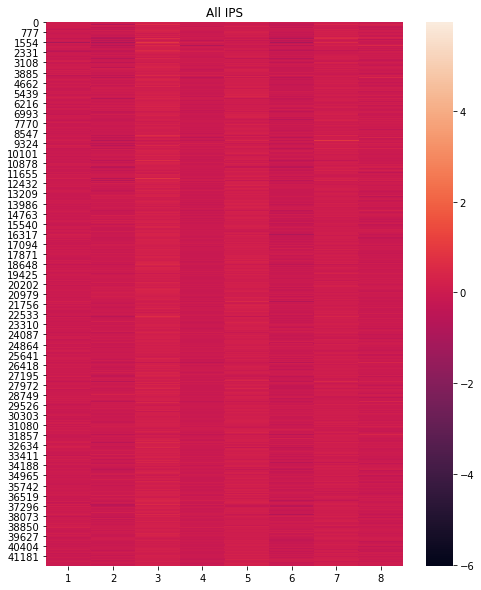

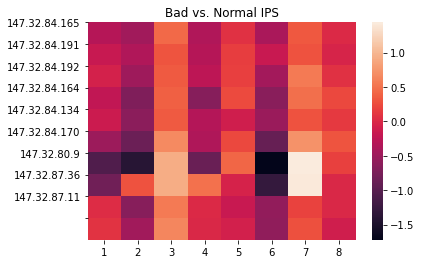

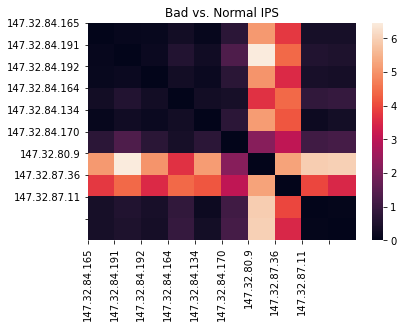

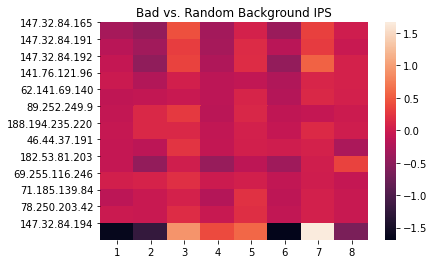

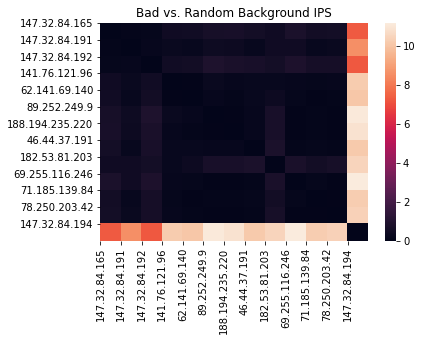

In [17]:
run_deepwalk(G, 
             n_walks=1, 
             walk_length=5, 
             representation_size=8, 
             window_size=2, 
             n_jobs=1)

# 2 dimensions

--------------------------------------------------
n_walks: 5, walk_length: 2, representation_size: 2, window_size: 2 Running Time:  12.176485776901245


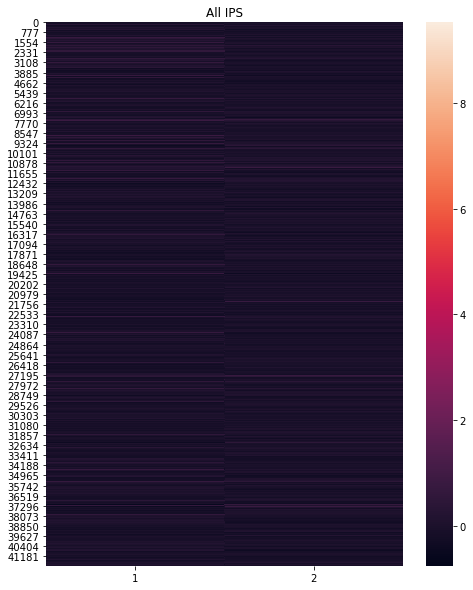

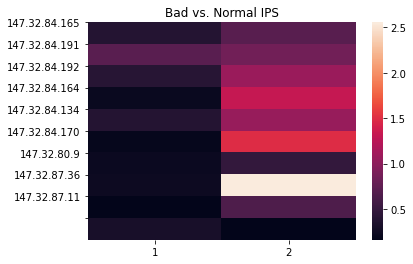

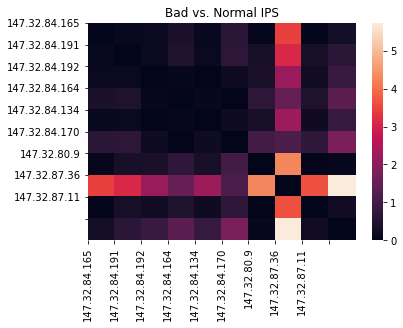

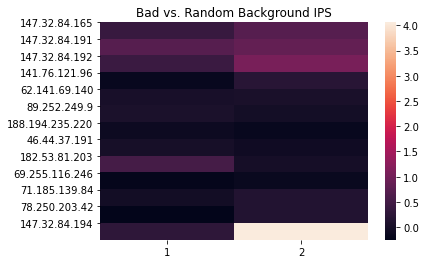

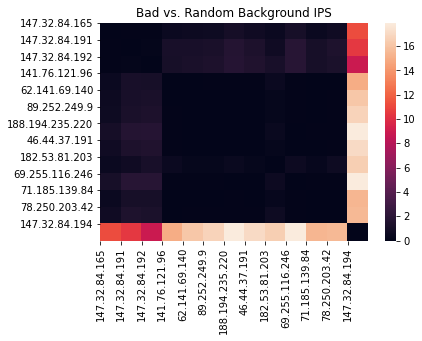

--------------------------------------------------
n_walks: 5, walk_length: 2, representation_size: 2, window_size: 4 Running Time:  11.826595783233643


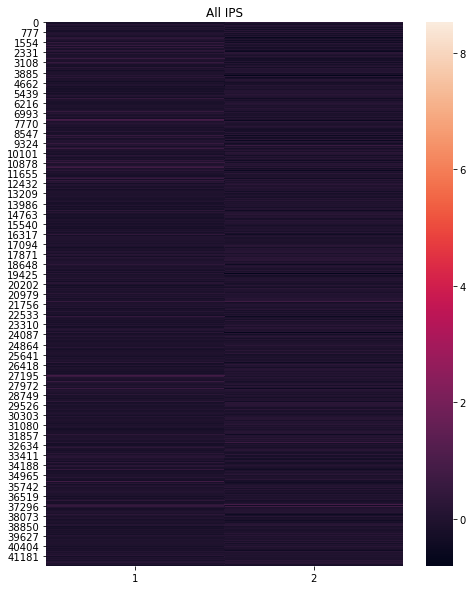

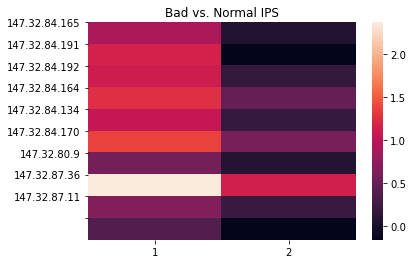

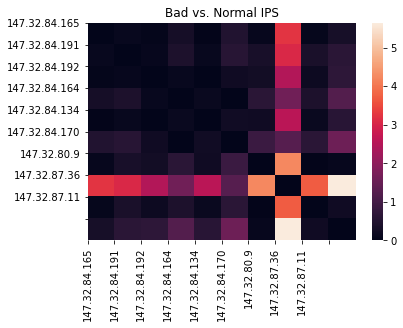

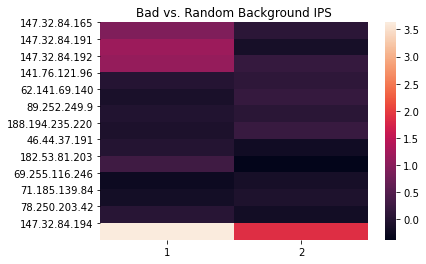

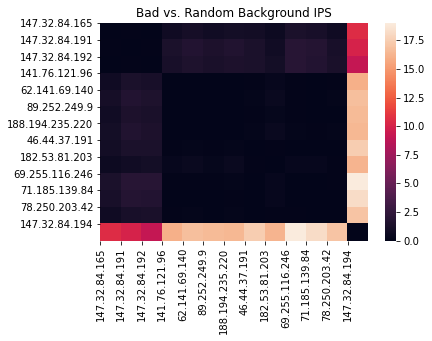

--------------------------------------------------
n_walks: 5, walk_length: 5, representation_size: 2, window_size: 2 Running Time:  21.62743830680847


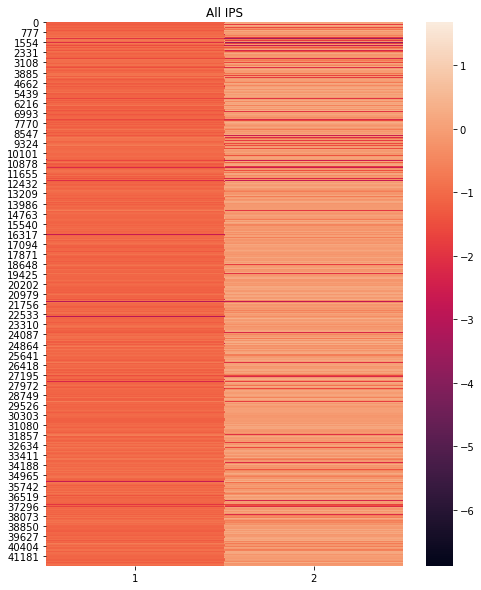

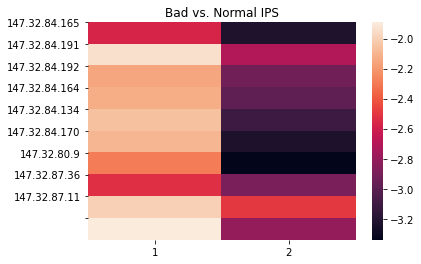

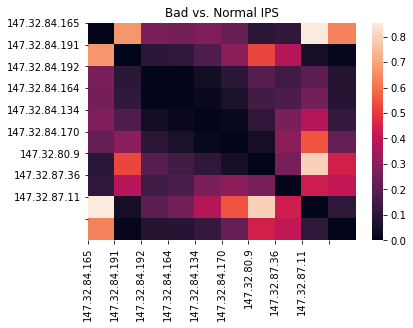

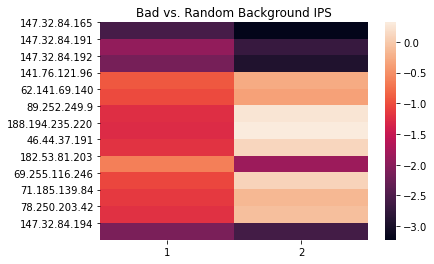

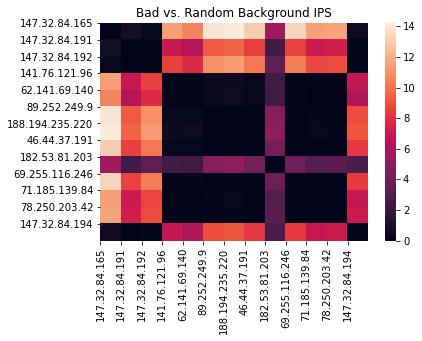

--------------------------------------------------
n_walks: 5, walk_length: 5, representation_size: 2, window_size: 4 Running Time:  24.05613398551941


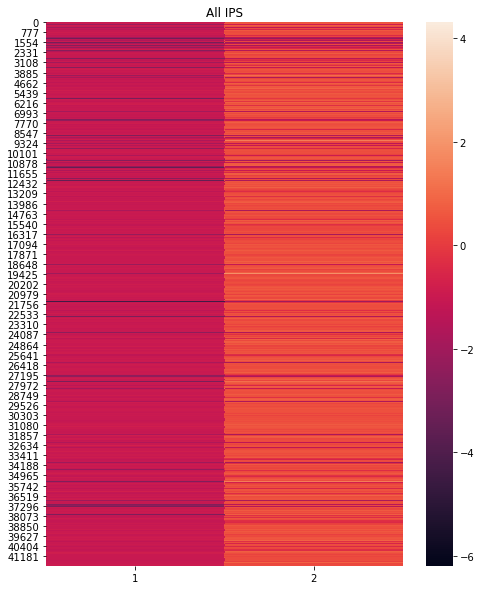

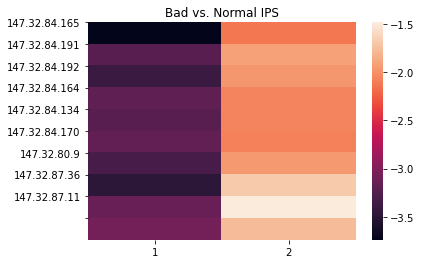

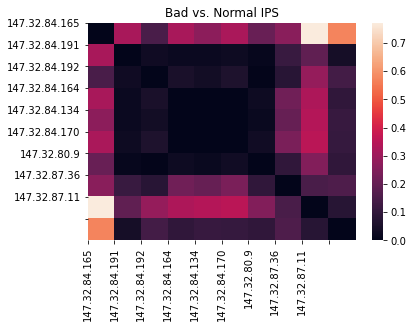

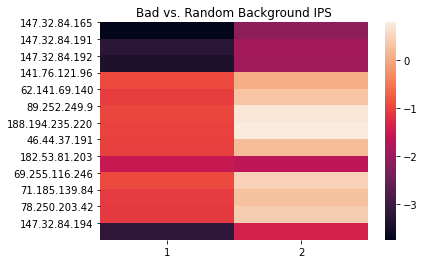

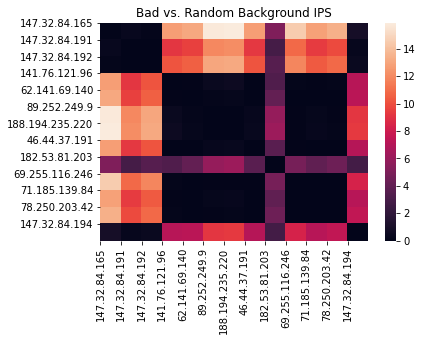

--------------------------------------------------
n_walks: 5, walk_length: 10, representation_size: 2, window_size: 2 Running Time:  35.23605489730835


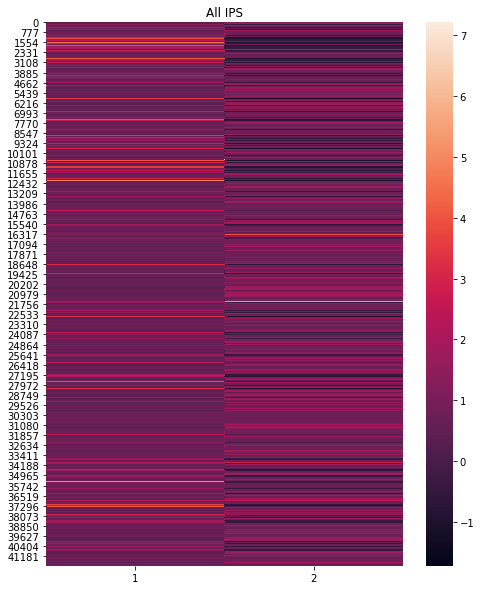

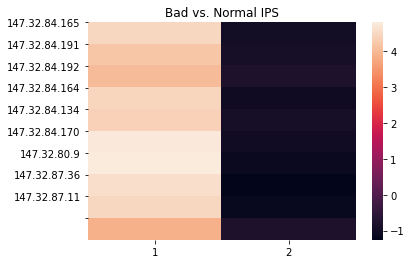

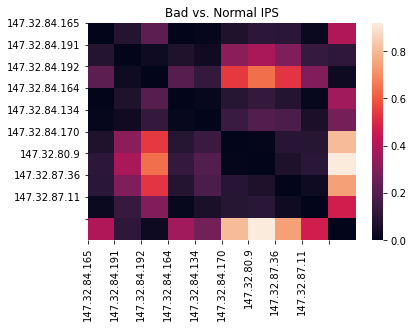

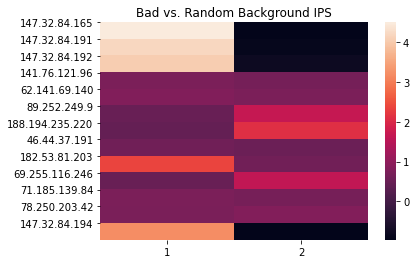

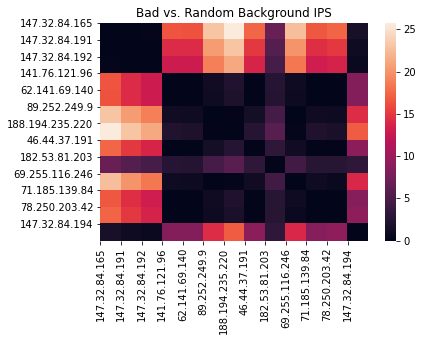

--------------------------------------------------
n_walks: 5, walk_length: 10, representation_size: 2, window_size: 4 Running Time:  42.028855323791504


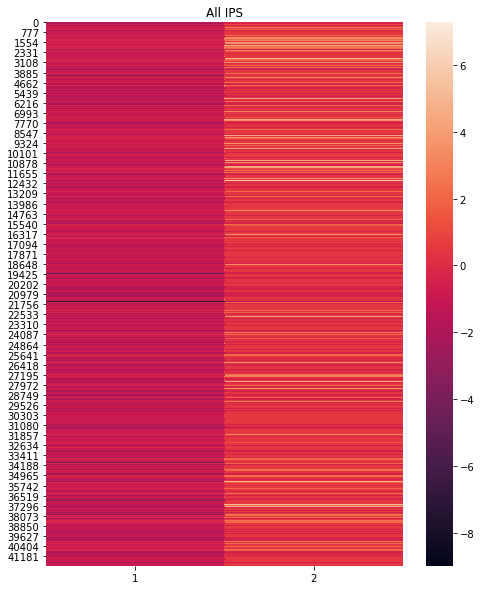

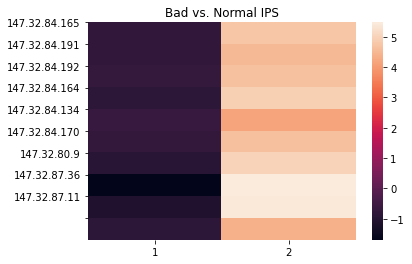

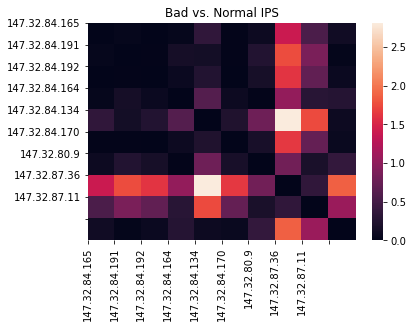

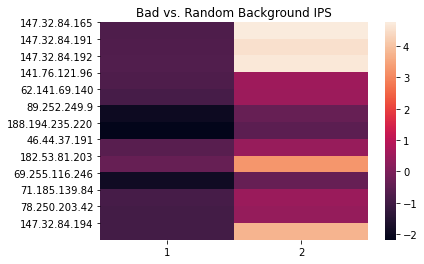

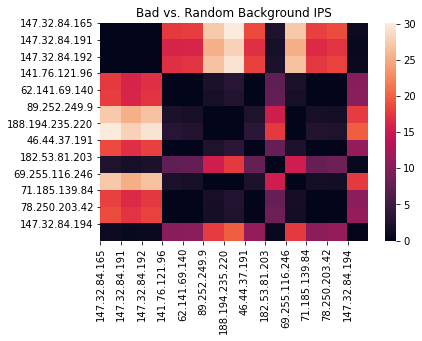

--------------------------------------------------
n_walks: 10, walk_length: 2, representation_size: 2, window_size: 2 Running Time:  14.688122510910034


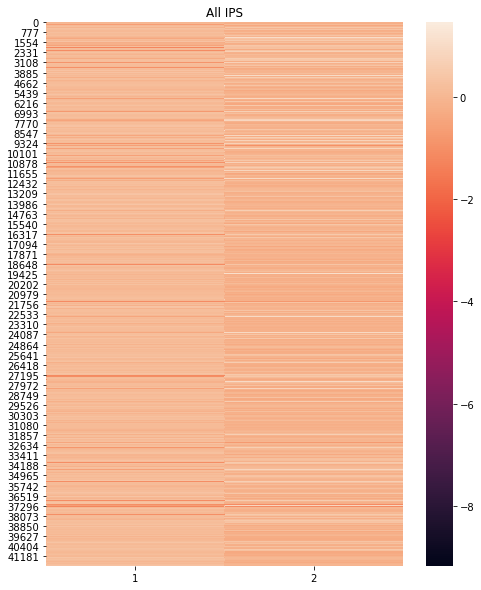

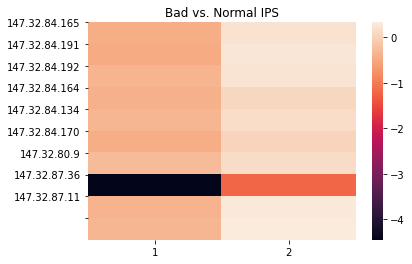

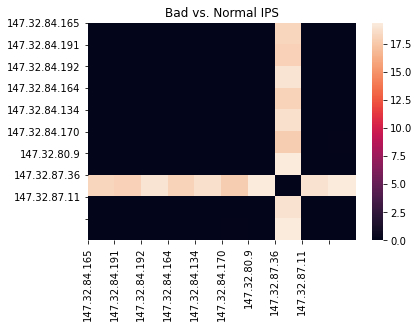

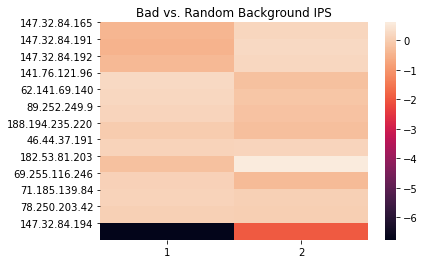

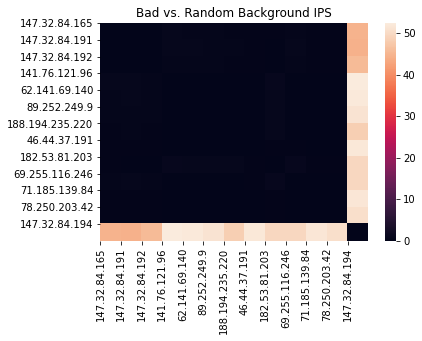

--------------------------------------------------
n_walks: 10, walk_length: 2, representation_size: 2, window_size: 4 Running Time:  15.033198356628418


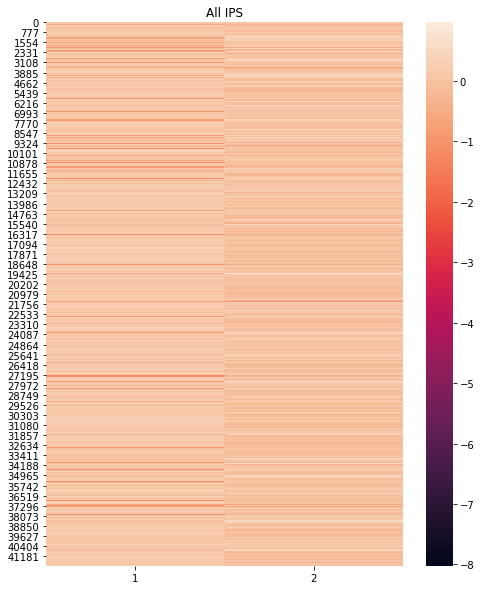

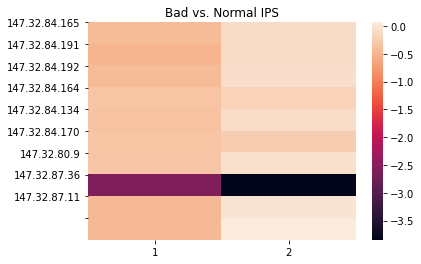

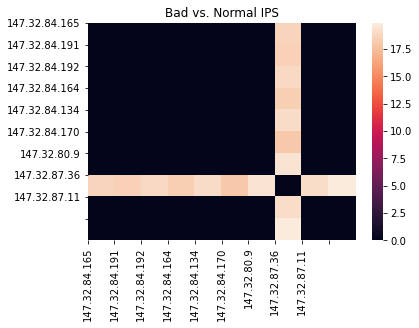

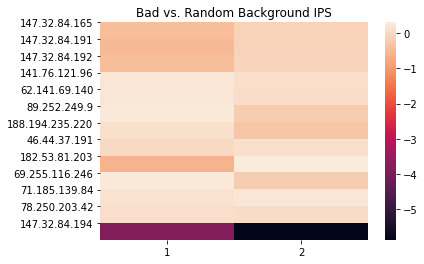

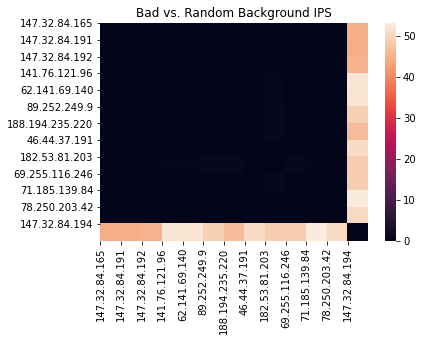

--------------------------------------------------
n_walks: 10, walk_length: 5, representation_size: 2, window_size: 2 Running Time:  35.58731698989868


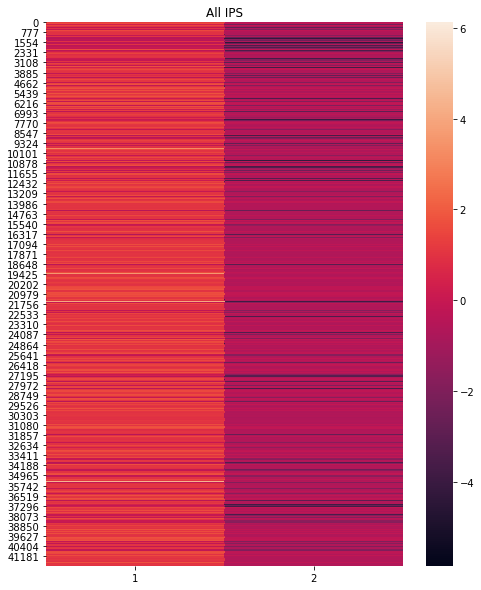

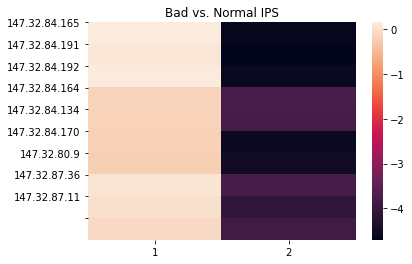

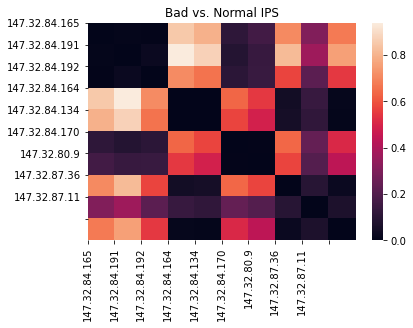

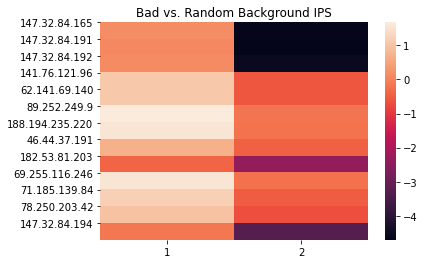

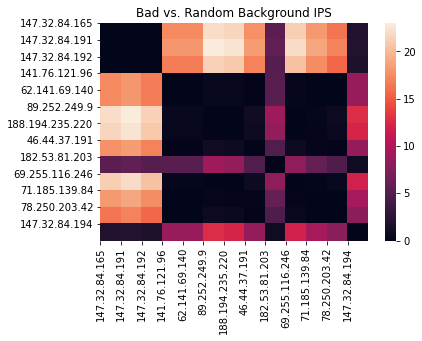

--------------------------------------------------
n_walks: 10, walk_length: 5, representation_size: 2, window_size: 4 Running Time:  37.3343300819397


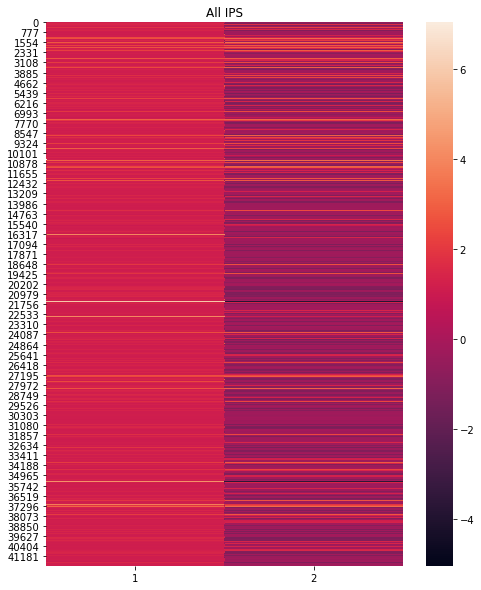

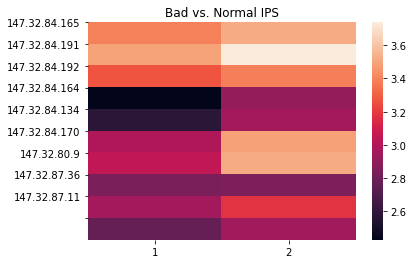

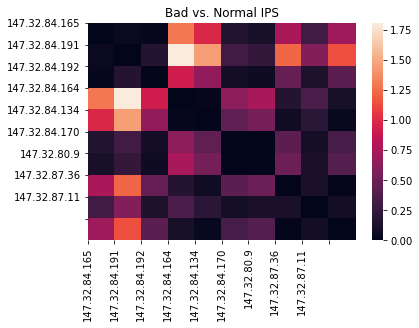

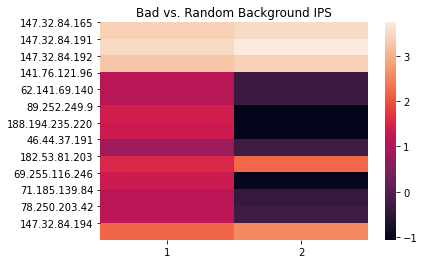

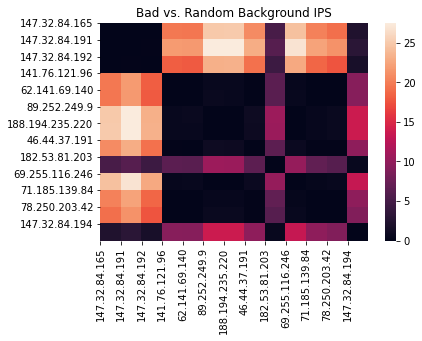

--------------------------------------------------
n_walks: 10, walk_length: 10, representation_size: 2, window_size: 2 Running Time:  61.36898851394653


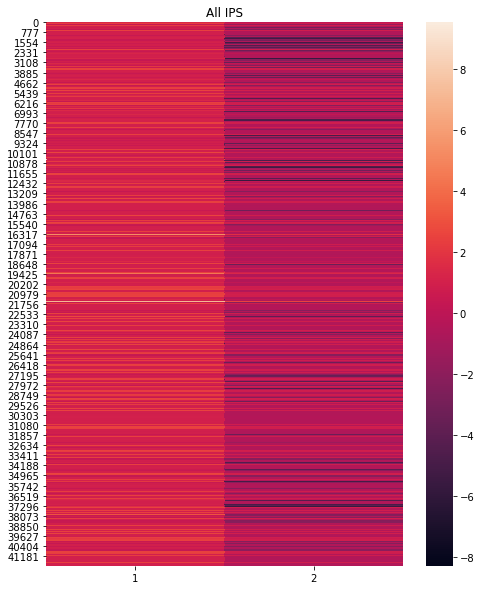

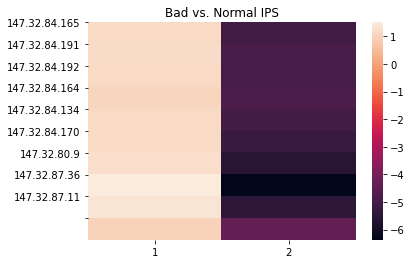

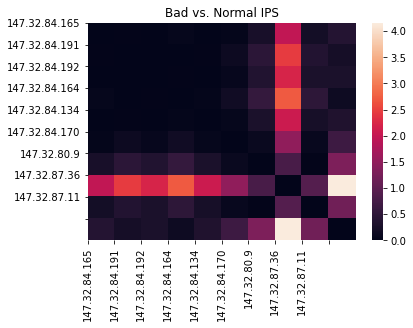

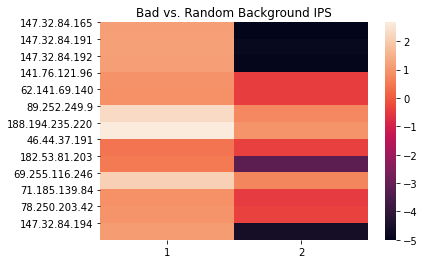

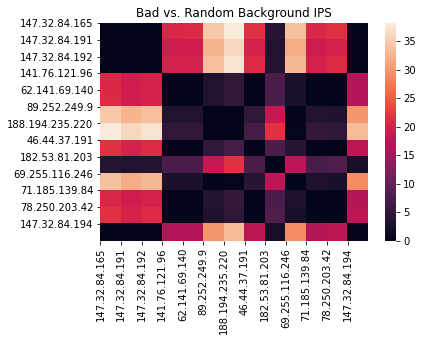

--------------------------------------------------
n_walks: 10, walk_length: 10, representation_size: 2, window_size: 4 Running Time:  76.4755744934082


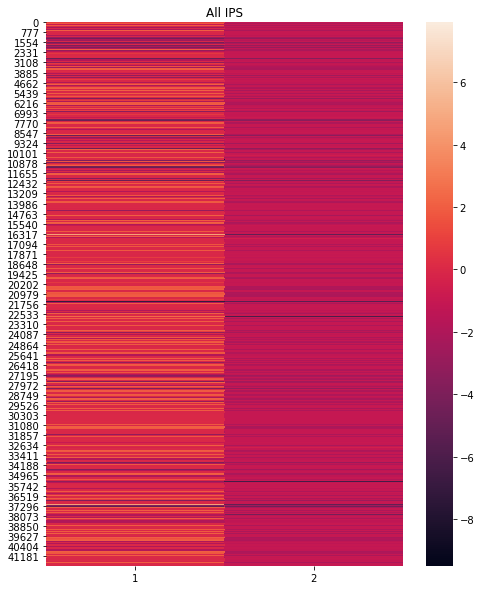

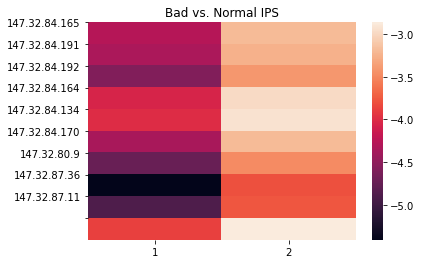

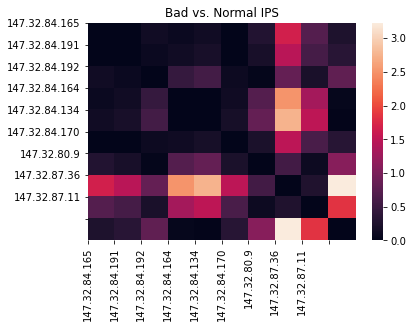

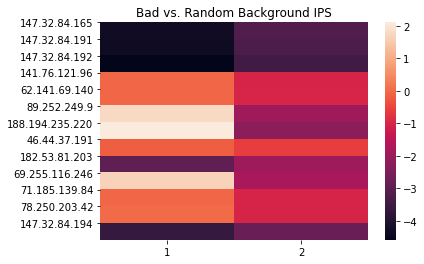

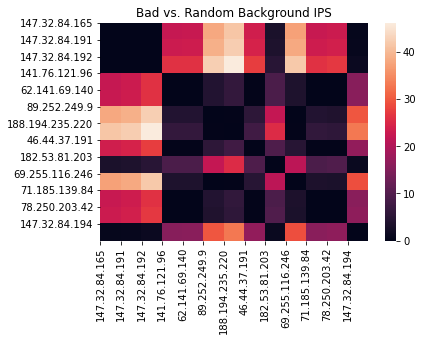

In [18]:
for representation_size in [2]:
    for n_walks in [5, 10]:
        for walk_length in [2, 5, 10]:
            for window_size in [2, 4]:
                run_deepwalk(G, 
                             n_walks=n_walks, 
                             walk_length=walk_length, 
                             representation_size=representation_size, 
                             window_size=window_size, 
                             n_jobs=1)
        

# 4 dimensions

--------------------------------------------------
n_walks: 5, walk_length: 2, representation_size: 4, window_size: 2 Running Time:  11.89627480506897


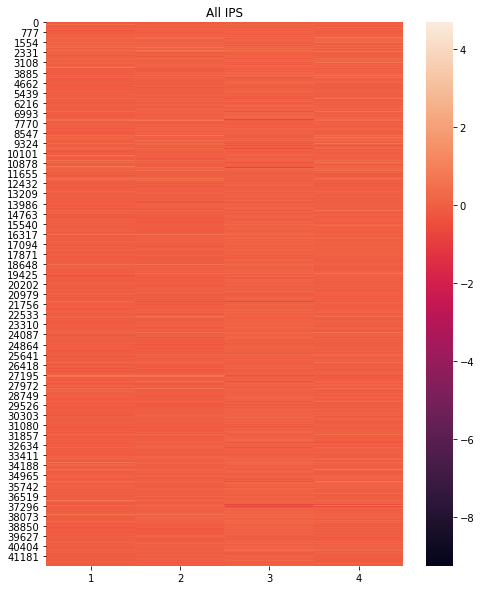

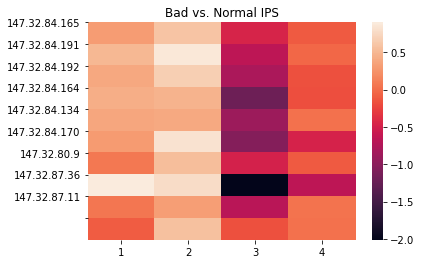

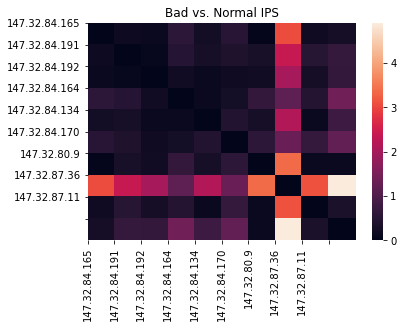

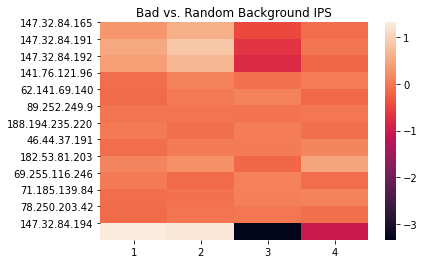

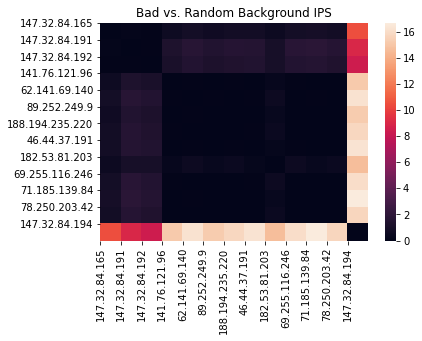

--------------------------------------------------
n_walks: 5, walk_length: 2, representation_size: 4, window_size: 4 Running Time:  11.826414585113525


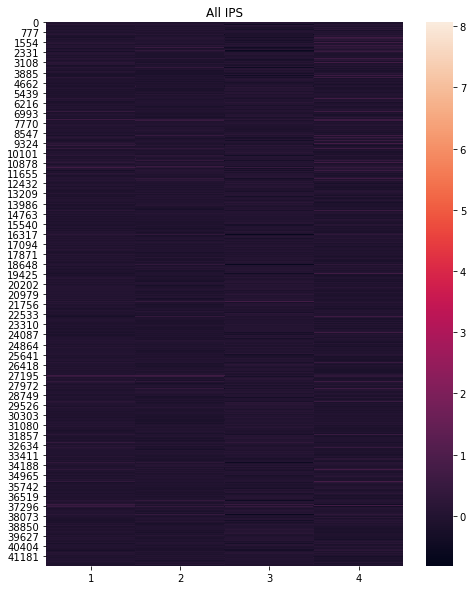

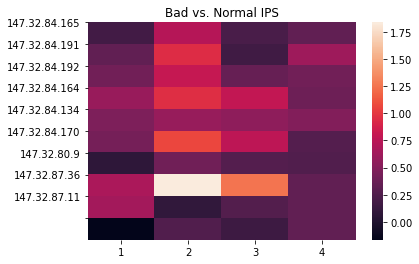

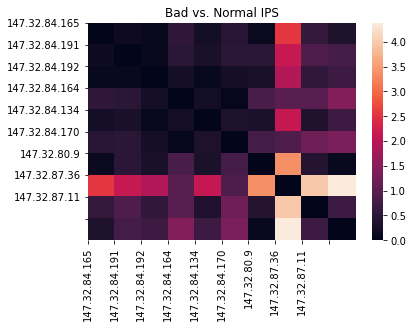

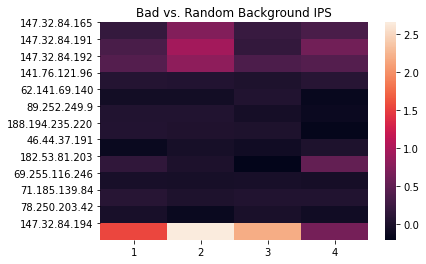

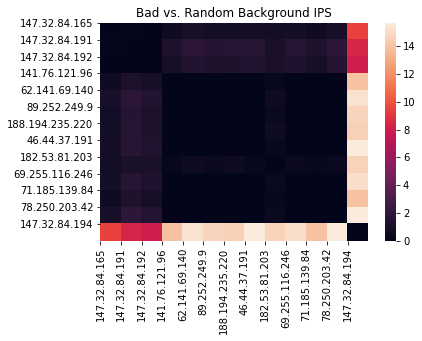

--------------------------------------------------
n_walks: 5, walk_length: 5, representation_size: 4, window_size: 2 Running Time:  23.1401104927063


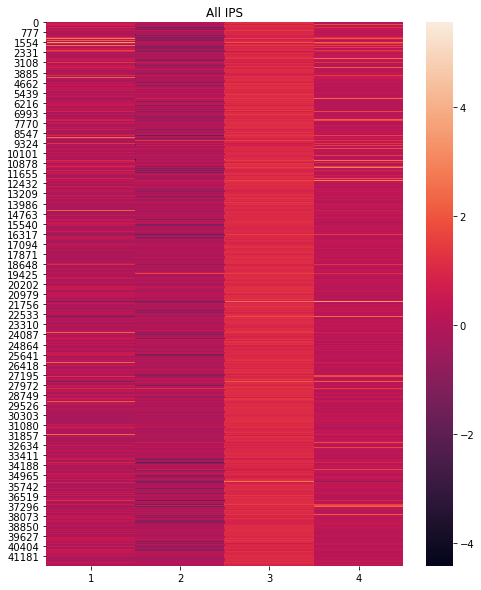

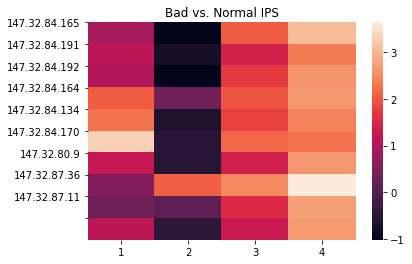

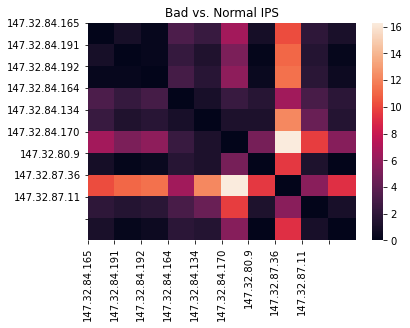

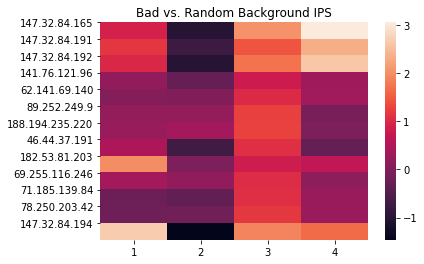

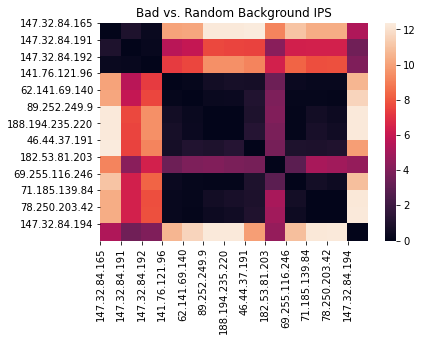

--------------------------------------------------
n_walks: 5, walk_length: 5, representation_size: 4, window_size: 4 Running Time:  24.5364248752594


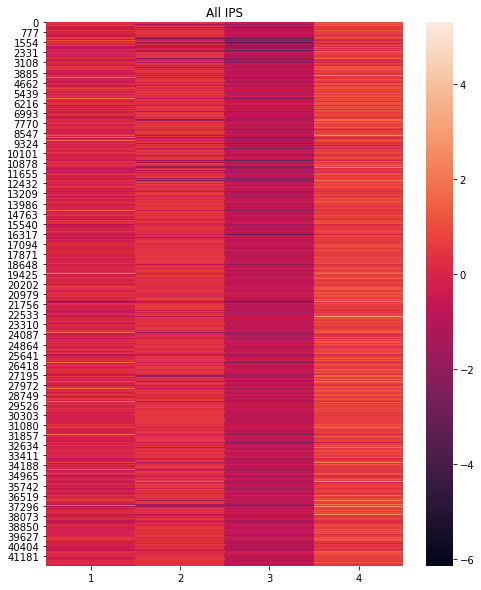

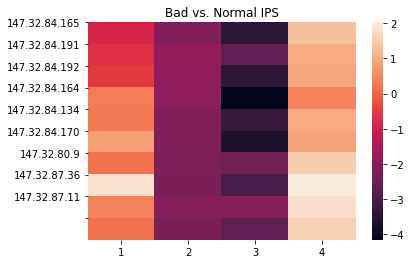

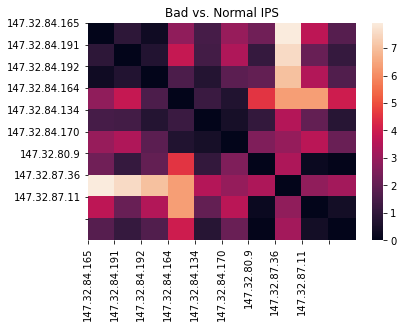

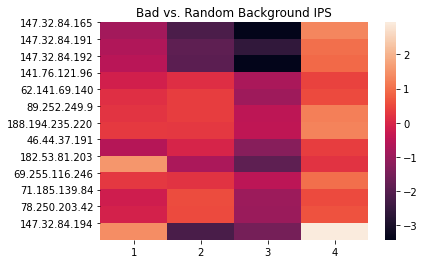

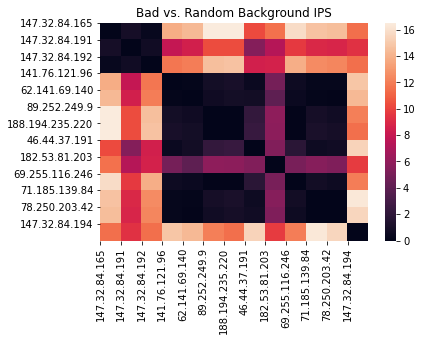

--------------------------------------------------
n_walks: 5, walk_length: 10, representation_size: 4, window_size: 2 Running Time:  36.62625169754028


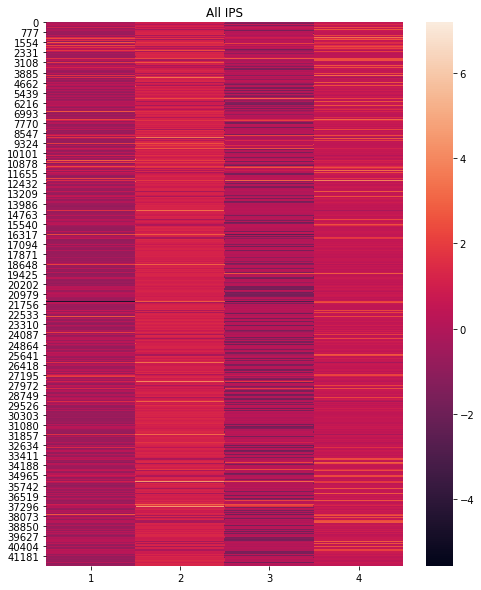

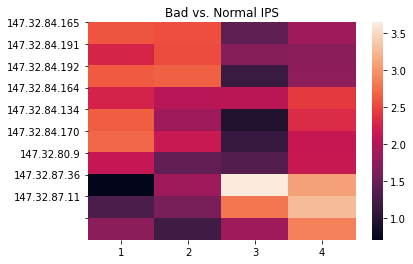

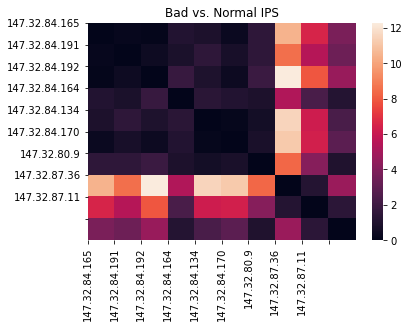

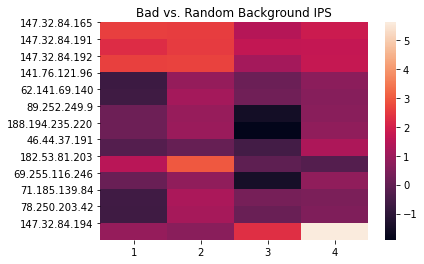

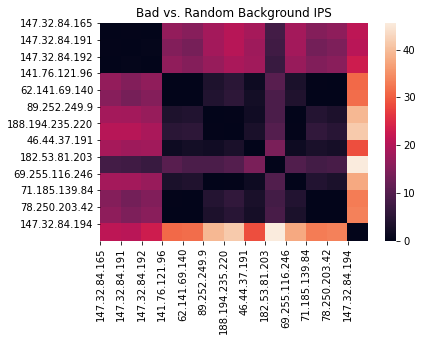

--------------------------------------------------
n_walks: 5, walk_length: 10, representation_size: 4, window_size: 4 Running Time:  43.685046911239624


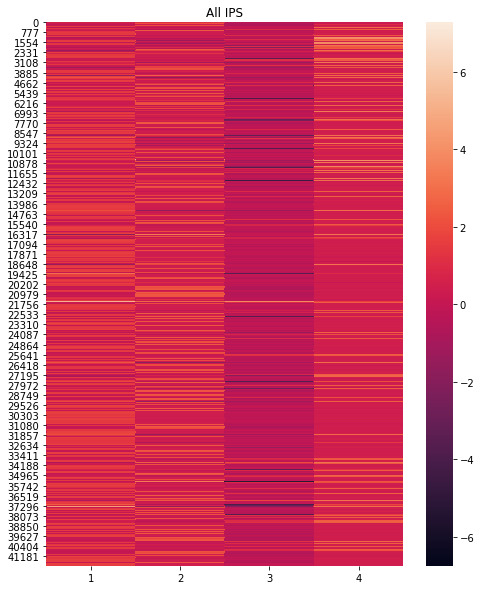

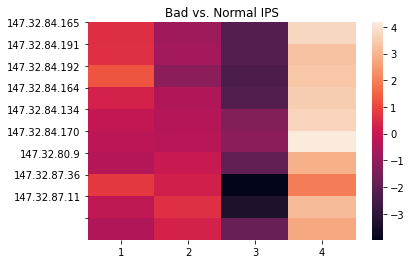

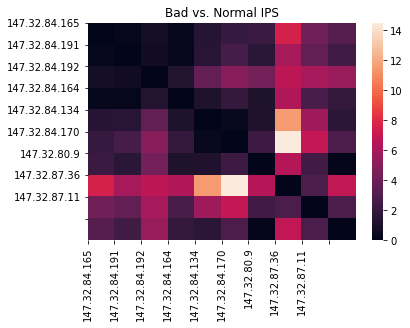

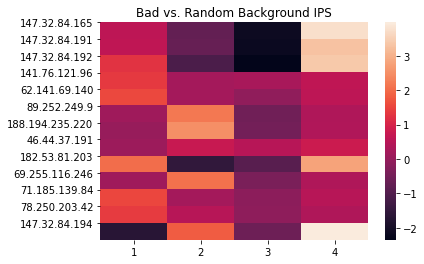

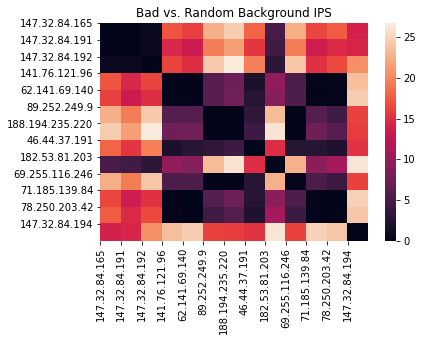

--------------------------------------------------
n_walks: 10, walk_length: 2, representation_size: 4, window_size: 2 Running Time:  14.962116956710815


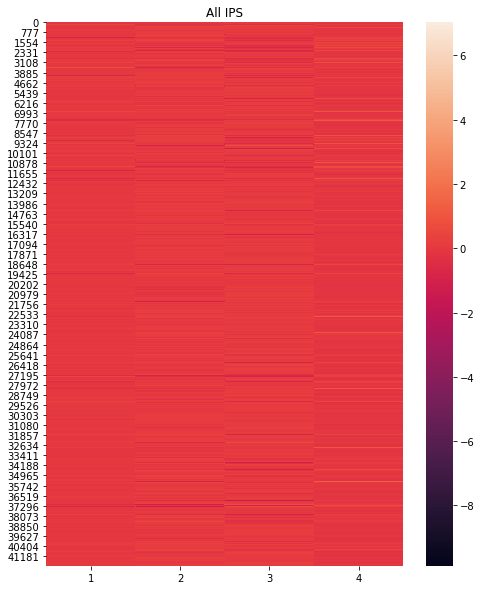

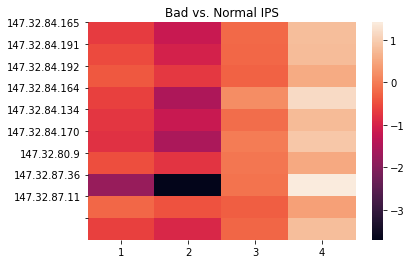

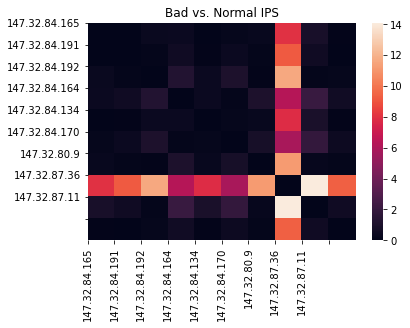

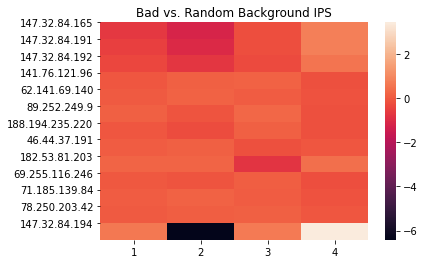

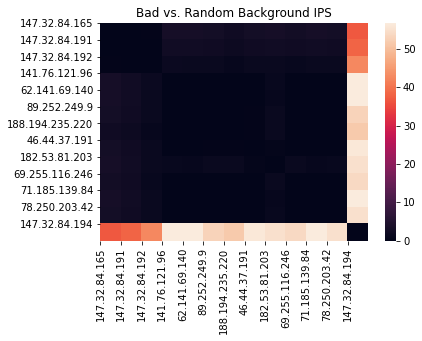

--------------------------------------------------
n_walks: 10, walk_length: 2, representation_size: 4, window_size: 4 Running Time:  14.842242240905762


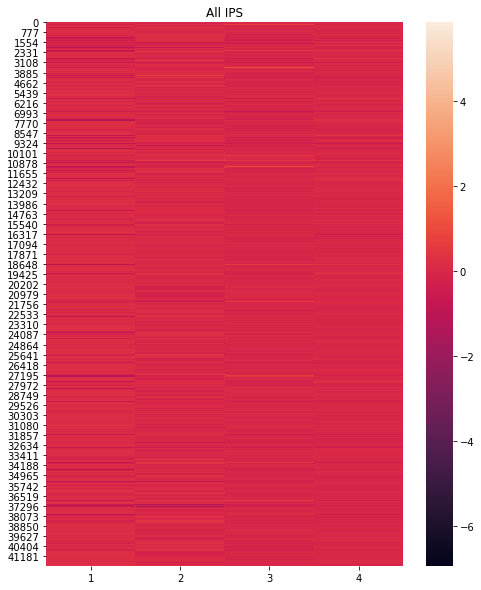

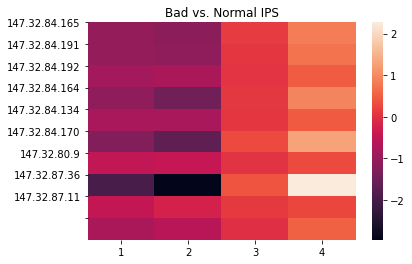

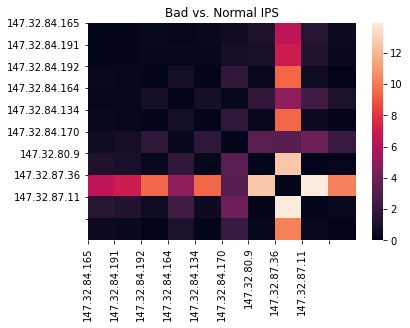

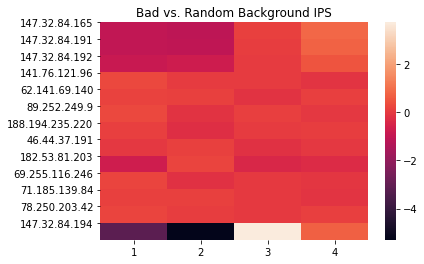

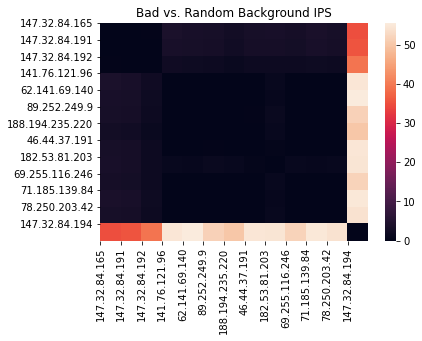

--------------------------------------------------
n_walks: 10, walk_length: 5, representation_size: 4, window_size: 2 Running Time:  36.22246217727661


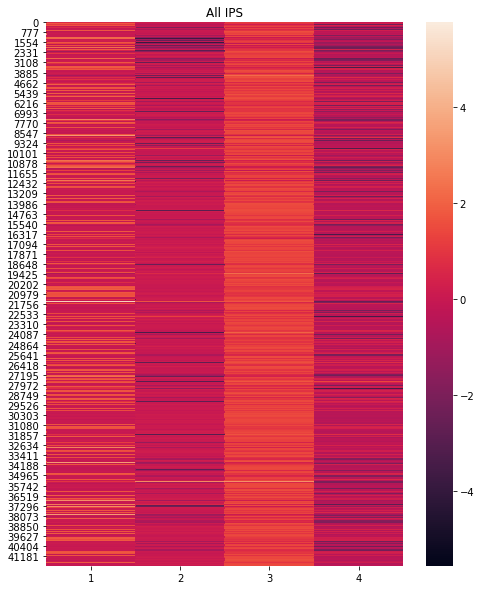

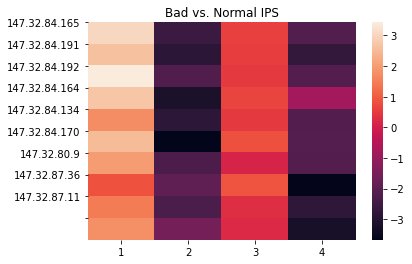

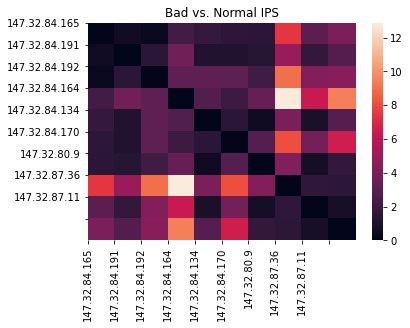

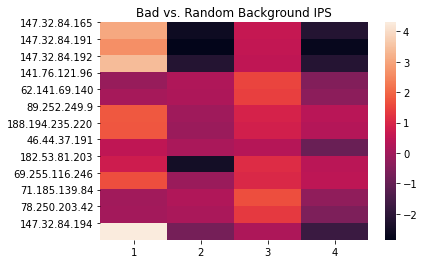

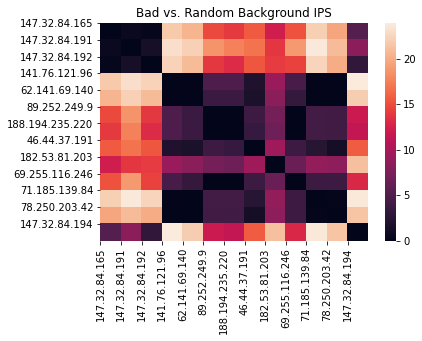

--------------------------------------------------
n_walks: 10, walk_length: 5, representation_size: 4, window_size: 4 Running Time:  39.35176682472229


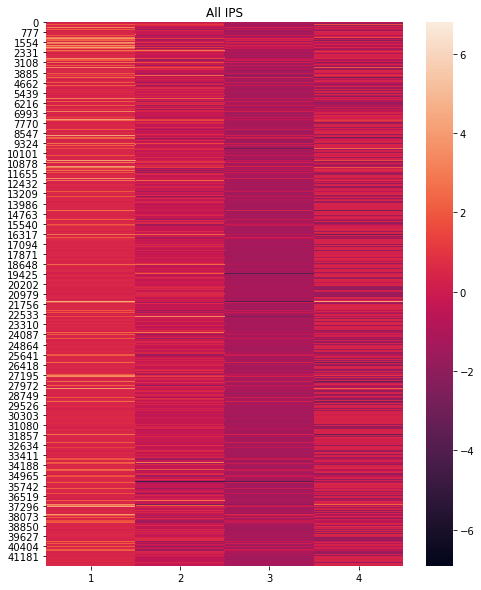

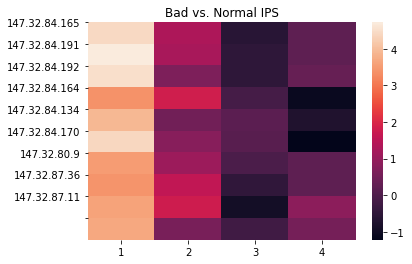

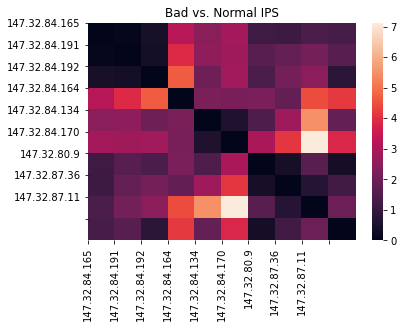

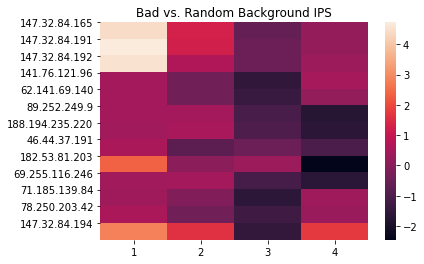

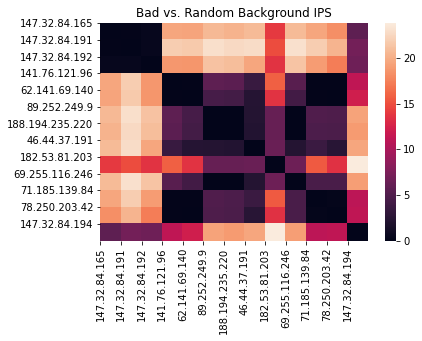

--------------------------------------------------
n_walks: 10, walk_length: 10, representation_size: 4, window_size: 2 Running Time:  65.09291243553162


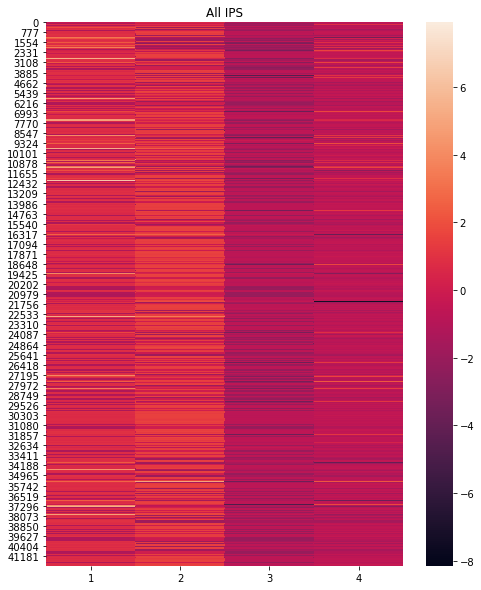

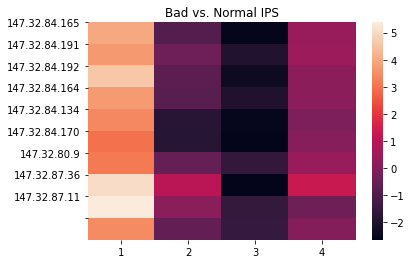

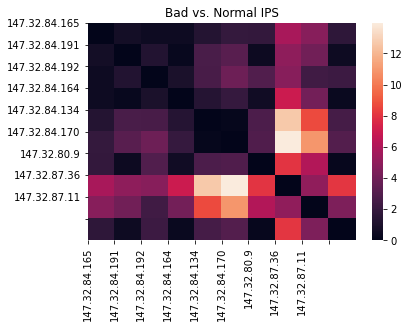

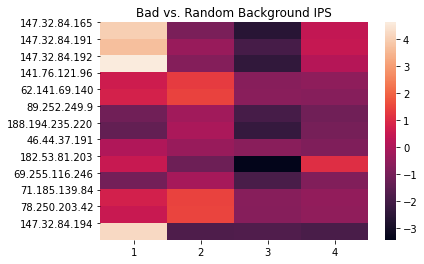

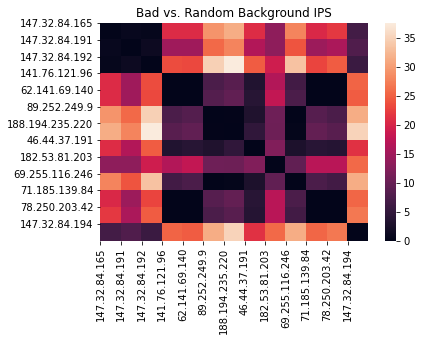

--------------------------------------------------
n_walks: 10, walk_length: 10, representation_size: 4, window_size: 4 Running Time:  77.92446994781494


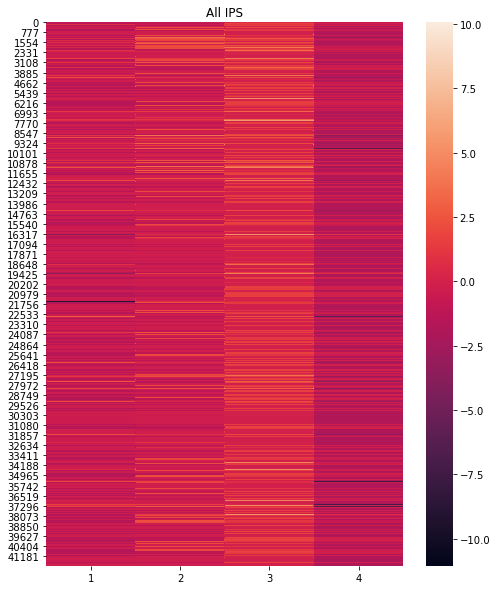

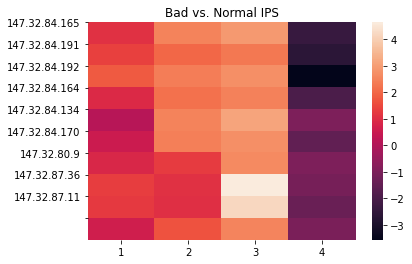

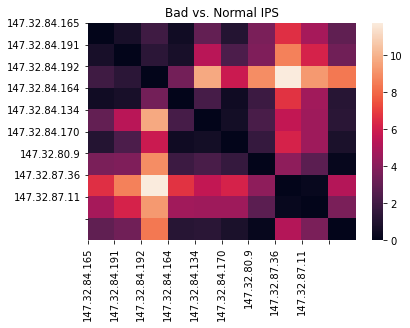

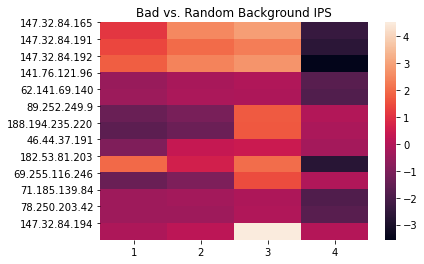

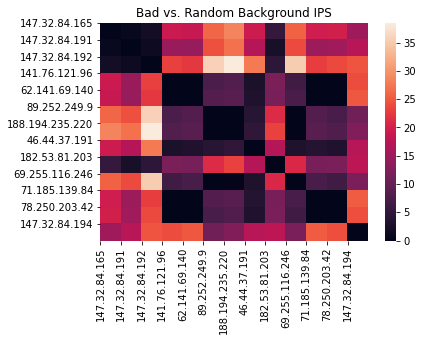

In [19]:
for representation_size in [4]:
    for n_walks in [5, 10]:
        for walk_length in [2, 5, 10]:
            for window_size in [2, 4]:
                run_deepwalk(G, 
                             n_walks=n_walks, 
                             walk_length=walk_length, 
                             representation_size=representation_size, 
                             window_size=window_size, 
                             n_jobs=1)
        

# 8 dimensions

--------------------------------------------------
n_walks: 5, walk_length: 2, representation_size: 8, window_size: 2 Running Time:  12.041018009185791


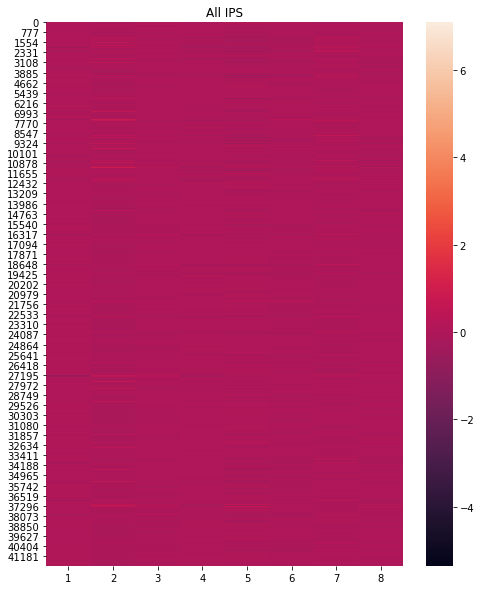

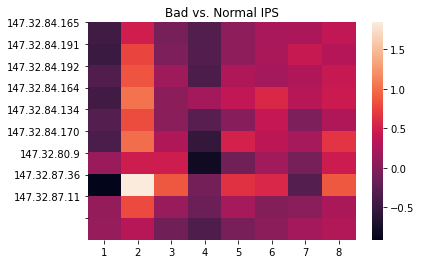

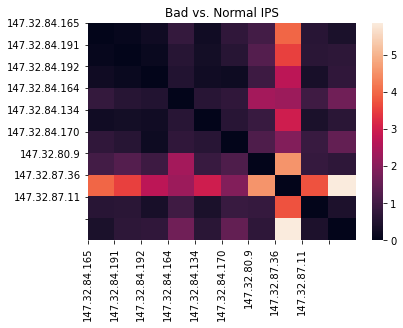

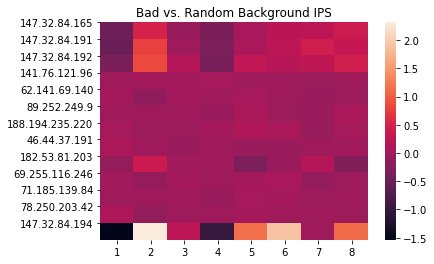

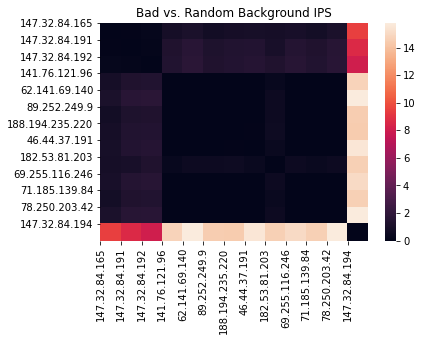

--------------------------------------------------
n_walks: 5, walk_length: 2, representation_size: 8, window_size: 4 Running Time:  12.255308866500854


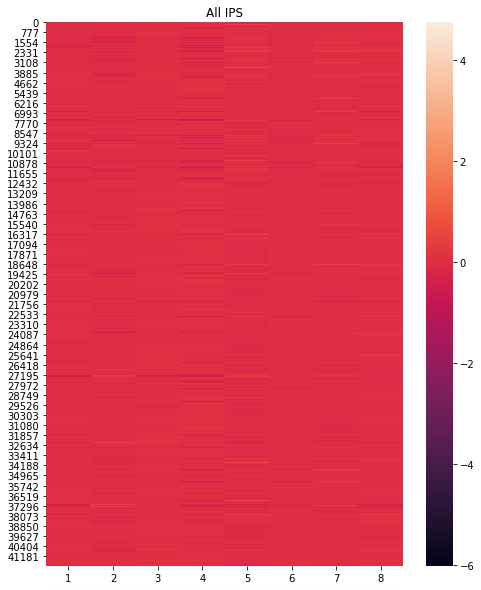

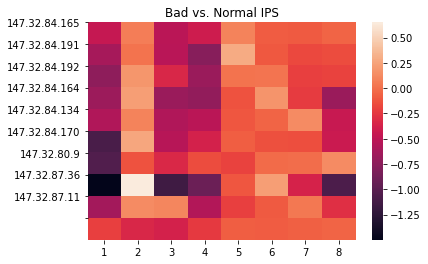

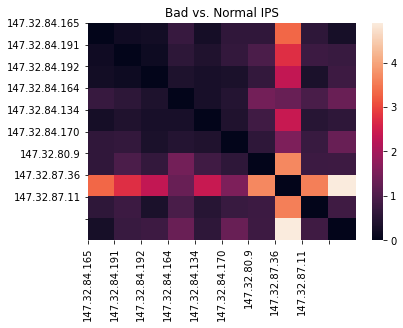

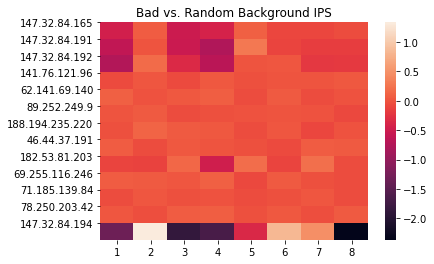

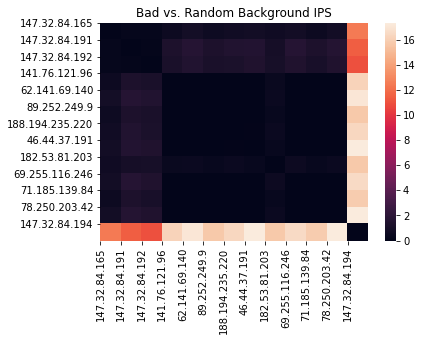

--------------------------------------------------
n_walks: 5, walk_length: 5, representation_size: 8, window_size: 2 Running Time:  24.7269127368927


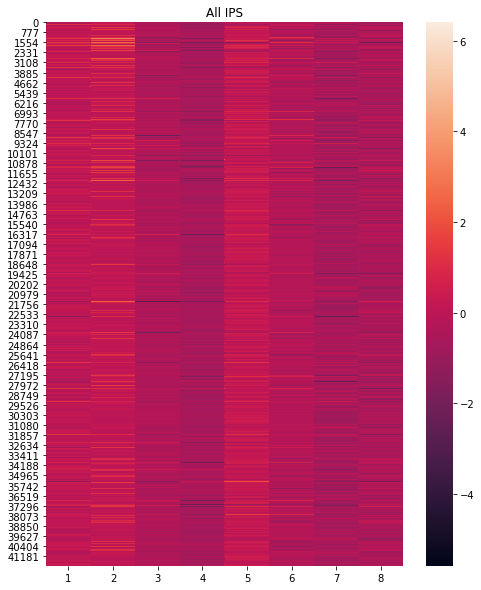

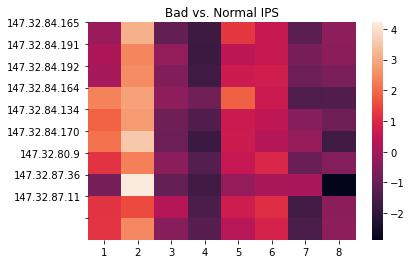

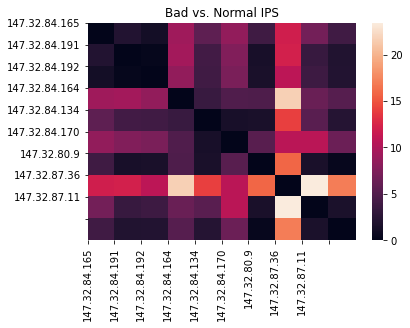

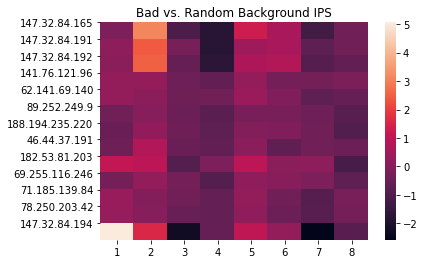

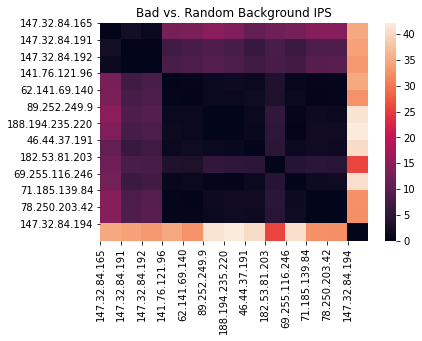

--------------------------------------------------
n_walks: 5, walk_length: 5, representation_size: 8, window_size: 4 Running Time:  26.326721668243408


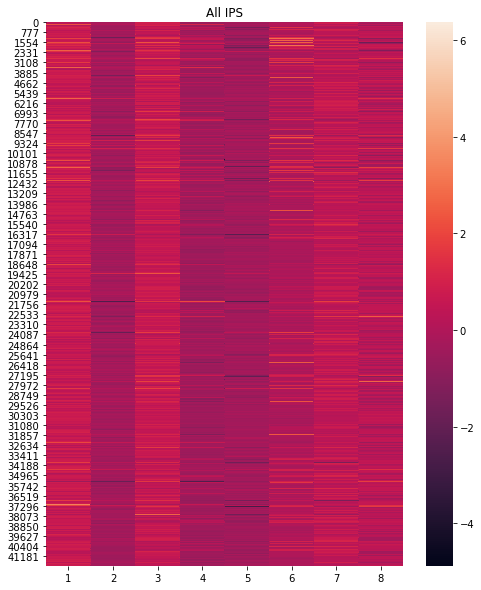

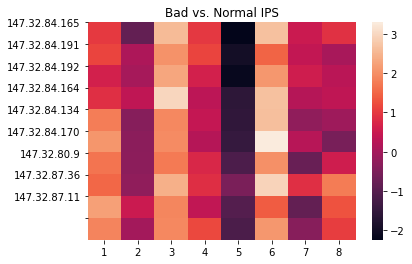

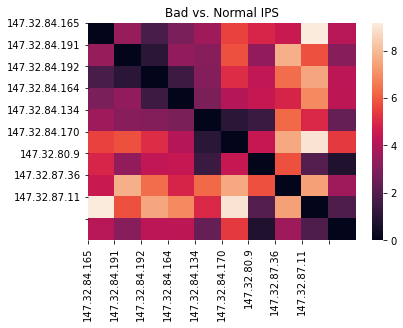

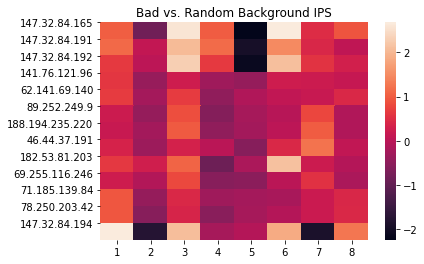

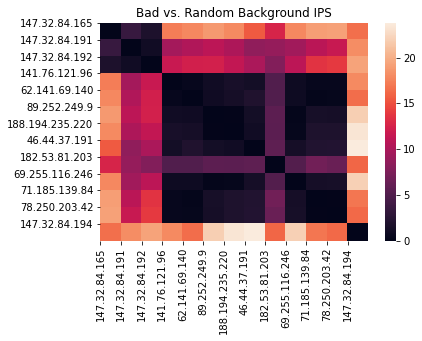

--------------------------------------------------
n_walks: 5, walk_length: 10, representation_size: 8, window_size: 2 Running Time:  40.49869179725647


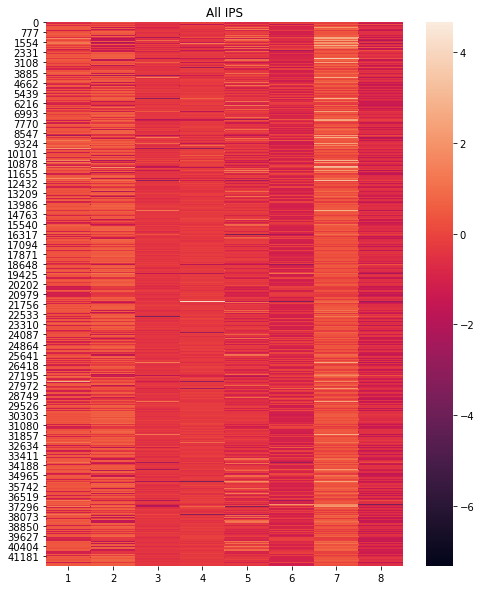

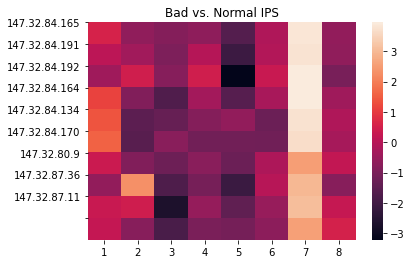

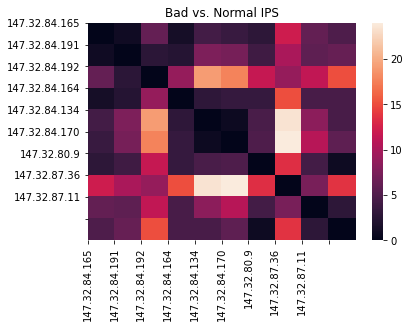

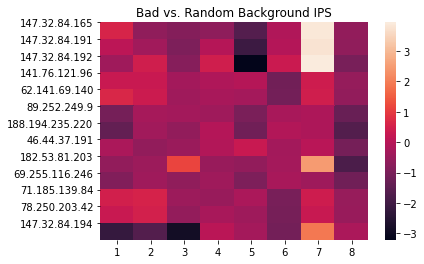

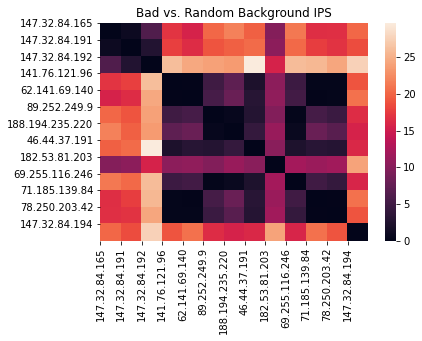

--------------------------------------------------
n_walks: 5, walk_length: 10, representation_size: 8, window_size: 4 Running Time:  49.21334981918335


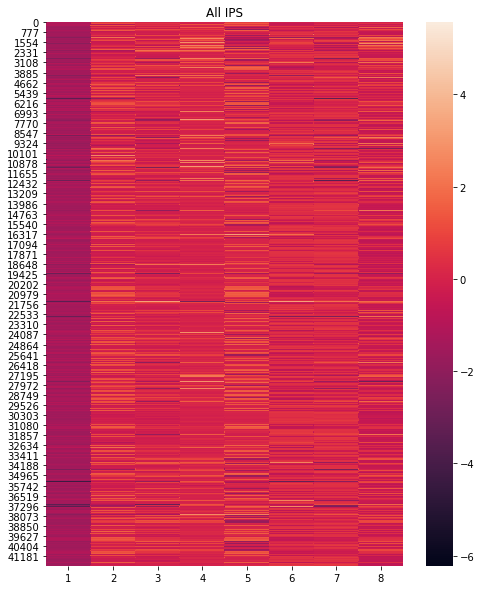

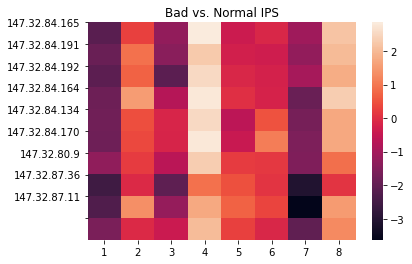

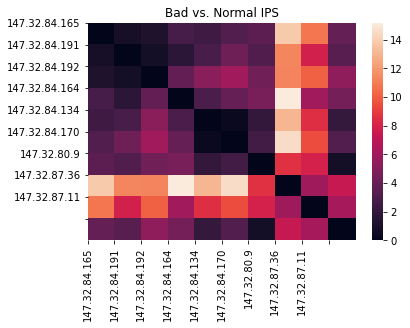

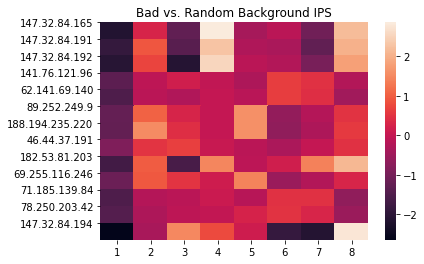

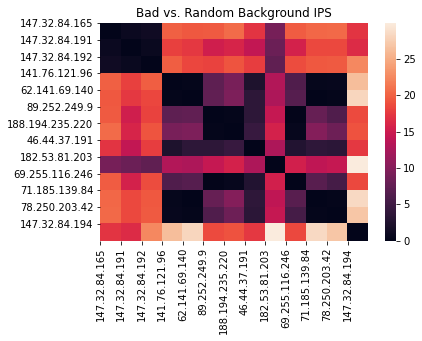

--------------------------------------------------
n_walks: 10, walk_length: 2, representation_size: 8, window_size: 2 Running Time:  15.190608024597168


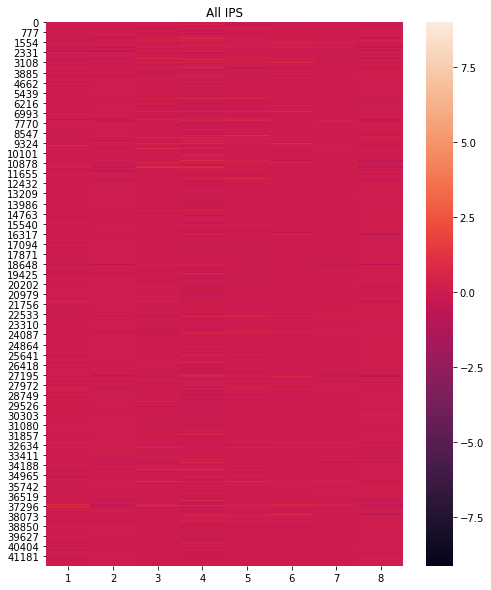

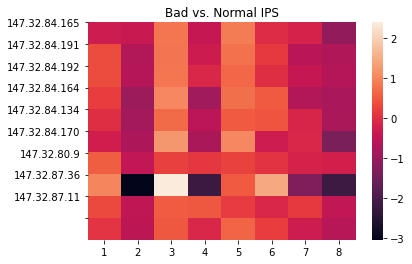

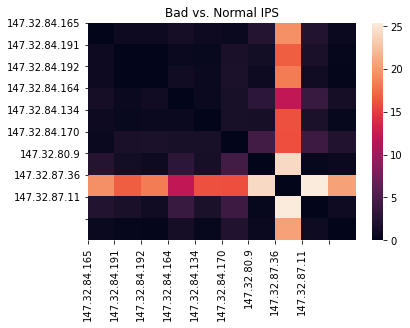

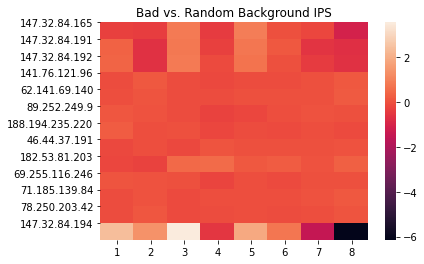

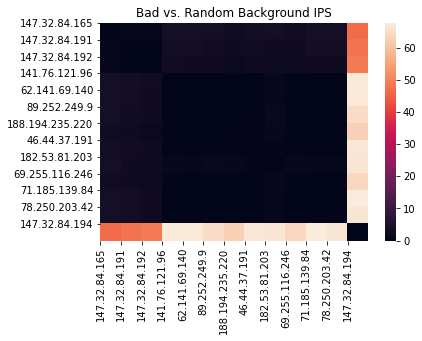

--------------------------------------------------
n_walks: 10, walk_length: 2, representation_size: 8, window_size: 4 Running Time:  16.076131105422974


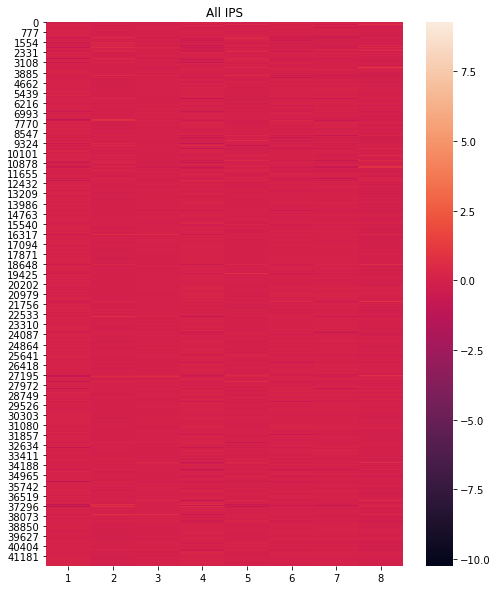

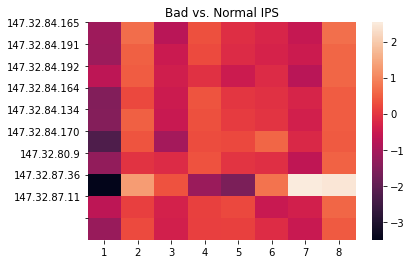

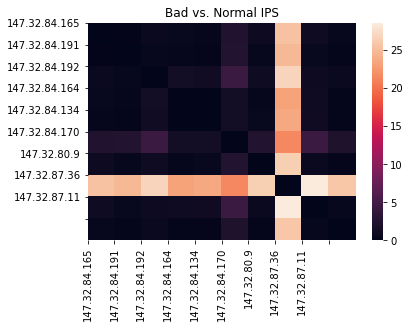

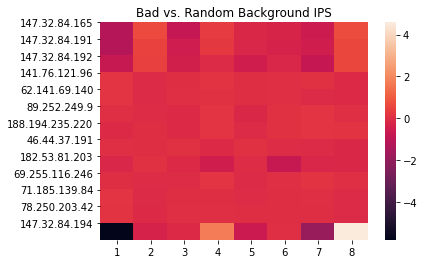

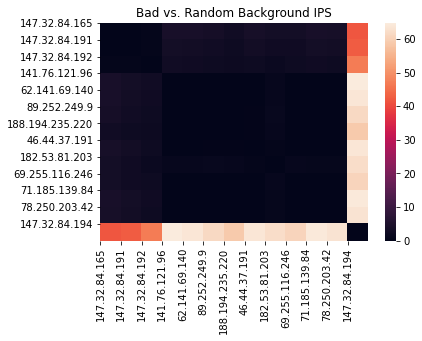

--------------------------------------------------
n_walks: 10, walk_length: 5, representation_size: 8, window_size: 2 Running Time:  41.12516188621521


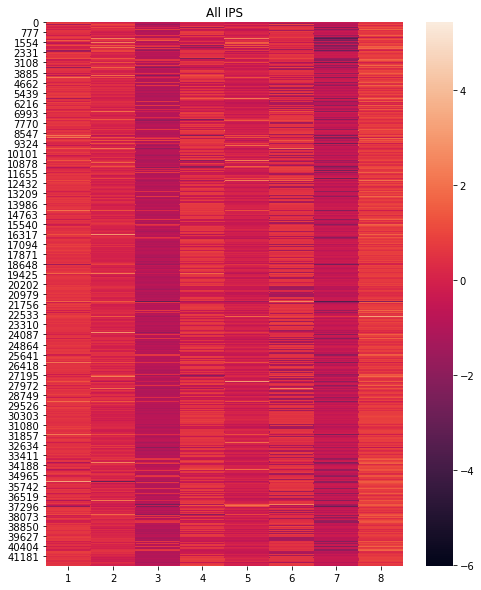

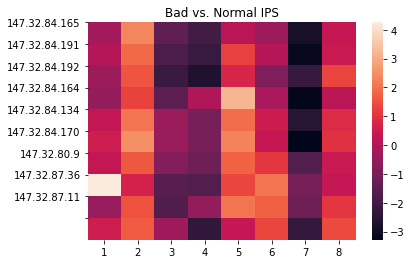

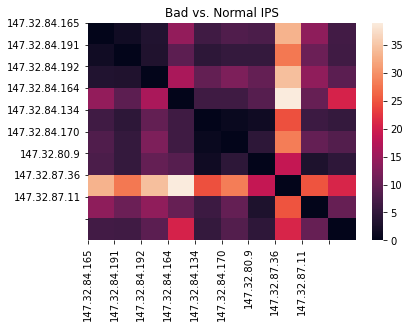

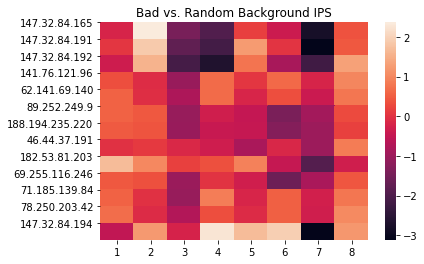

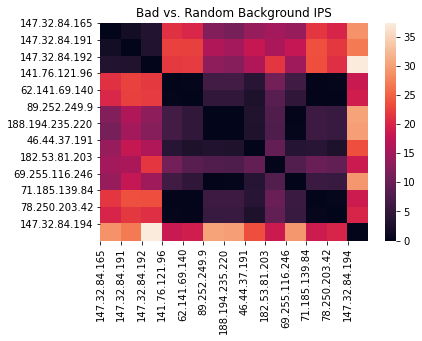

--------------------------------------------------
n_walks: 10, walk_length: 5, representation_size: 8, window_size: 4 Running Time:  42.814539670944214


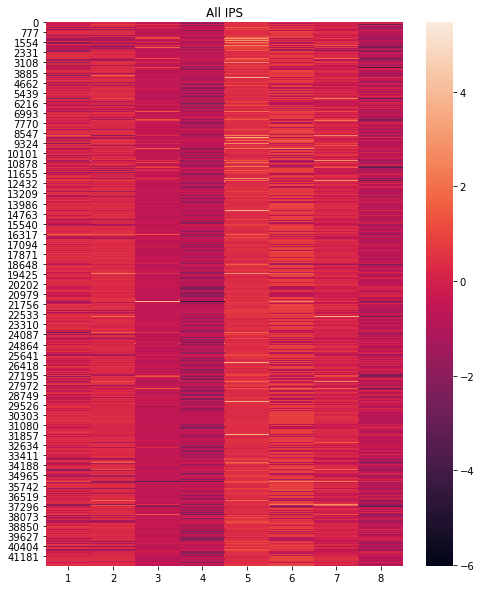

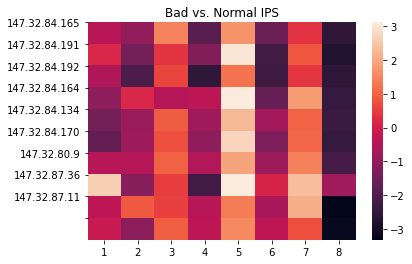

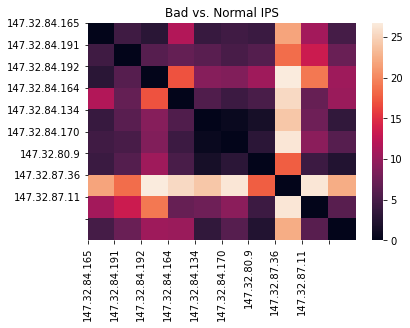

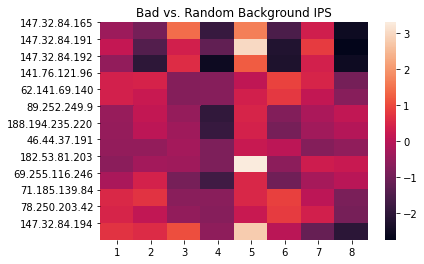

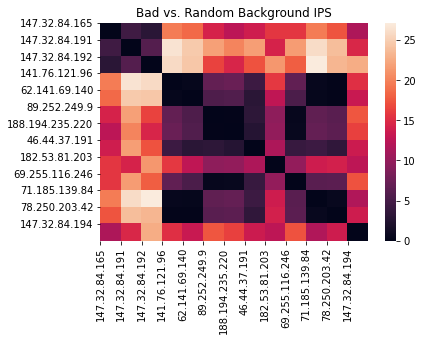

--------------------------------------------------
n_walks: 10, walk_length: 10, representation_size: 8, window_size: 2 Running Time:  72.81814241409302


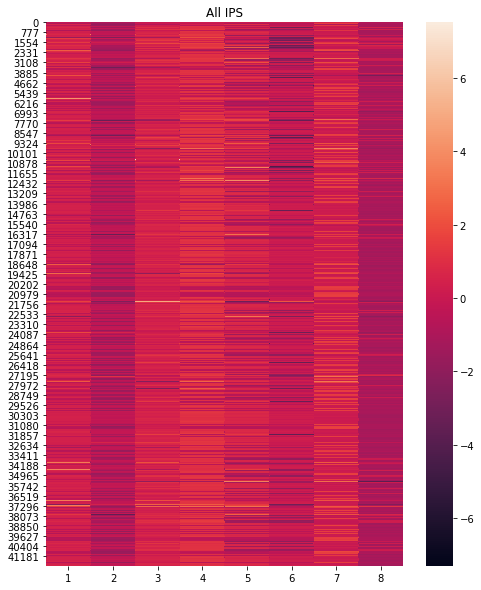

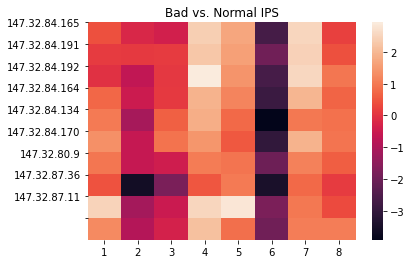

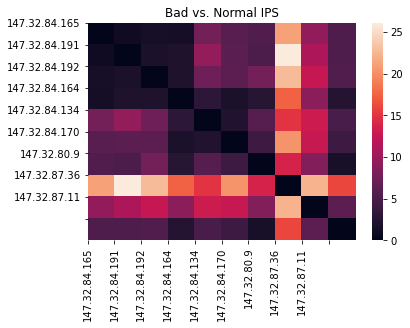

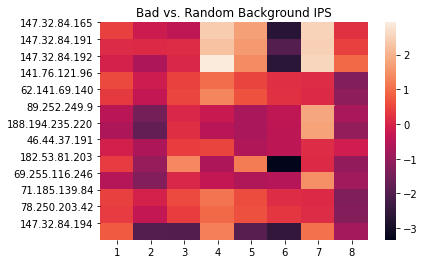

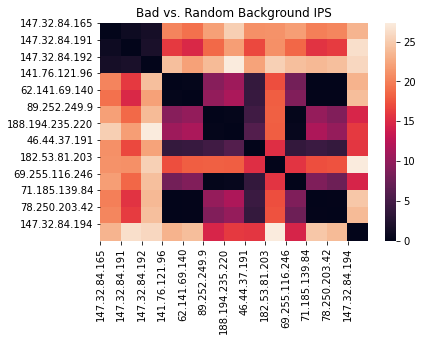

--------------------------------------------------
n_walks: 10, walk_length: 10, representation_size: 8, window_size: 4 Running Time:  88.48426580429077


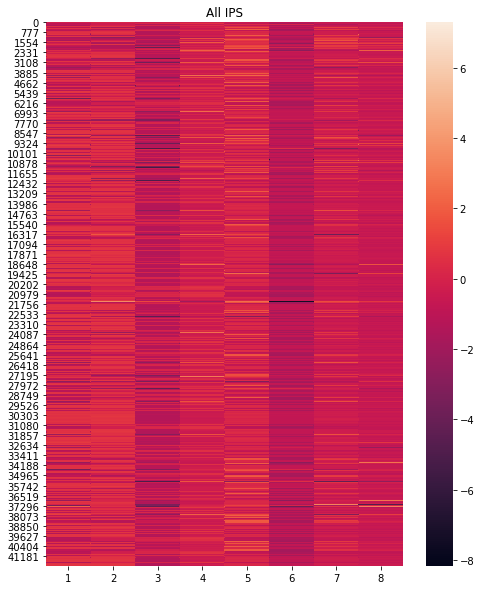

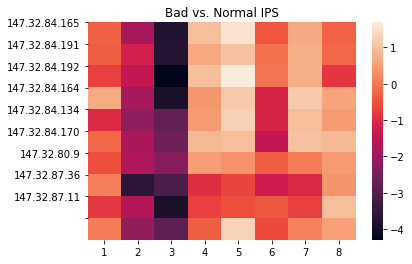

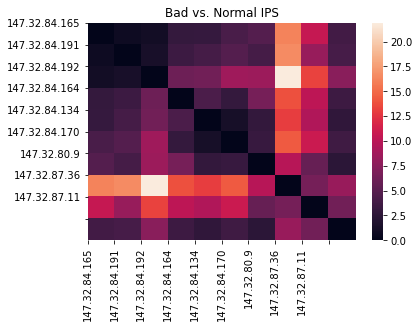

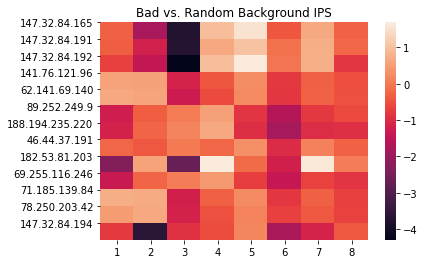

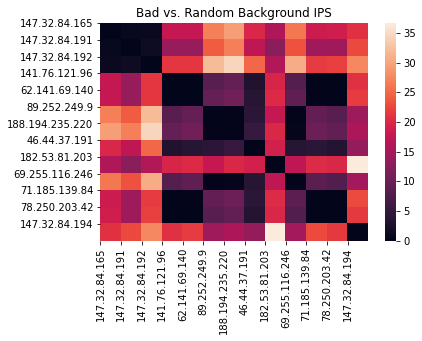

In [20]:
for representation_size in [8]:
    for n_walks in [5, 10]:
        for walk_length in [2, 5, 10]:
            for window_size in [2, 4]:
                run_deepwalk(G, 
                             n_walks=n_walks, 
                             walk_length=walk_length, 
                             representation_size=representation_size, 
                             window_size=window_size, 
                             n_jobs=1)
        

# 12 dimensions

--------------------------------------------------
n_walks: 5, walk_length: 2, representation_size: 12, window_size: 2 Running Time:  12.492681503295898


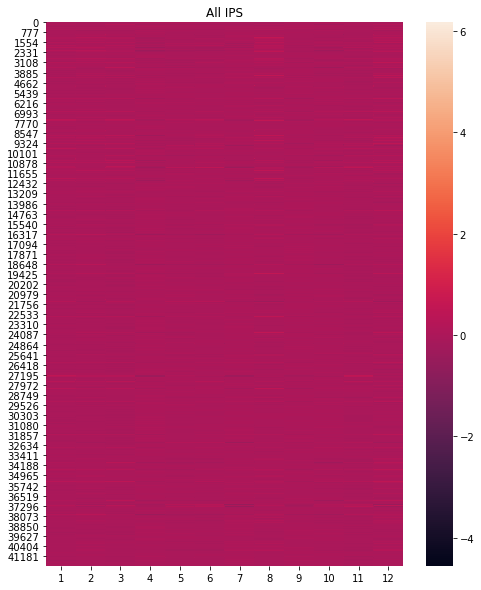

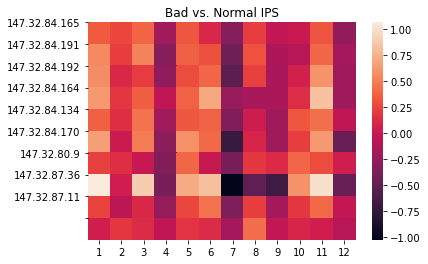

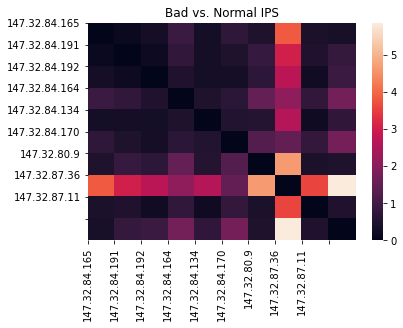

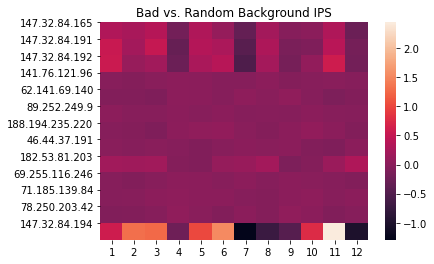

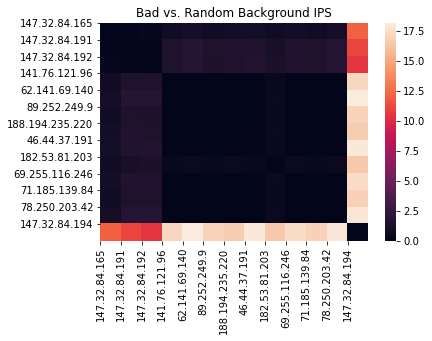

--------------------------------------------------
n_walks: 5, walk_length: 2, representation_size: 12, window_size: 4 Running Time:  13.451921701431274


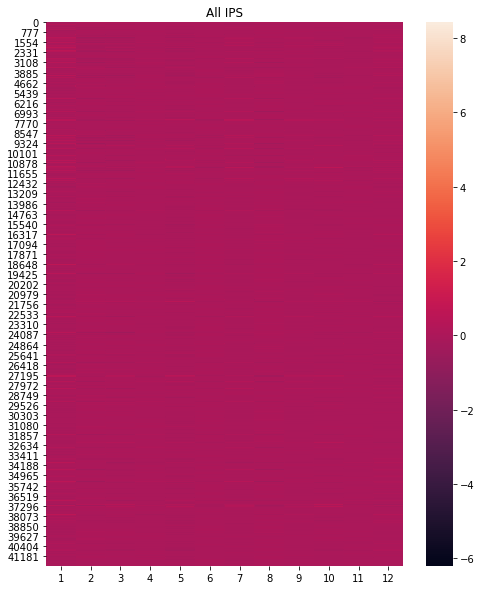

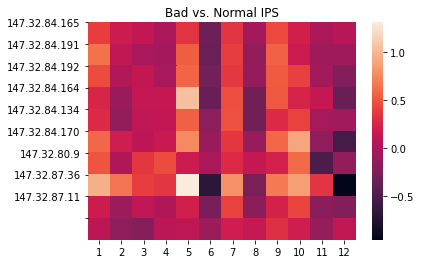

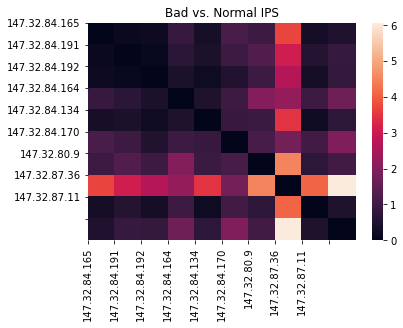

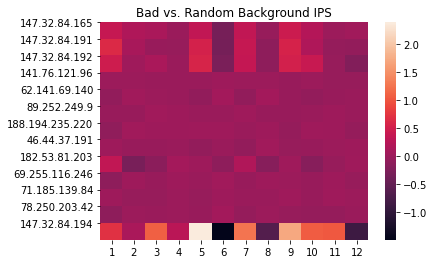

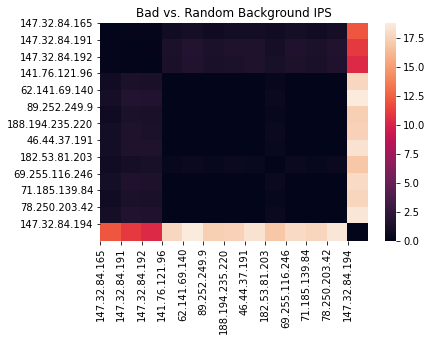

--------------------------------------------------
n_walks: 5, walk_length: 5, representation_size: 12, window_size: 2 Running Time:  27.906129360198975


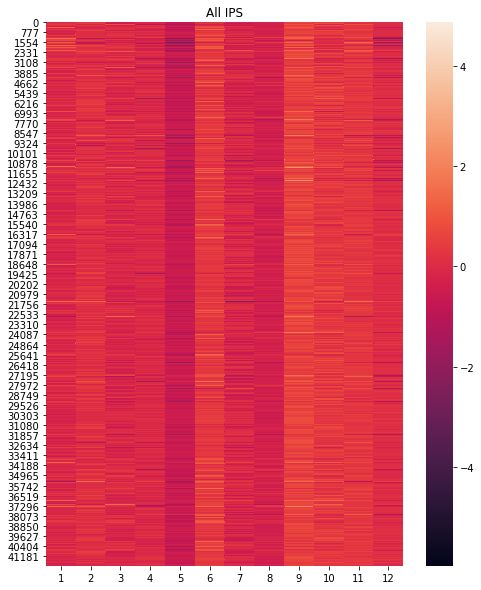

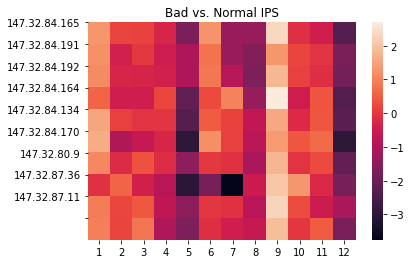

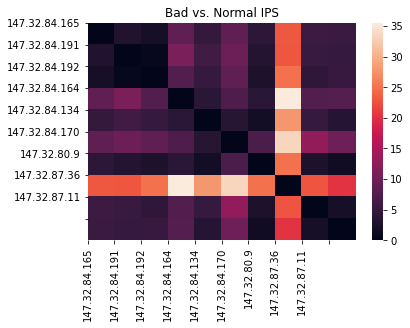

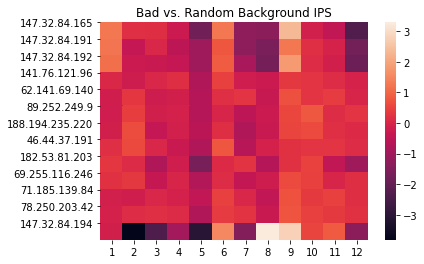

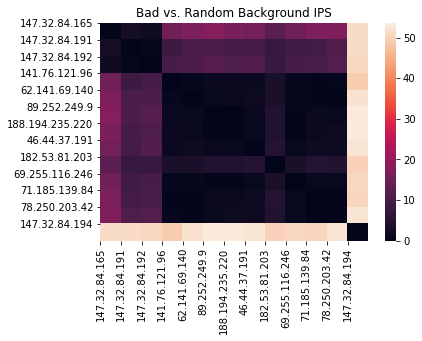

--------------------------------------------------
n_walks: 5, walk_length: 5, representation_size: 12, window_size: 4 Running Time:  30.144986867904663


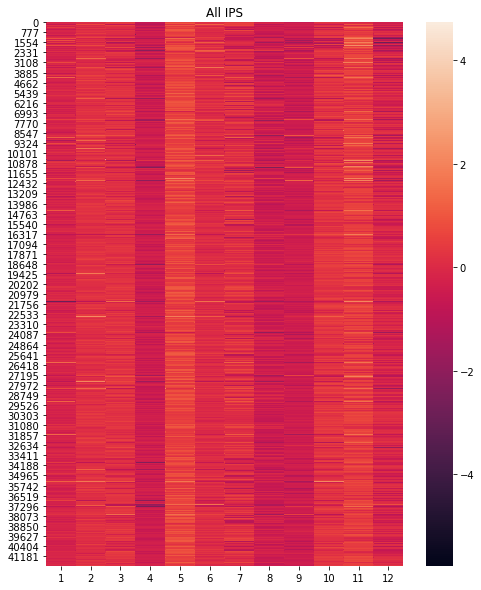

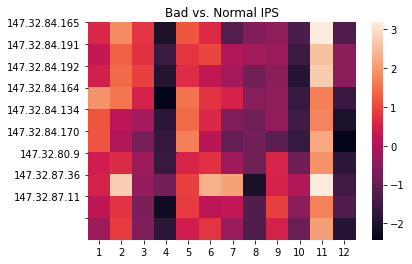

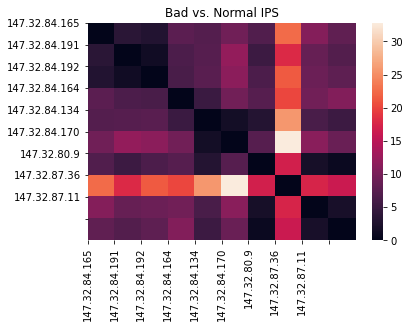

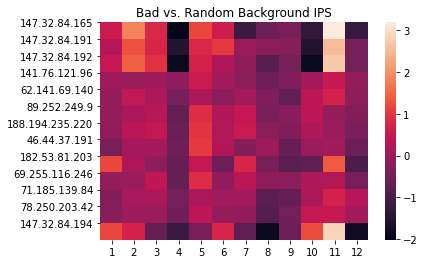

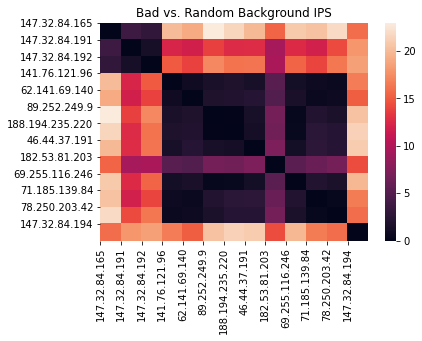

--------------------------------------------------
n_walks: 5, walk_length: 10, representation_size: 12, window_size: 2 Running Time:  47.27653384208679


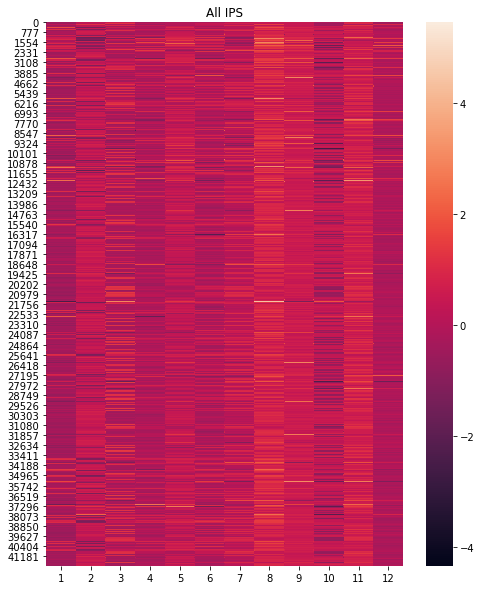

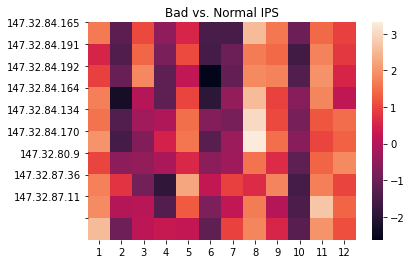

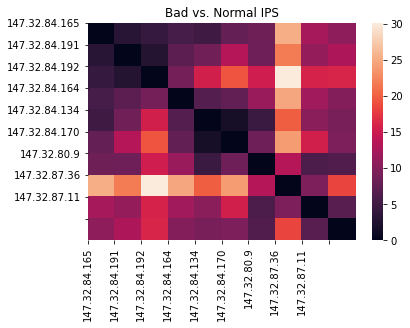

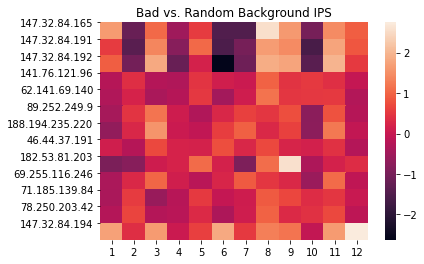

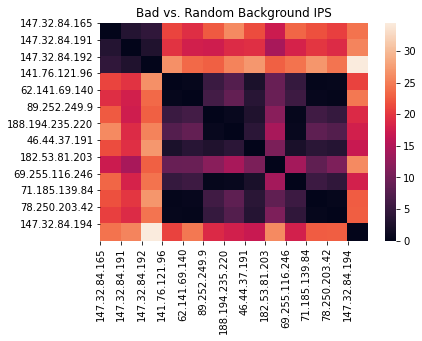

--------------------------------------------------
n_walks: 5, walk_length: 10, representation_size: 12, window_size: 4 Running Time:  57.06291627883911


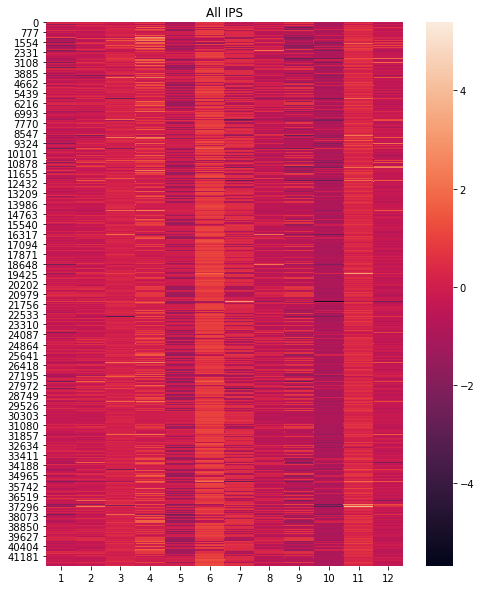

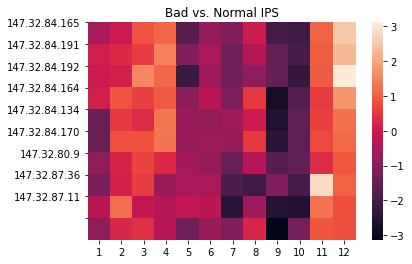

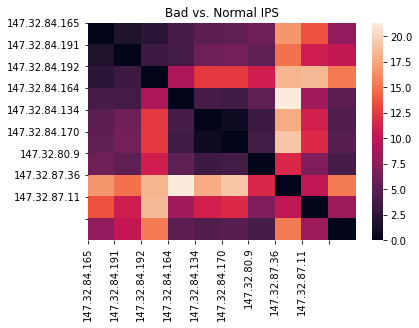

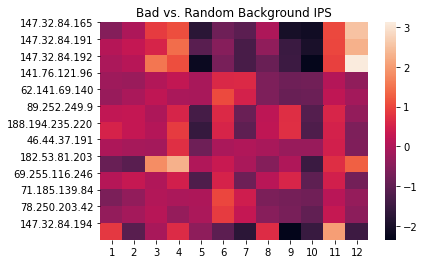

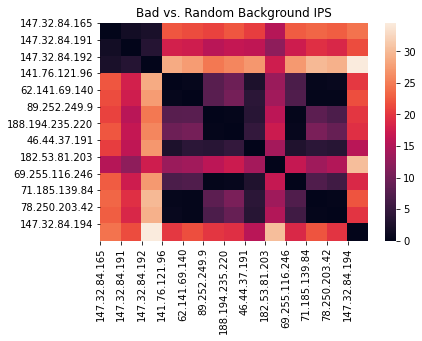

--------------------------------------------------
n_walks: 10, walk_length: 2, representation_size: 12, window_size: 2 Running Time:  16.226603746414185


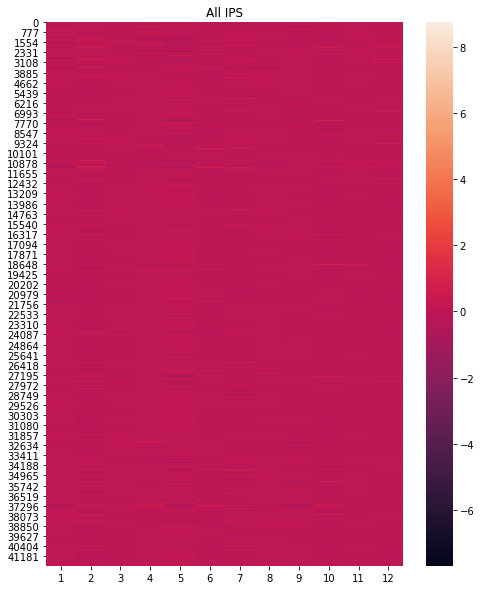

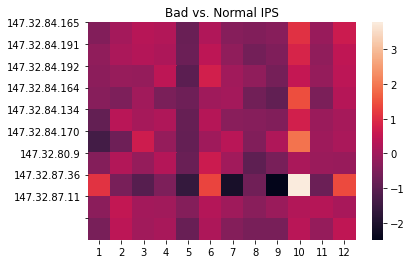

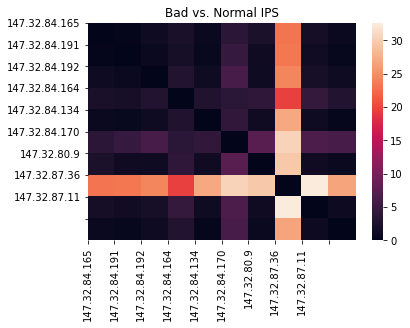

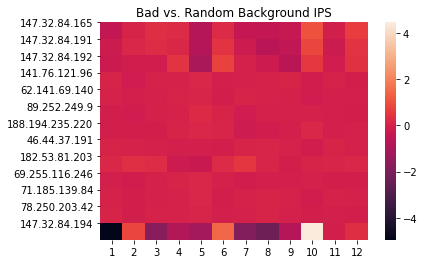

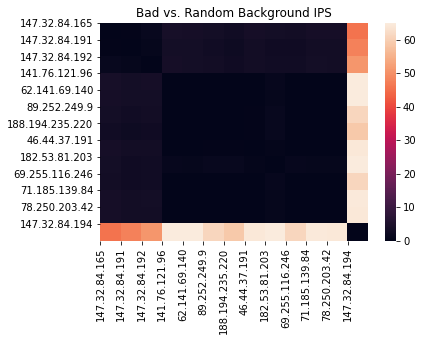

--------------------------------------------------
n_walks: 10, walk_length: 2, representation_size: 12, window_size: 4 Running Time:  16.52536177635193


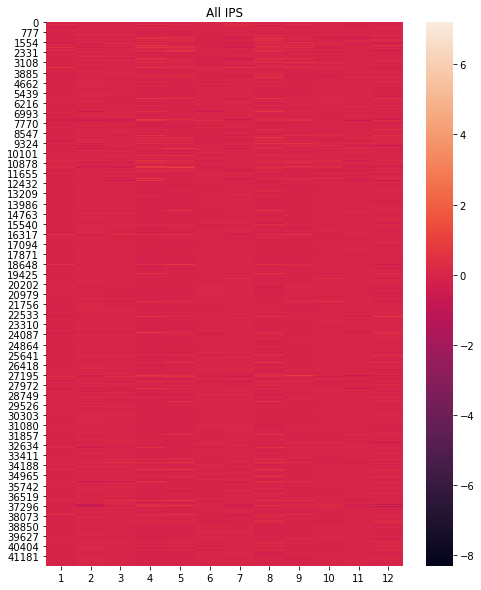

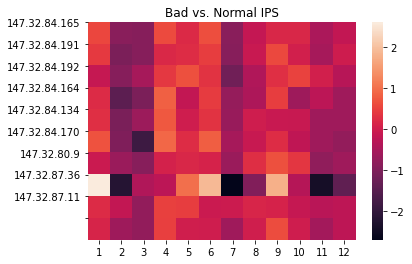

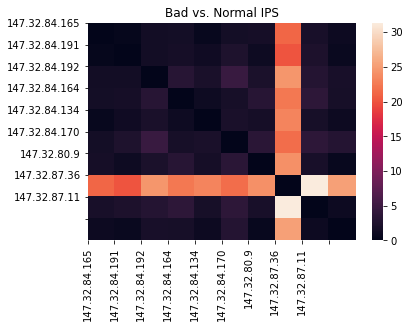

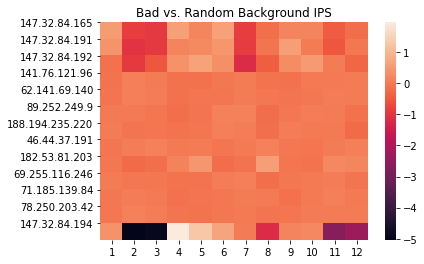

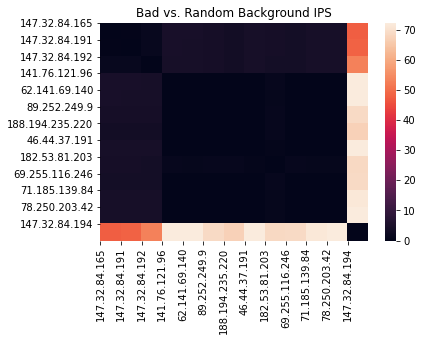

--------------------------------------------------
n_walks: 10, walk_length: 5, representation_size: 12, window_size: 2 Running Time:  46.66615962982178


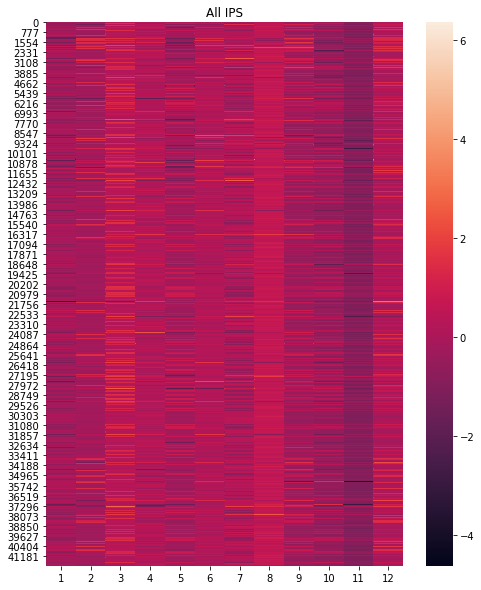

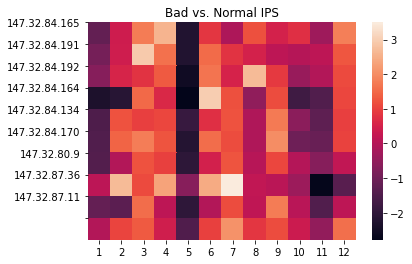

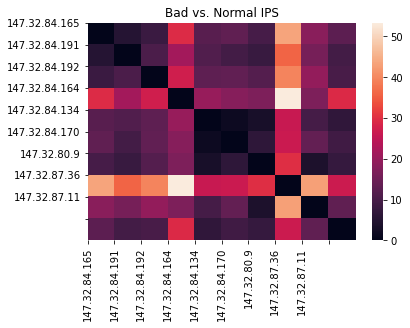

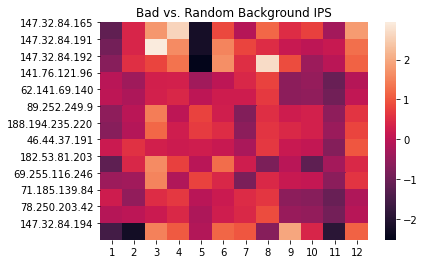

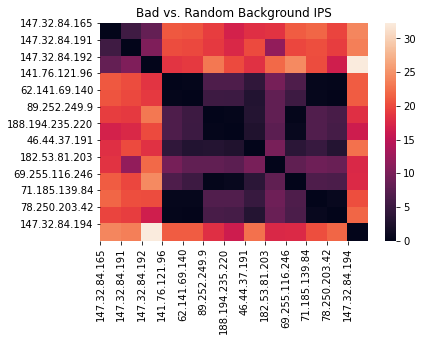

--------------------------------------------------
n_walks: 10, walk_length: 5, representation_size: 12, window_size: 4 Running Time:  50.57716703414917


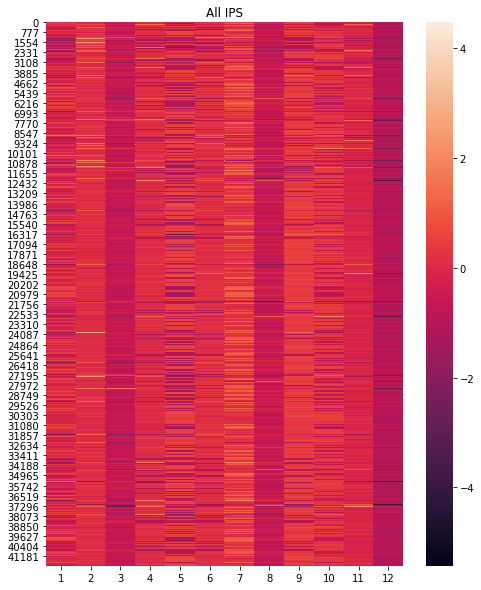

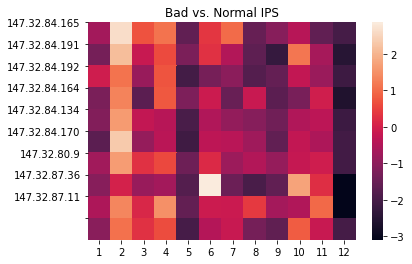

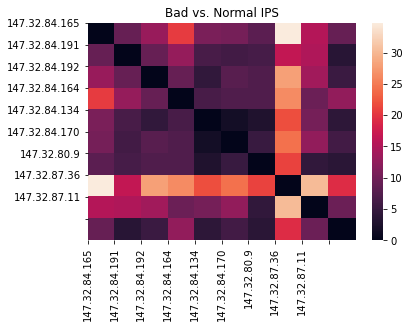

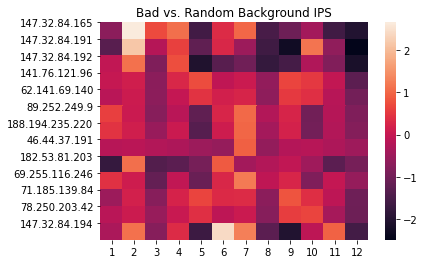

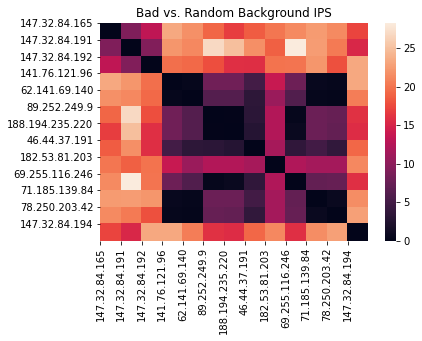

--------------------------------------------------
n_walks: 10, walk_length: 10, representation_size: 12, window_size: 2 Running Time:  85.57313776016235


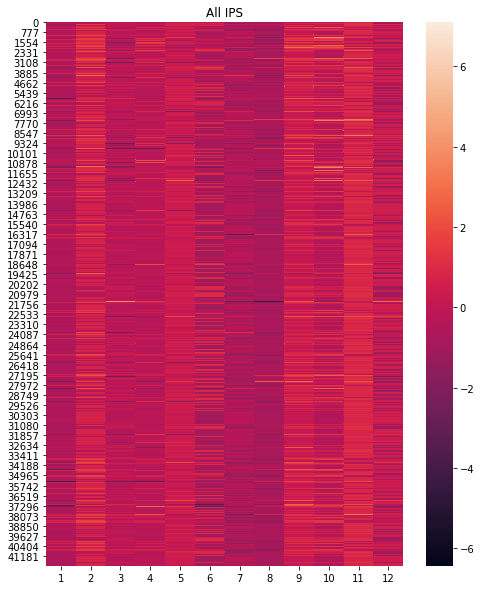

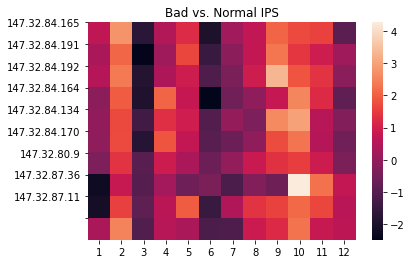

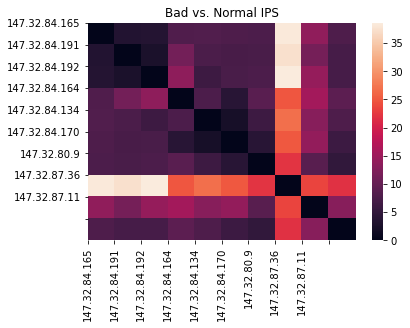

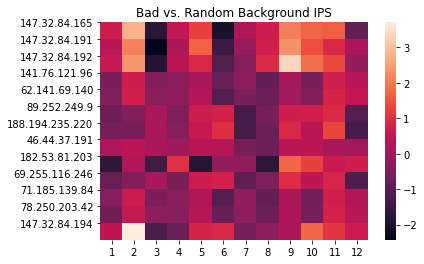

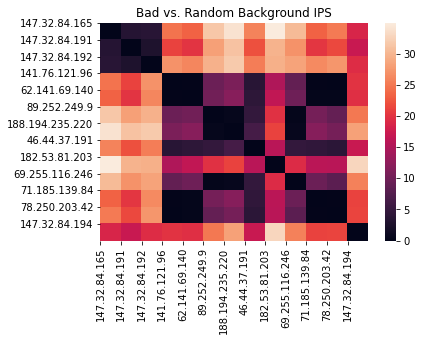

--------------------------------------------------
n_walks: 10, walk_length: 10, representation_size: 12, window_size: 4 Running Time:  104.1859061717987


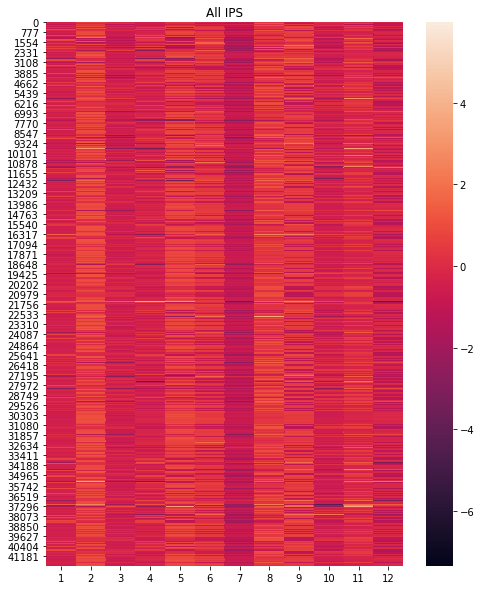

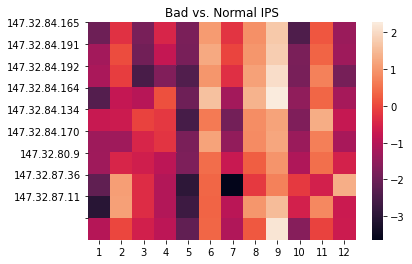

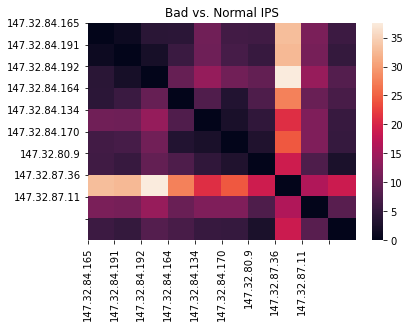

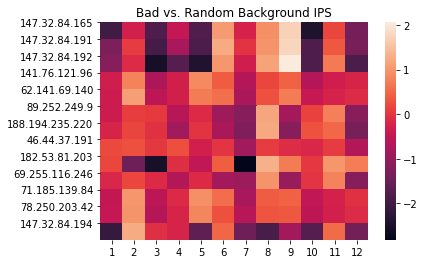

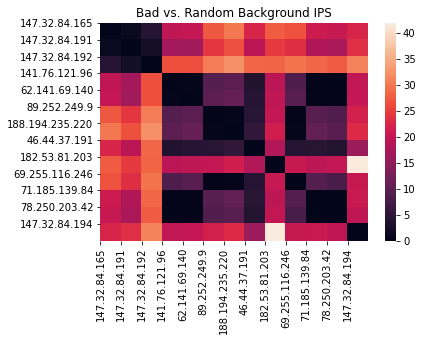

In [21]:
for representation_size in [12]:
    for n_walks in [5, 10]:
        for walk_length in [2, 5, 10]:
            for window_size in [2, 4]:
                run_deepwalk(G, 
                             n_walks=n_walks, 
                             walk_length=walk_length, 
                             representation_size=representation_size, 
                             window_size=window_size, 
                             n_jobs=1)
        

# 16 dimensions

--------------------------------------------------
n_walks: 5, walk_length: 2, representation_size: 16, window_size: 2 Running Time:  12.809286832809448


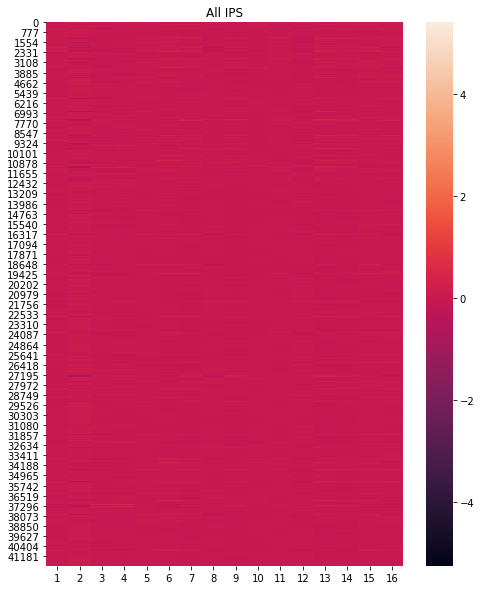

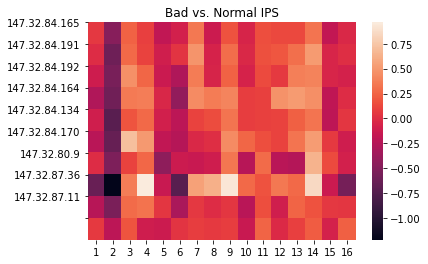

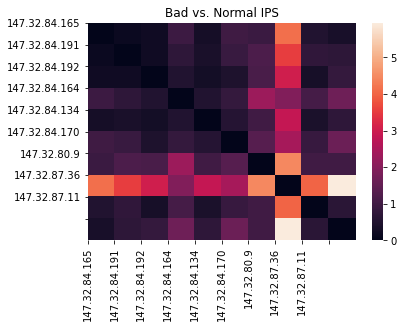

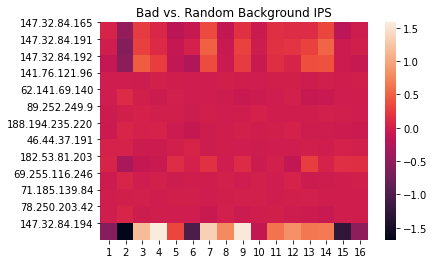

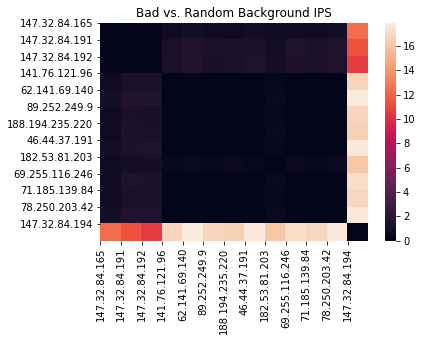

--------------------------------------------------
n_walks: 5, walk_length: 2, representation_size: 16, window_size: 4 Running Time:  12.40081524848938


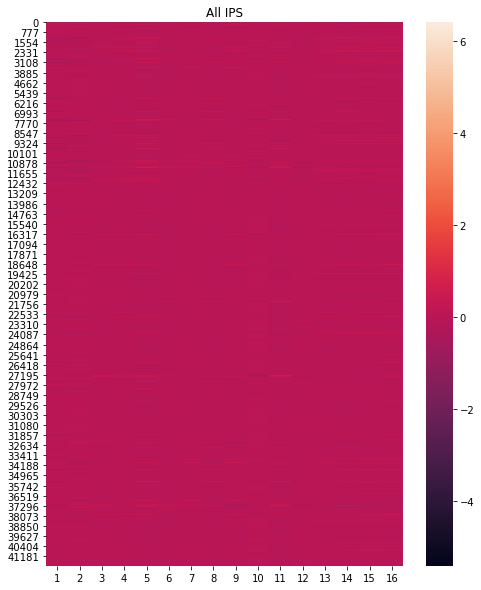

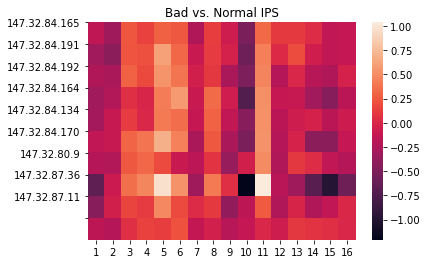

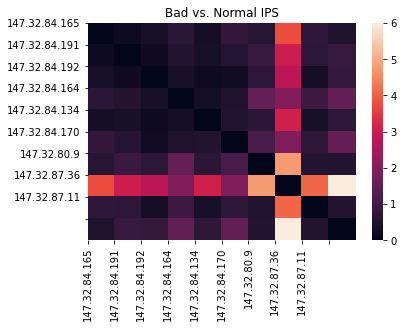

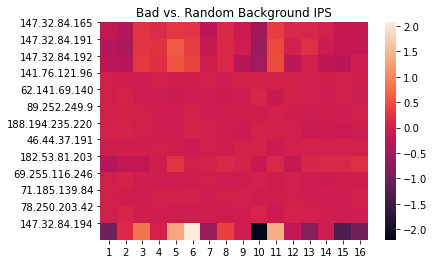

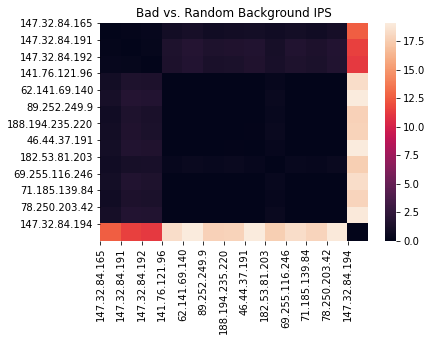

--------------------------------------------------
n_walks: 5, walk_length: 5, representation_size: 16, window_size: 2 Running Time:  28.824817180633545


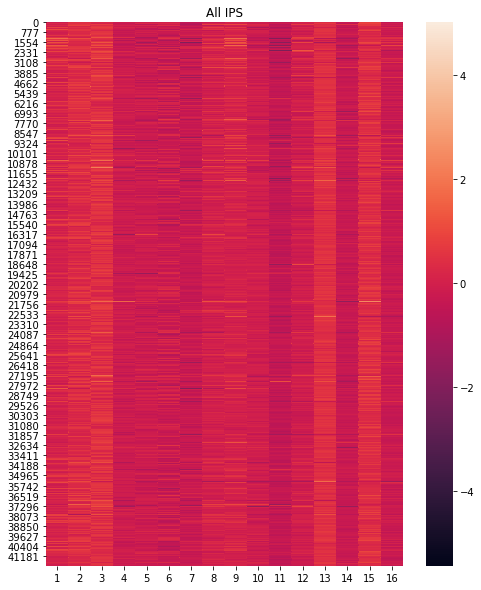

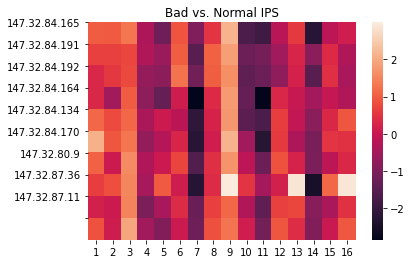

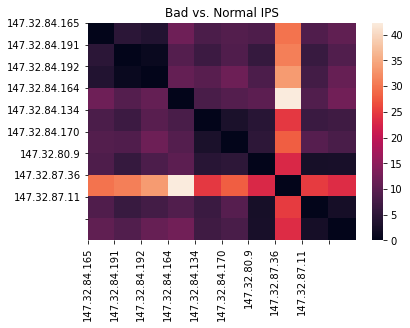

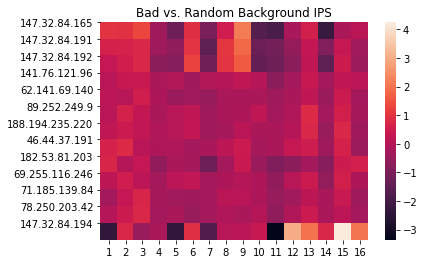

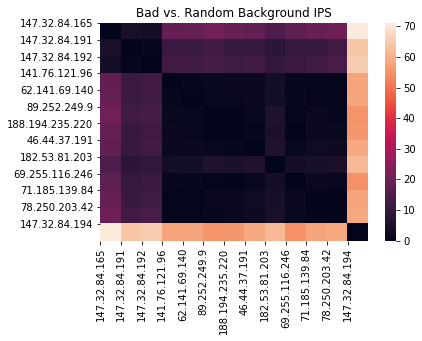

--------------------------------------------------
n_walks: 5, walk_length: 5, representation_size: 16, window_size: 4 Running Time:  30.697908639907837


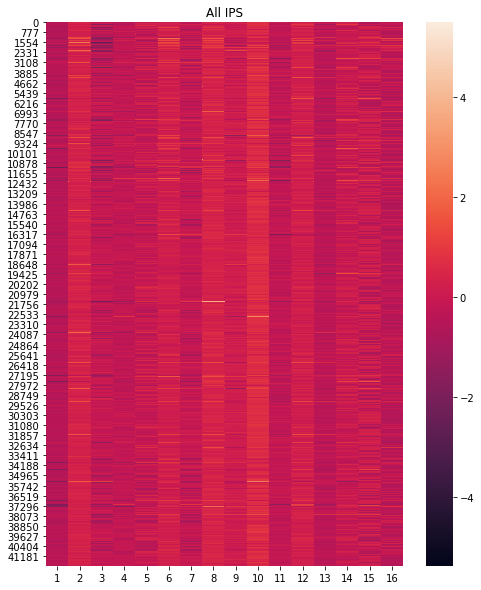

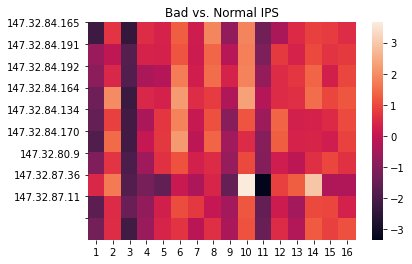

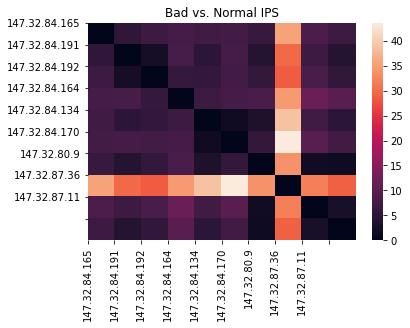

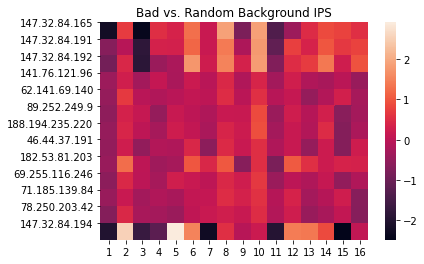

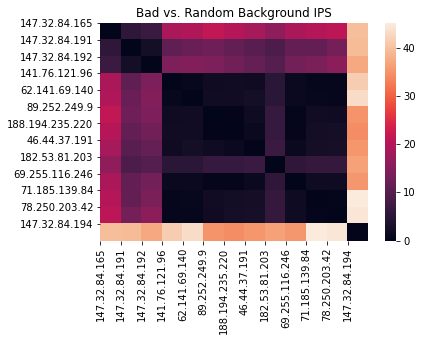

--------------------------------------------------
n_walks: 5, walk_length: 10, representation_size: 16, window_size: 2 Running Time:  49.934425354003906


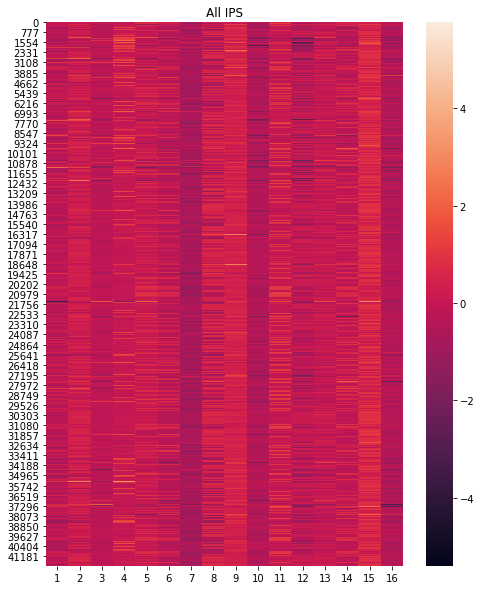

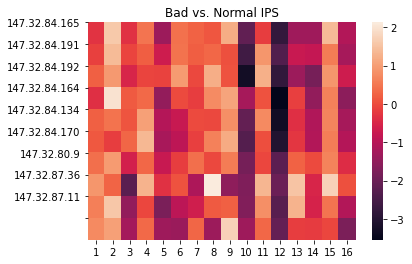

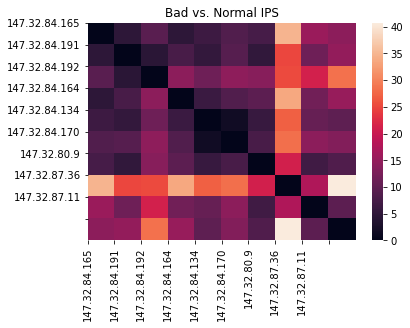

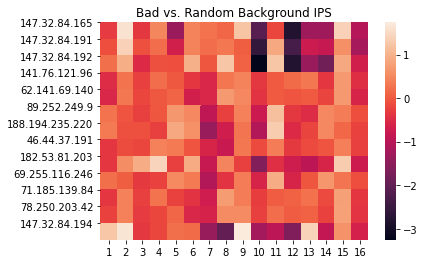

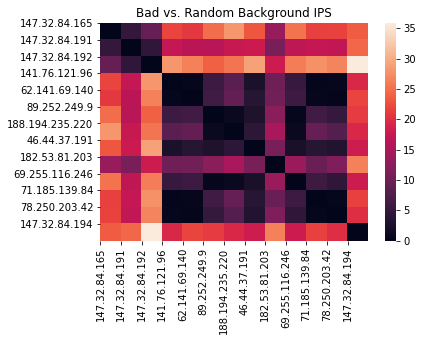

--------------------------------------------------
n_walks: 5, walk_length: 10, representation_size: 16, window_size: 4 Running Time:  60.516132831573486


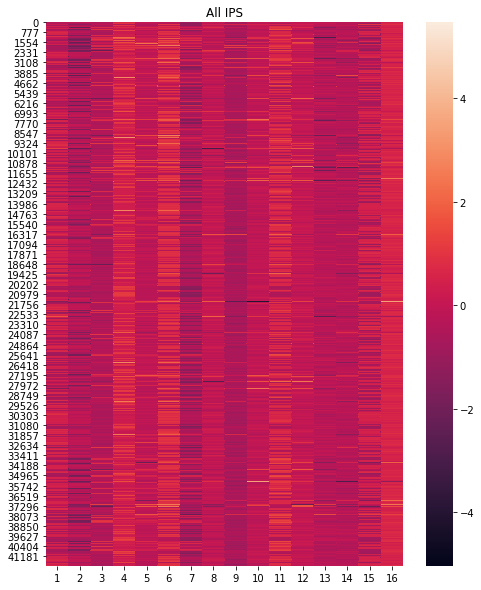

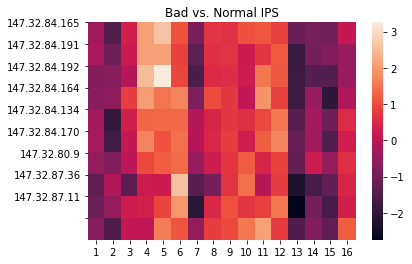

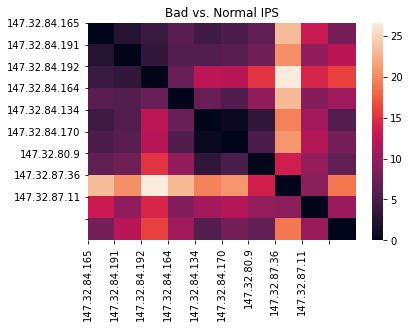

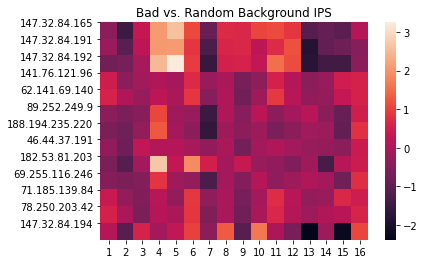

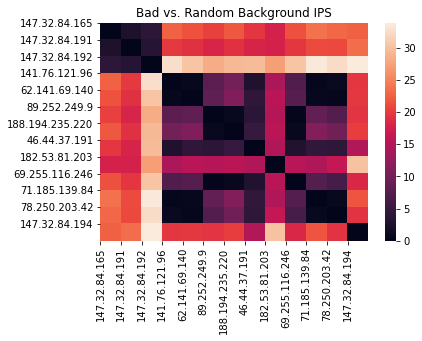

--------------------------------------------------
n_walks: 10, walk_length: 2, representation_size: 16, window_size: 2 Running Time:  15.69803786277771


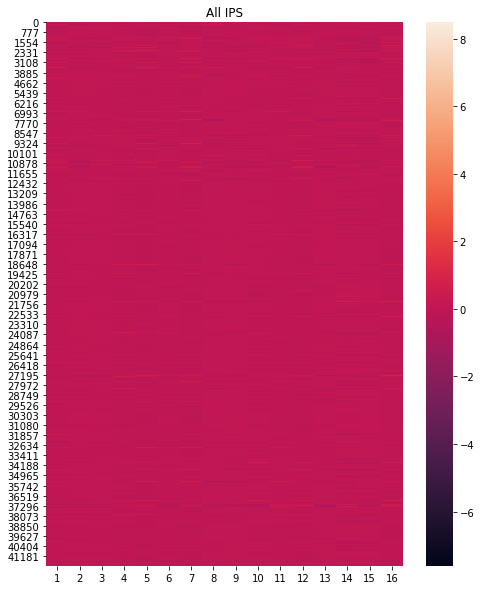

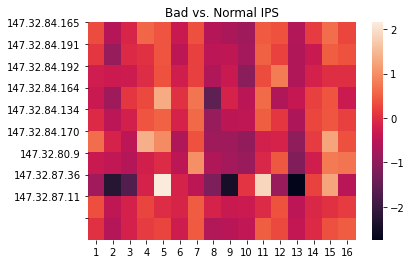

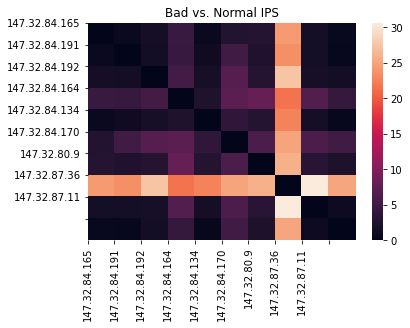

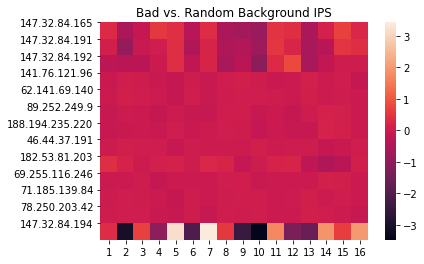

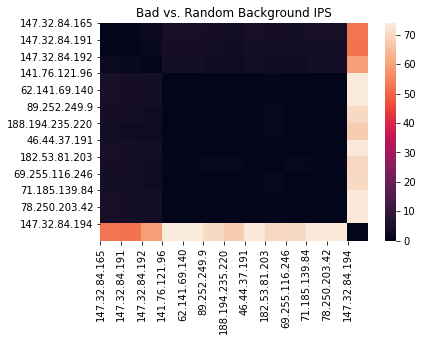

--------------------------------------------------
n_walks: 10, walk_length: 2, representation_size: 16, window_size: 4 Running Time:  15.501596689224243


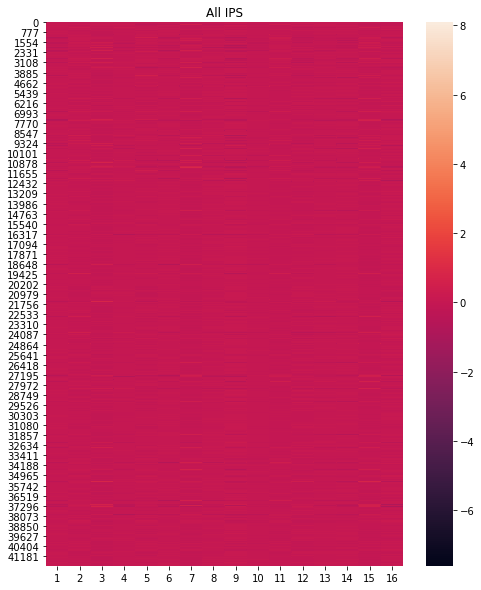

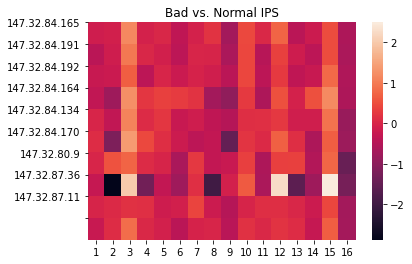

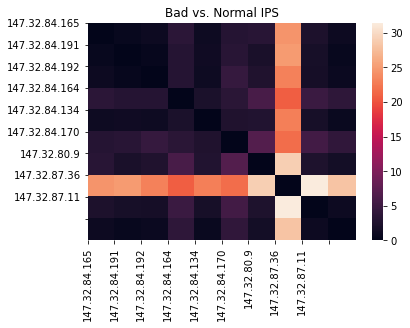

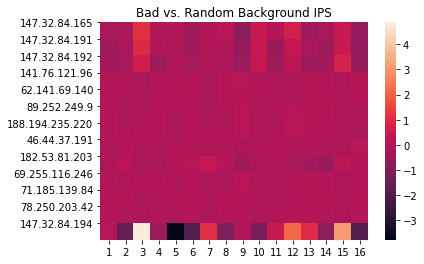

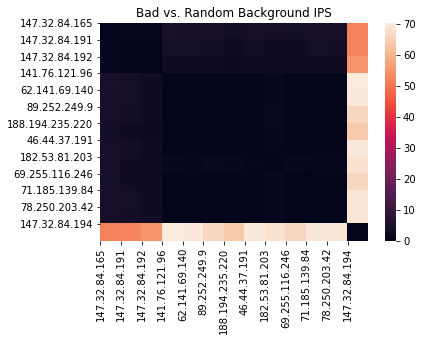

--------------------------------------------------
n_walks: 10, walk_length: 5, representation_size: 16, window_size: 2 Running Time:  48.130284786224365


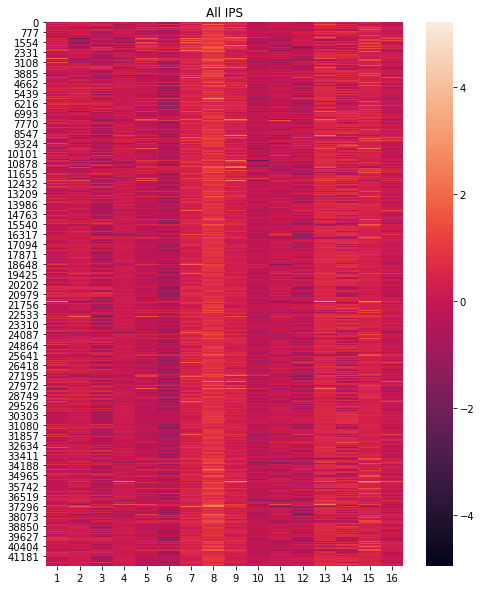

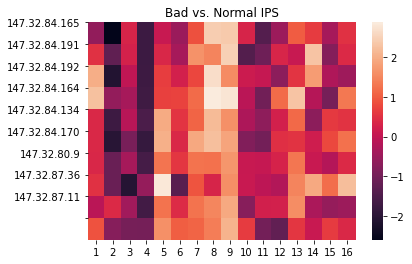

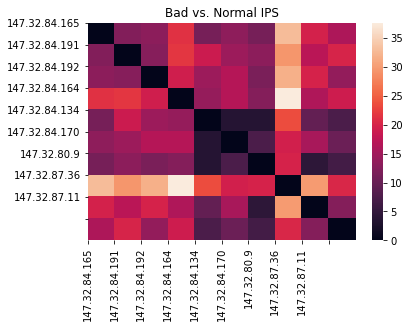

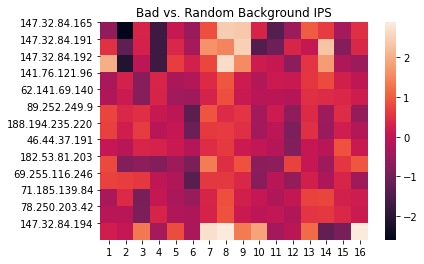

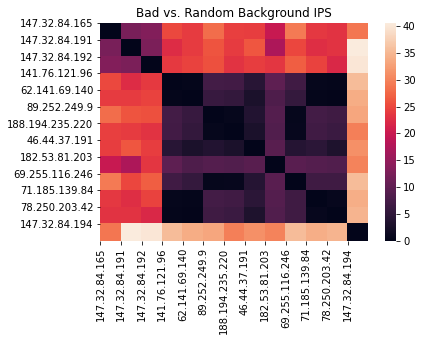

--------------------------------------------------
n_walks: 10, walk_length: 5, representation_size: 16, window_size: 4 Running Time:  52.31593108177185


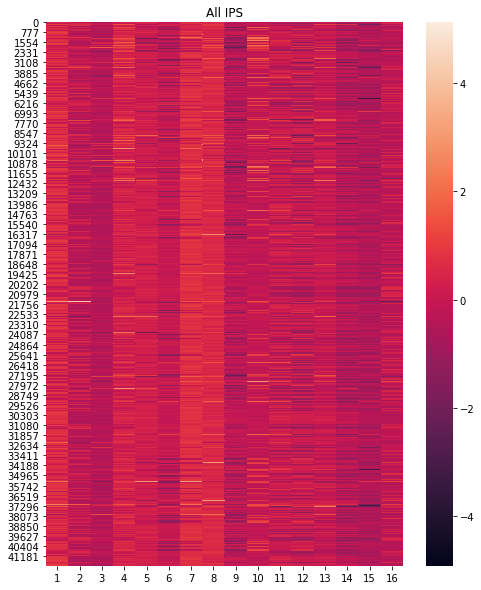

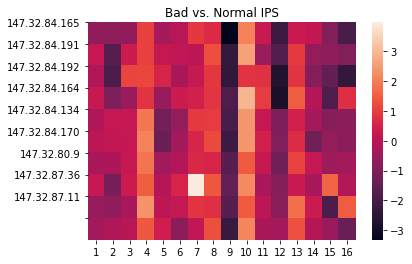

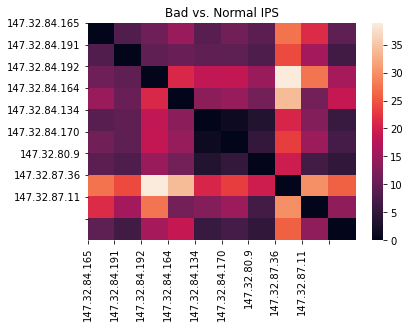

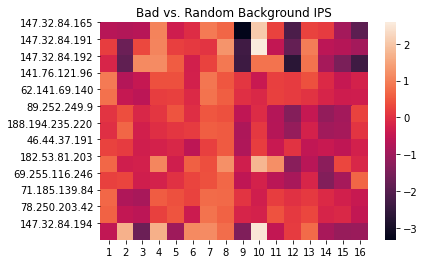

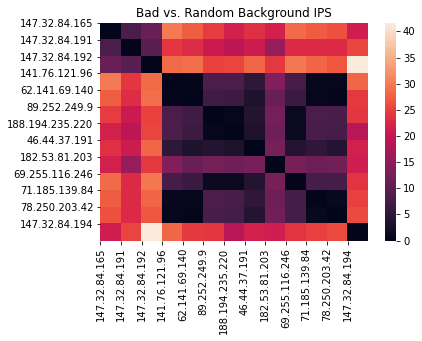

--------------------------------------------------
n_walks: 10, walk_length: 10, representation_size: 16, window_size: 2 Running Time:  87.81927442550659


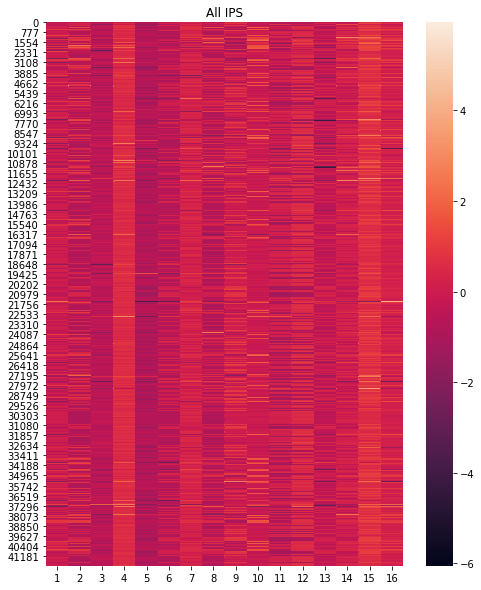

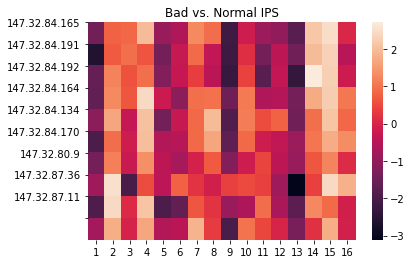

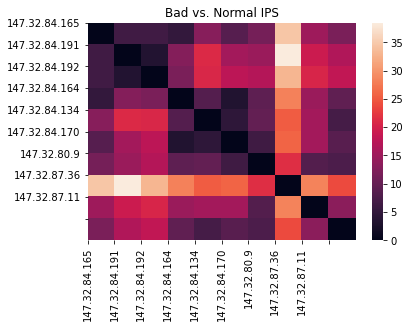

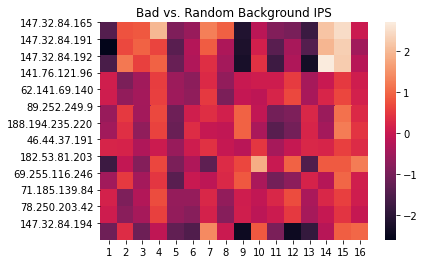

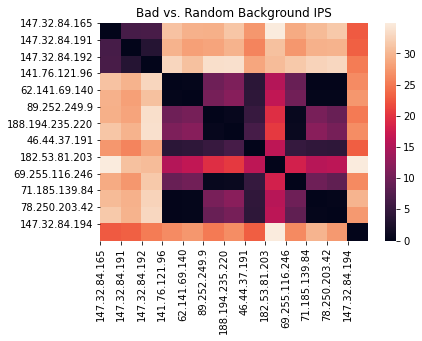

--------------------------------------------------
n_walks: 10, walk_length: 10, representation_size: 16, window_size: 4 Running Time:  112.56586647033691


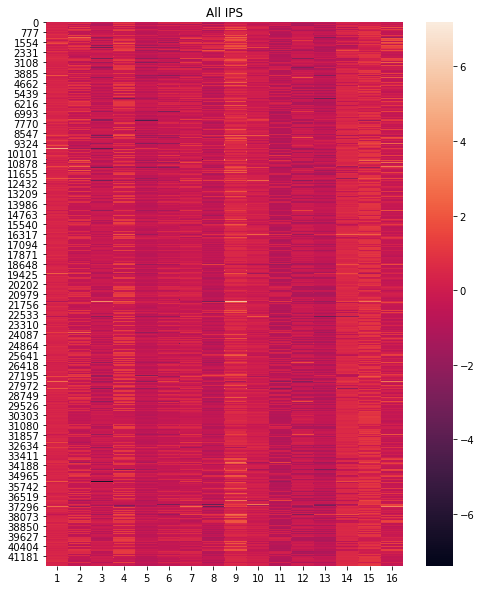

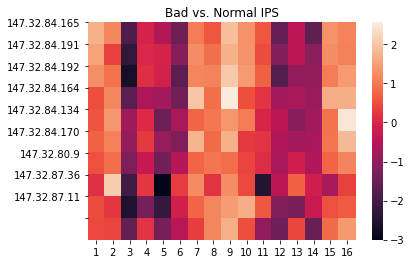

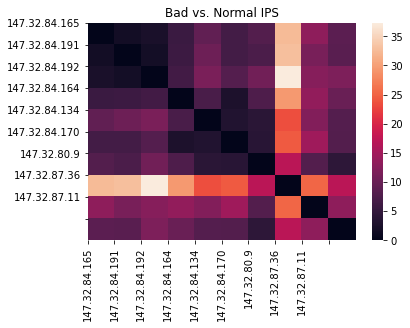

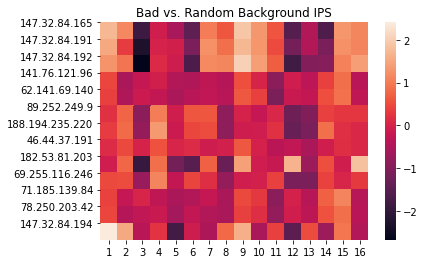

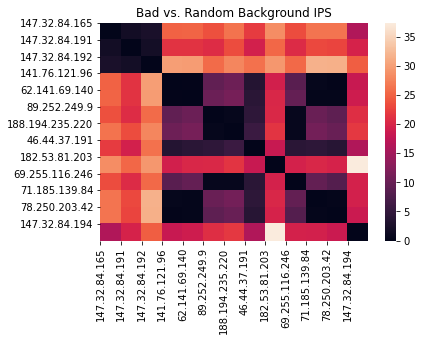

In [22]:
for representation_size in [16]:
    for n_walks in [5, 10]:
        for walk_length in [2, 5, 10]:
            for window_size in [2, 4]:
                run_deepwalk(G, 
                             n_walks=n_walks, 
                             walk_length=walk_length, 
                             representation_size=representation_size, 
                             window_size=window_size, 
                             n_jobs=1)
        

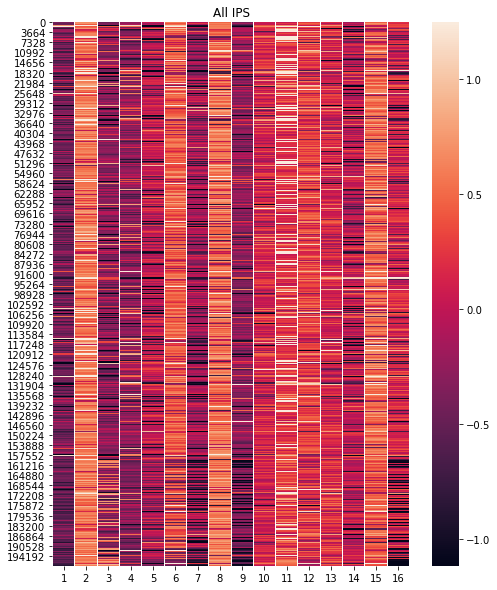

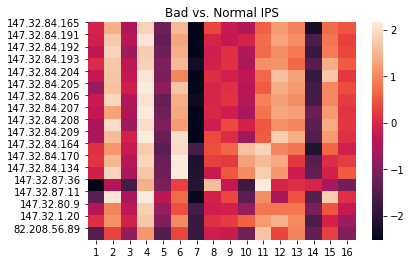

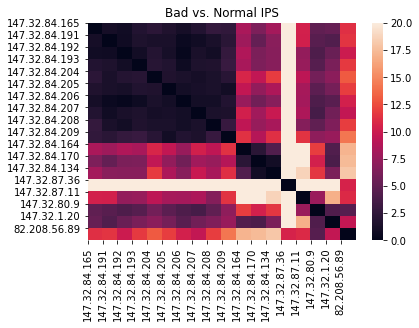

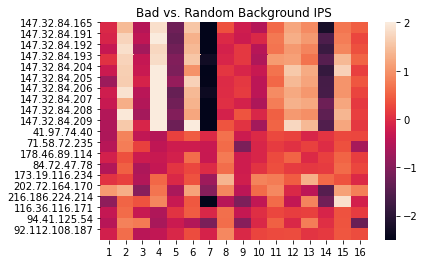

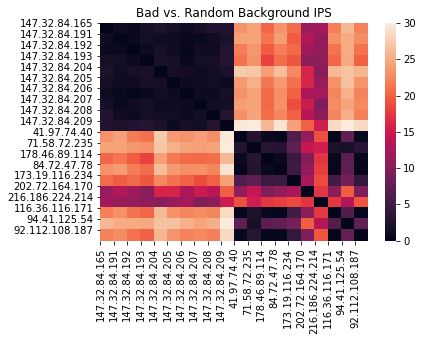

In [32]:
deepwalk_output = pd.read_csv(f'scenario_{scenario}_n{10}_l{5}_w{2}_d{representation_size}.output', delimiter=' ',
                             header=None, skiprows=1)
deepwalk_output = deepwalk_output.sort_values(0).reset_index(drop=True)

#cmap = sns.cubehelix_palette(6, start=1, rot=3, dark=0, light=.95, gamma=0.8, reverse=True, as_cmap=True)
#cmap = sns.light_palette('red', gamma=0.8)

fig, ax = plt.subplots(1, 1, figsize=(8, 10))
sns.heatmap(deepwalk_output.loc[:, 1:], robust=True)
plt.title('All IPS')
plt.show()

sns.heatmap(deepwalk_output.loc[bad_ips_indx + normal_ips_indx, 1:], robust=True)
plt.yticks(range(len(bad_ips_indx + normal_ips_indx)), labels=bad_ips + normal_ips)
plt.title('Bad vs. Normal IPS')
plt.show()

dist = euclidean_distances(deepwalk_output.loc[bad_ips_indx + normal_ips_indx, 1:], deepwalk_output.loc[bad_ips_indx + normal_ips_indx, 1:], squared=True)
sns.heatmap(dist, robust=True, vmax=20)
plt.yticks(range(len(bad_ips_indx + normal_ips_indx)), labels=bad_ips + normal_ips)
plt.xticks(range(len(bad_ips_indx + normal_ips_indx)), labels=bad_ips + normal_ips, rotation=90)
plt.title('Bad vs. Normal IPS')
plt.show()

sns.heatmap(deepwalk_output.loc[bad_ips_indx + random_background_ips_indx, 1:], robust=True)
plt.yticks(range(len(bad_ips_indx + random_background_ips_indx)), labels=bad_ips + random_background_ips)
plt.title('Bad vs. Random Background IPS')
plt.show()

dist = euclidean_distances(deepwalk_output.loc[bad_ips_indx + random_background_ips_indx, 1:], deepwalk_output.loc[bad_ips_indx + random_background_ips_indx, 1:], squared=True)
sns.heatmap(dist, robust=True, vmax=30)
plt.yticks(range(len(bad_ips_indx + random_background_ips_indx)), labels=bad_ips + random_background_ips)
plt.xticks(range(len(bad_ips_indx + random_background_ips_indx)), labels=bad_ips + random_background_ips, rotation=90)
plt.title('Bad vs. Random Background IPS')
plt.show()

--------------------------------------------------
n_walks: 5, walk_length: 5, representation_size: 16, window_size: 2 Running Time:  30.030688762664795


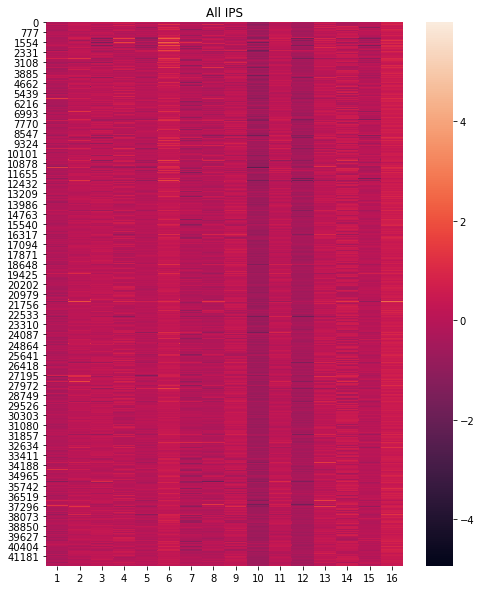

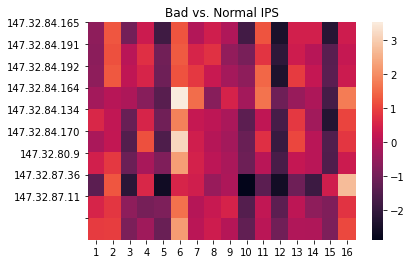

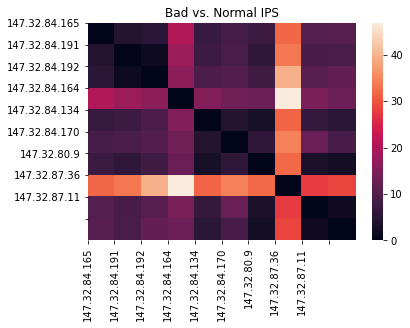

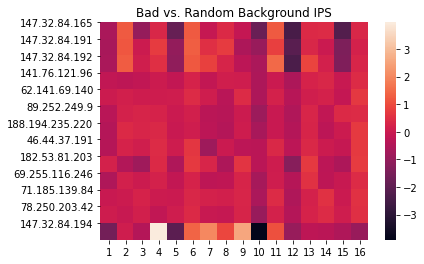

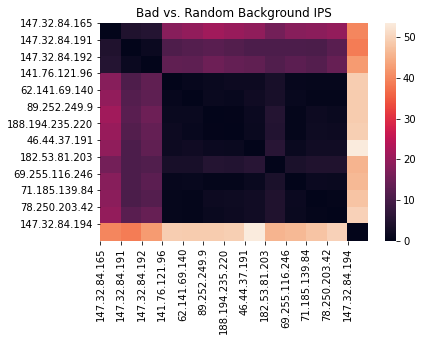

--------------------------------------------------
n_walks: 5, walk_length: 10, representation_size: 16, window_size: 2 Running Time:  54.52128314971924


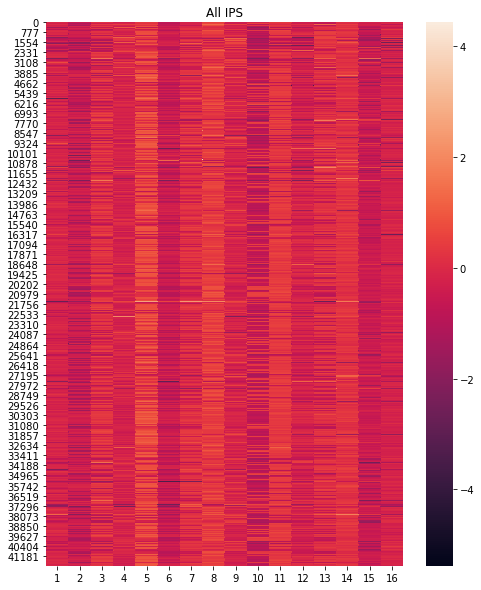

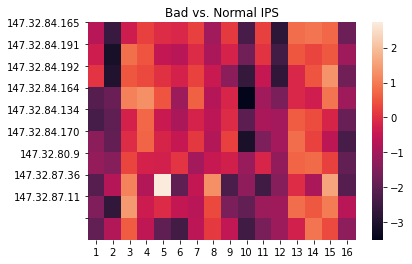

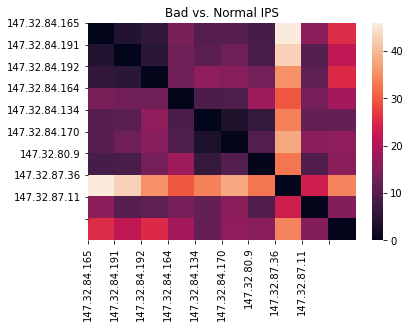

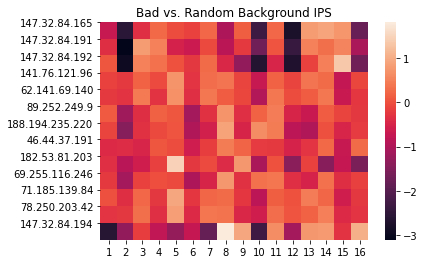

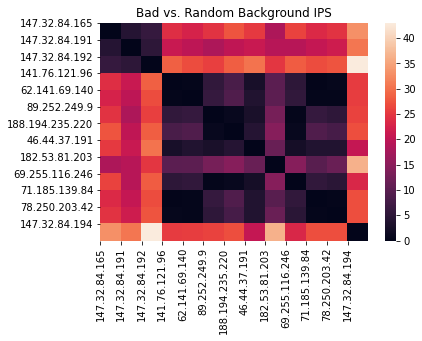

--------------------------------------------------
n_walks: 5, walk_length: 10, representation_size: 16, window_size: 4 Running Time:  62.09643220901489


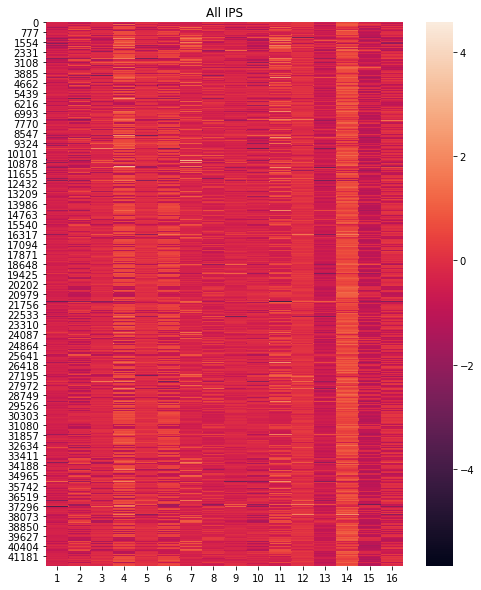

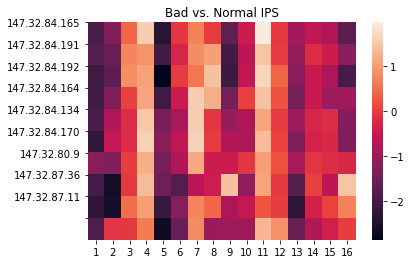

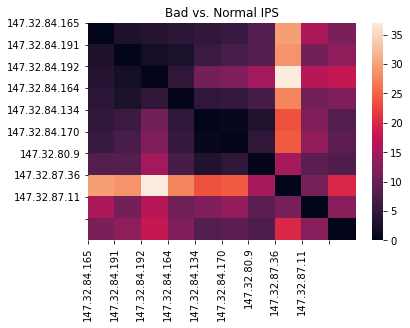

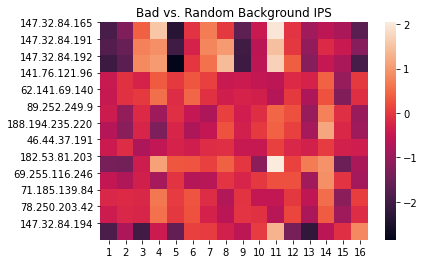

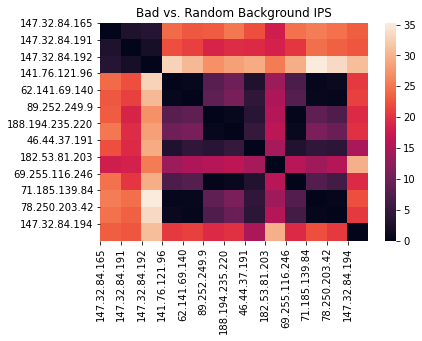

--------------------------------------------------
n_walks: 5, walk_length: 20, representation_size: 16, window_size: 2 Running Time:  97.98752522468567


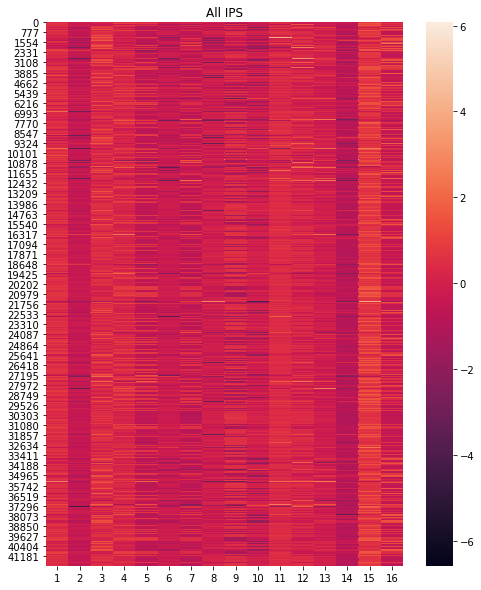

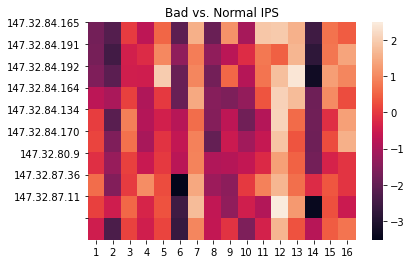

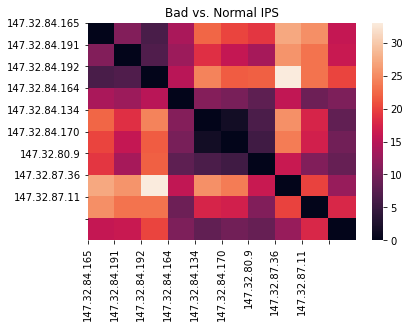

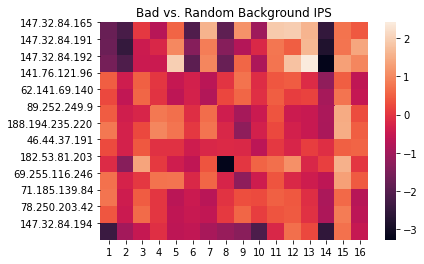

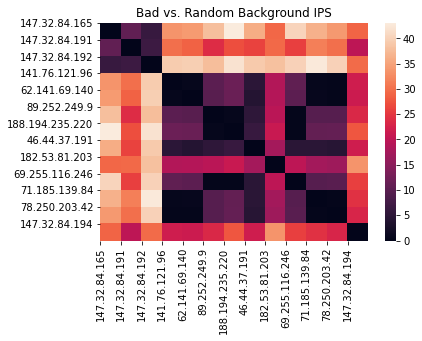

--------------------------------------------------
n_walks: 5, walk_length: 20, representation_size: 16, window_size: 4 Running Time:  129.69497203826904


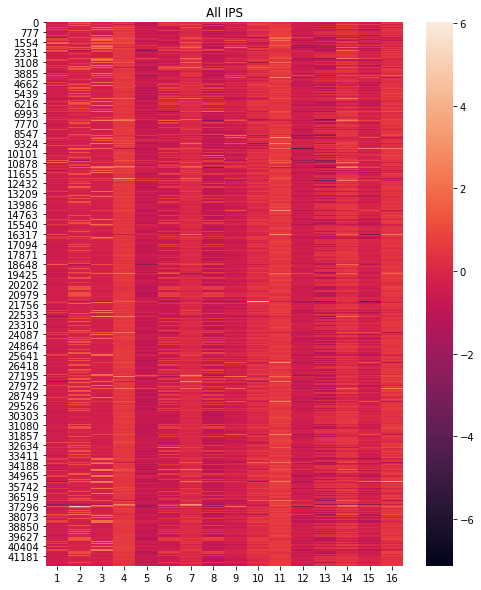

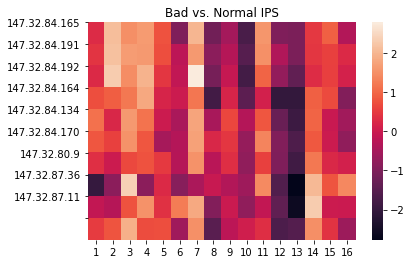

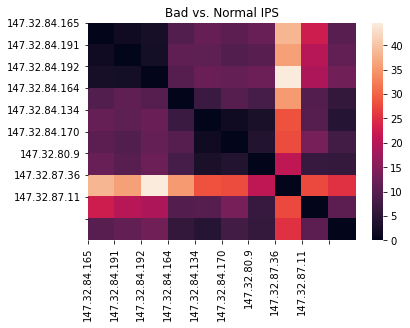

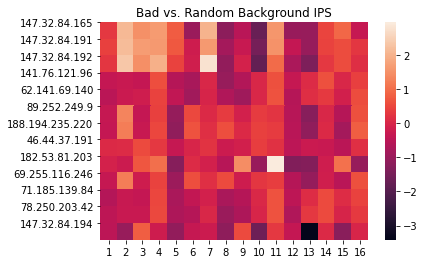

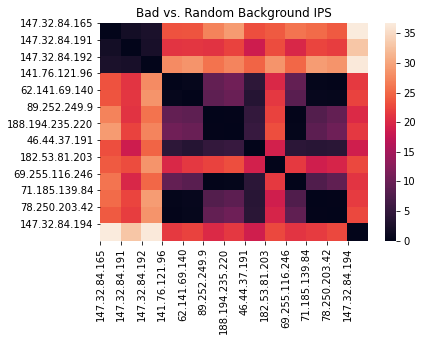

--------------------------------------------------
n_walks: 5, walk_length: 20, representation_size: 16, window_size: 8 Running Time:  184.84497356414795


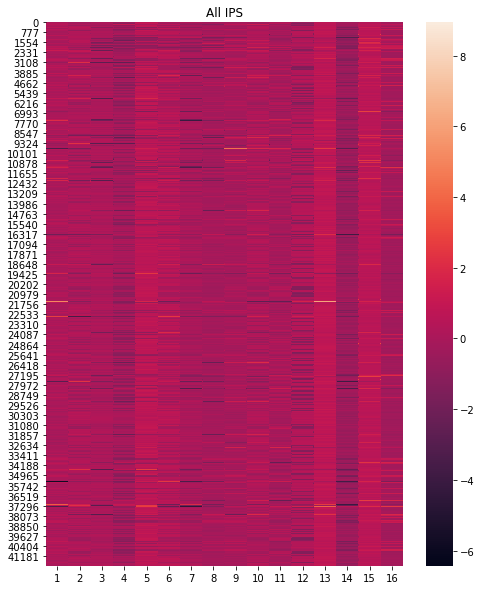

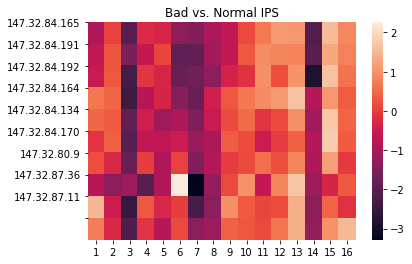

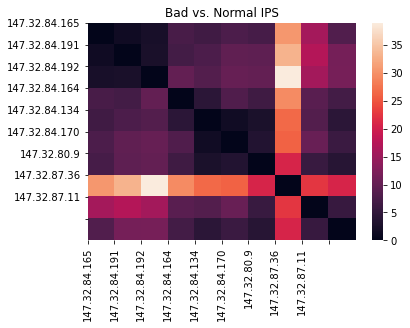

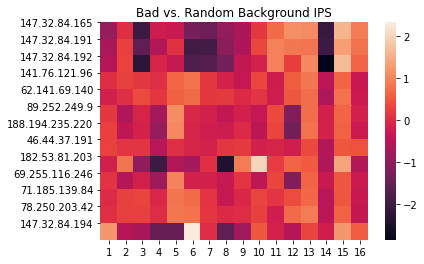

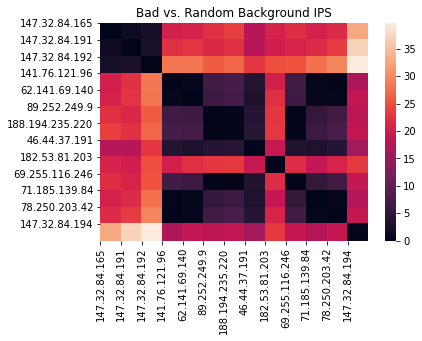

--------------------------------------------------
n_walks: 10, walk_length: 5, representation_size: 16, window_size: 2 Running Time:  47.73349452018738


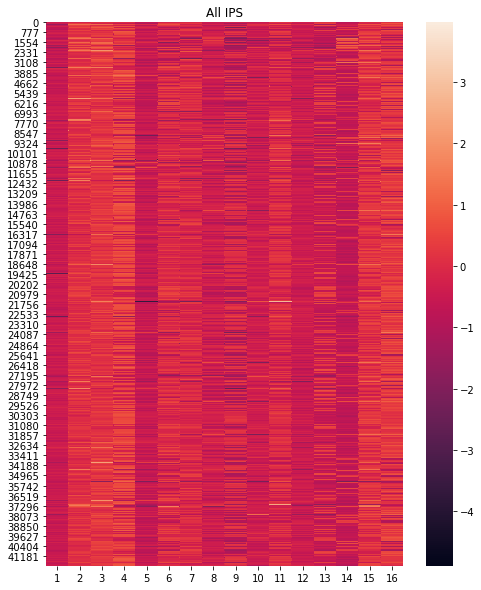

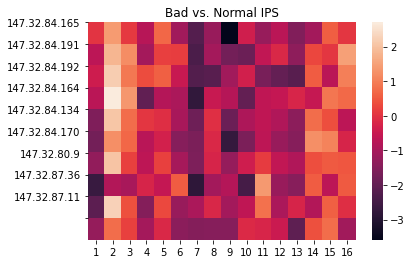

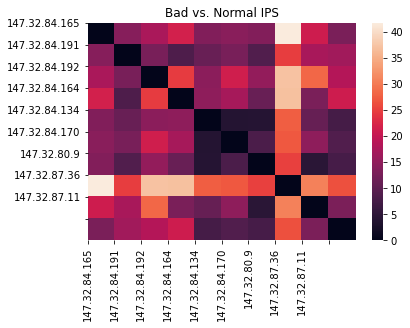

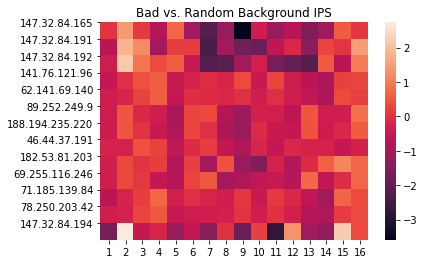

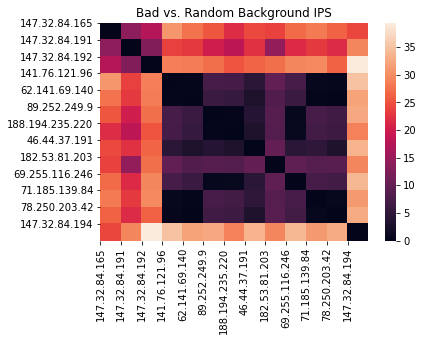

--------------------------------------------------
n_walks: 10, walk_length: 10, representation_size: 16, window_size: 2 Running Time:  87.64442443847656


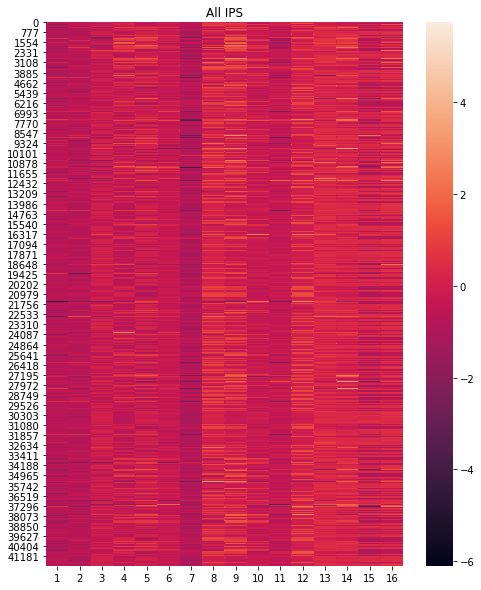

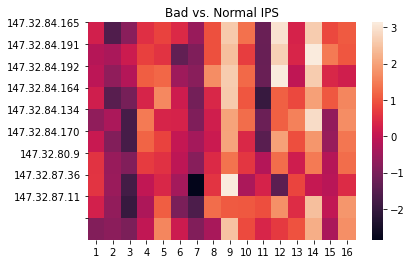

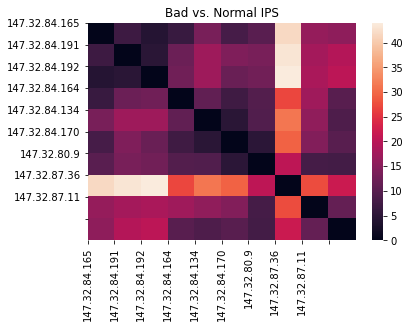

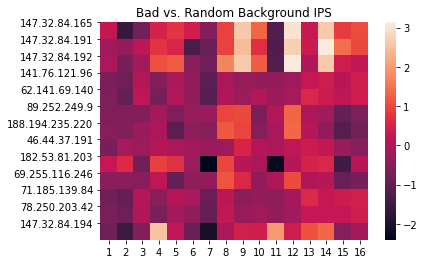

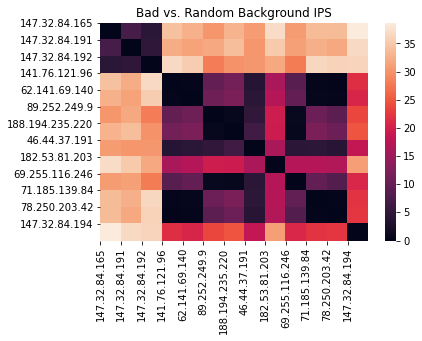

--------------------------------------------------
n_walks: 10, walk_length: 10, representation_size: 16, window_size: 4 Running Time:  110.47964978218079


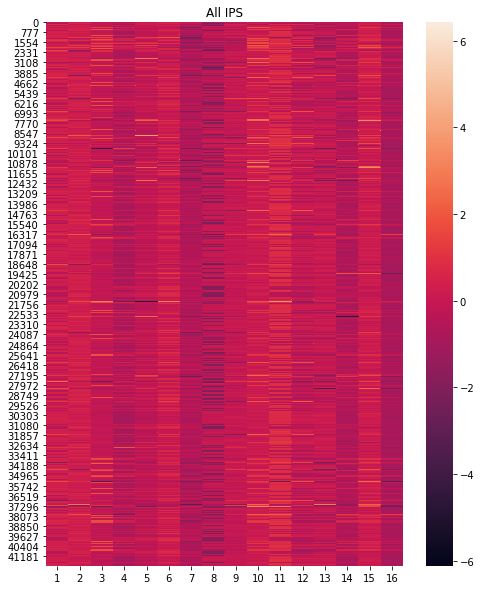

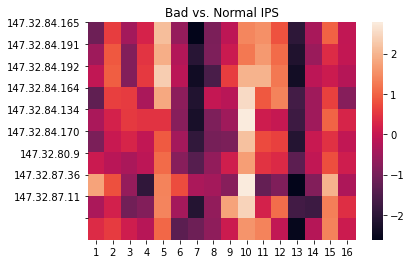

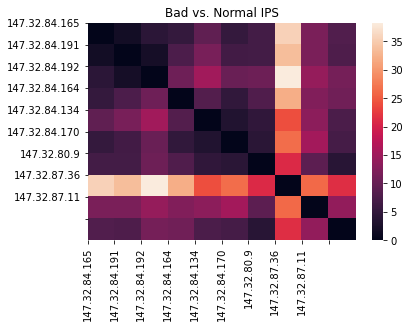

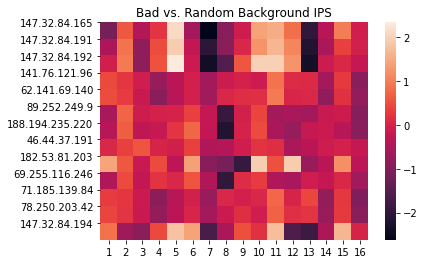

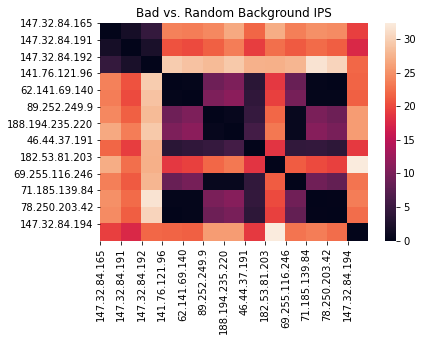

--------------------------------------------------
n_walks: 10, walk_length: 20, representation_size: 16, window_size: 2 Running Time:  182.83491396903992


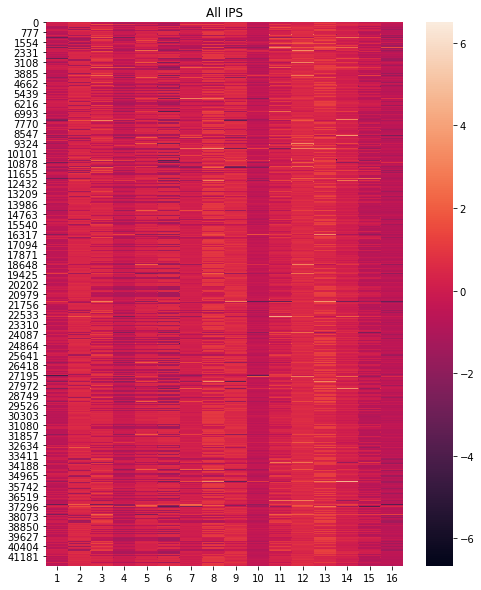

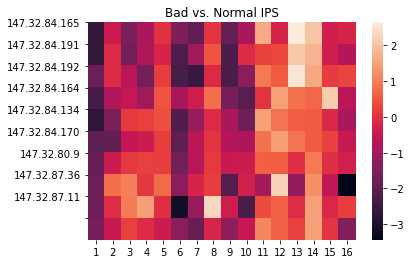

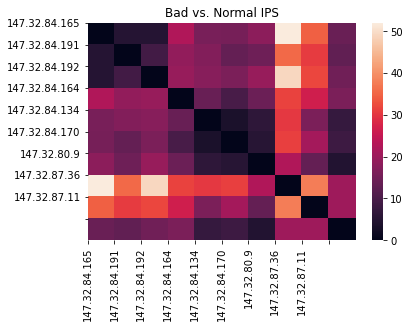

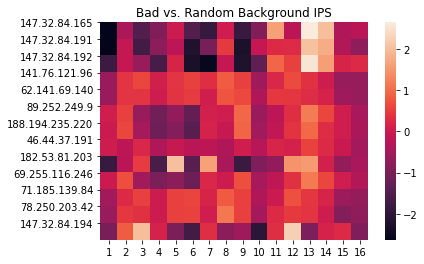

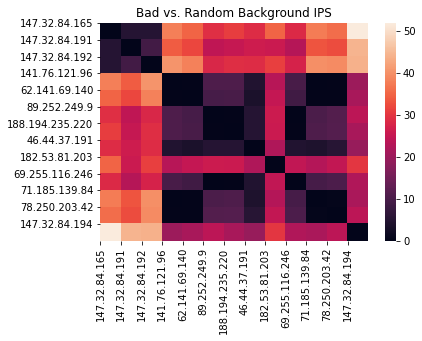

--------------------------------------------------
n_walks: 10, walk_length: 20, representation_size: 16, window_size: 4 Running Time:  249.49012422561646


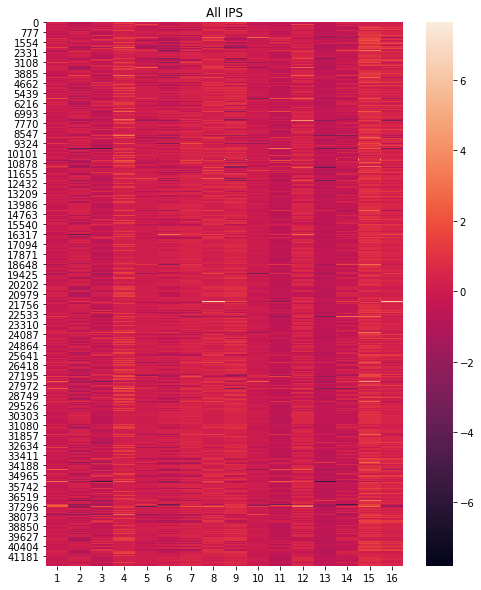

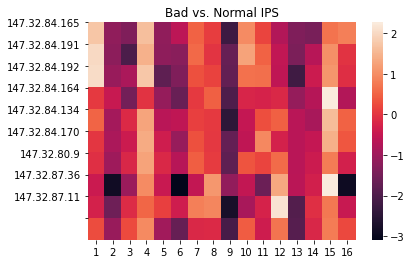

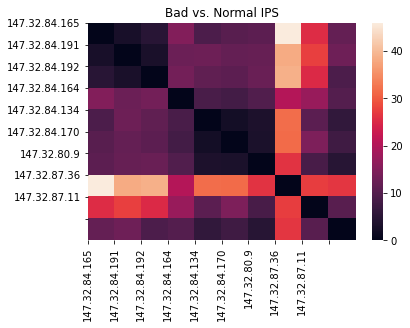

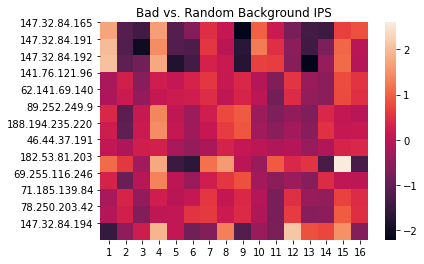

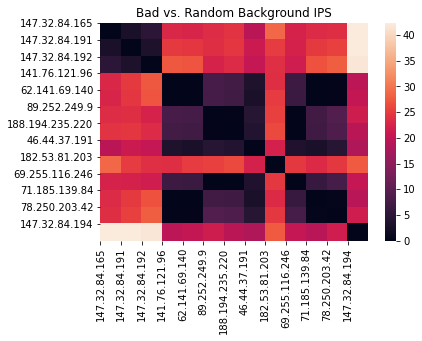

--------------------------------------------------
n_walks: 10, walk_length: 20, representation_size: 16, window_size: 8 Running Time:  358.54467844963074


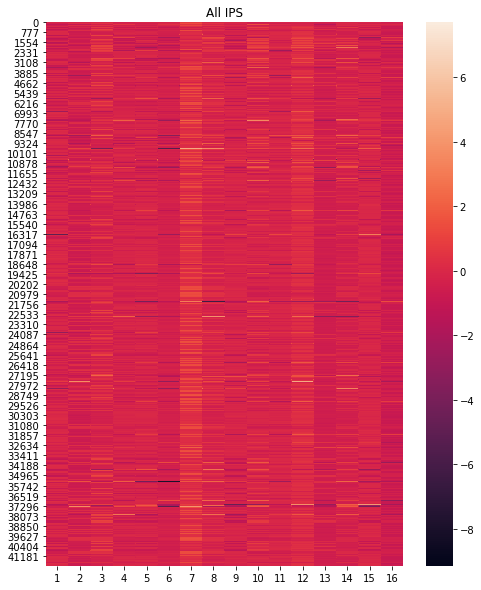

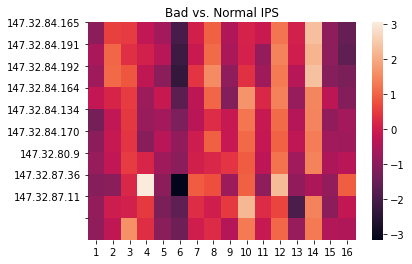

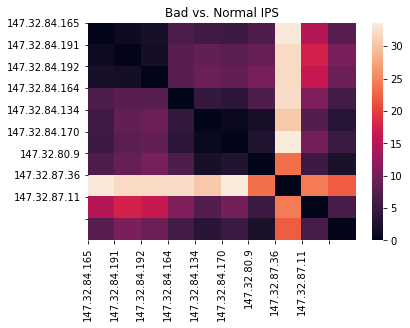

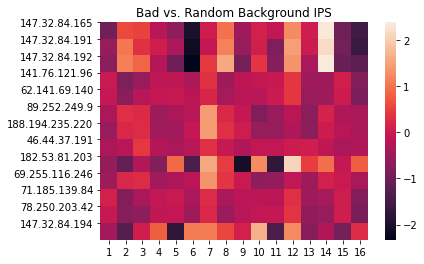

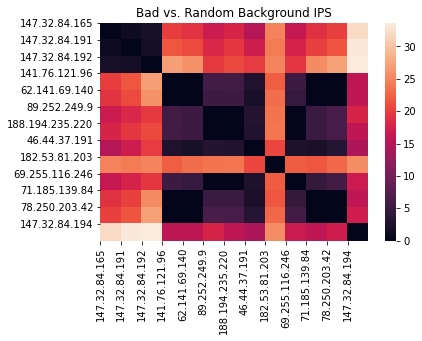

--------------------------------------------------
n_walks: 25, walk_length: 5, representation_size: 16, window_size: 2 Running Time:  105.68028831481934


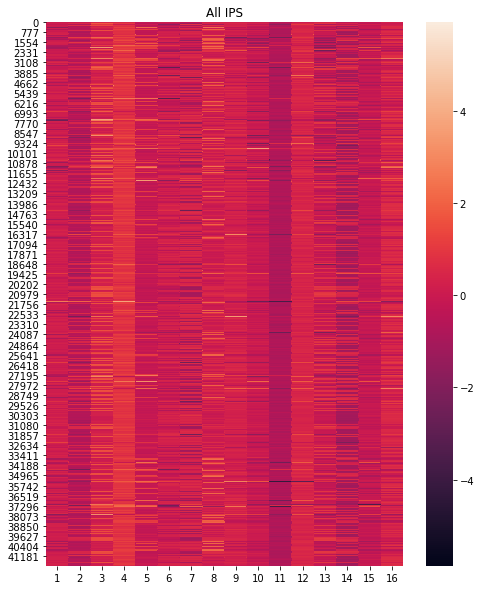

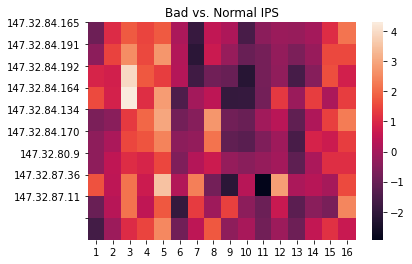

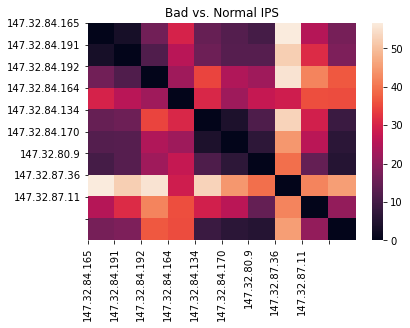

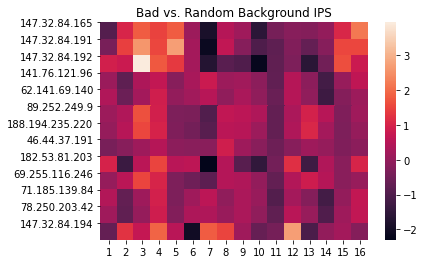

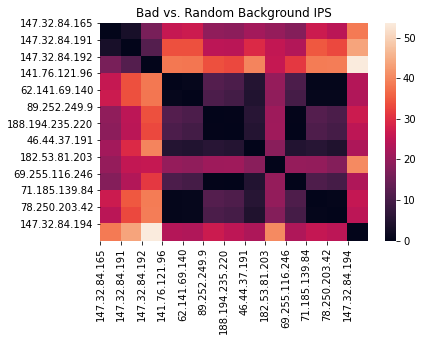

--------------------------------------------------
n_walks: 25, walk_length: 10, representation_size: 16, window_size: 2 Running Time:  207.34446001052856


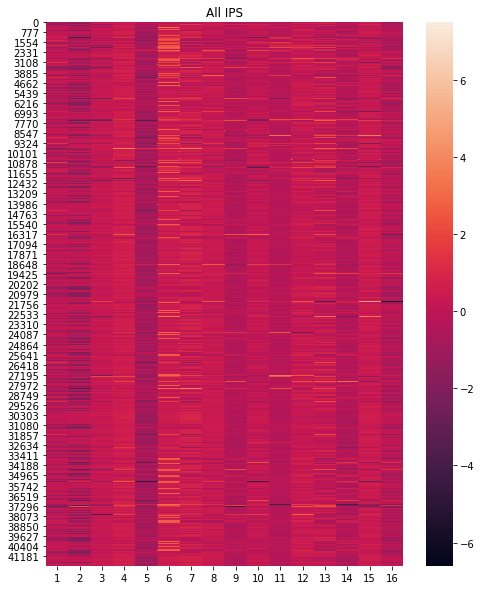

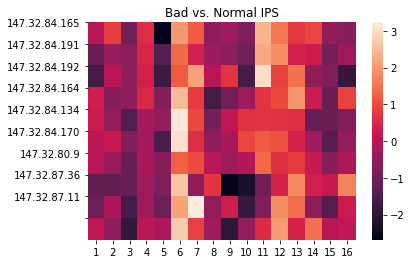

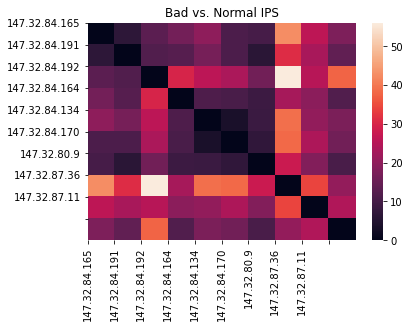

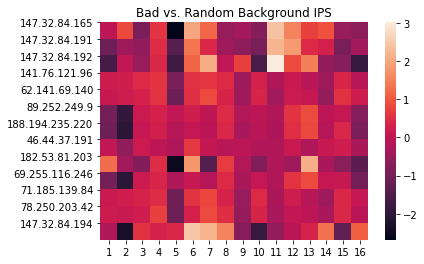

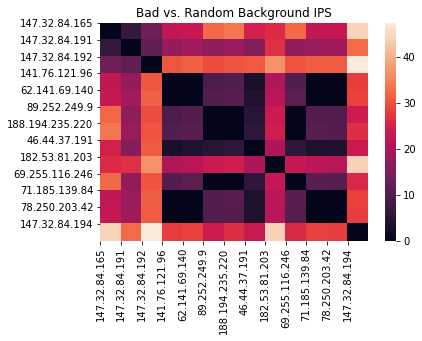

--------------------------------------------------
n_walks: 25, walk_length: 10, representation_size: 16, window_size: 4 Running Time:  259.9893682003021


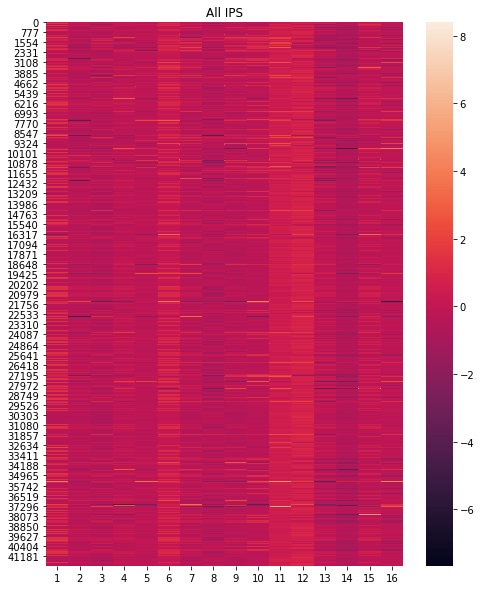

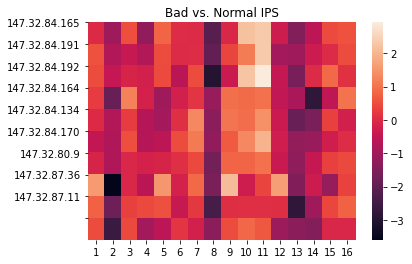

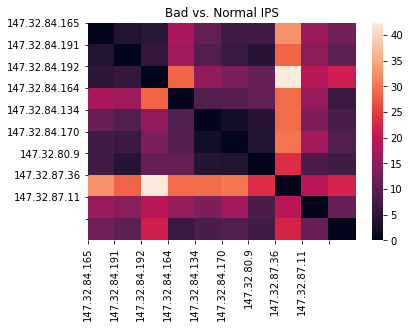

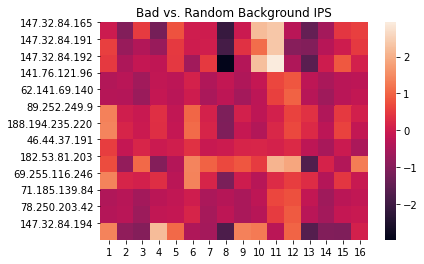

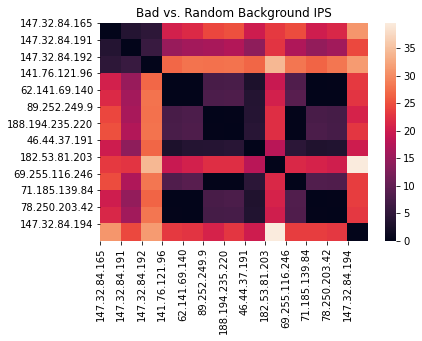

--------------------------------------------------
n_walks: 25, walk_length: 20, representation_size: 16, window_size: 2 Running Time:  437.7388002872467


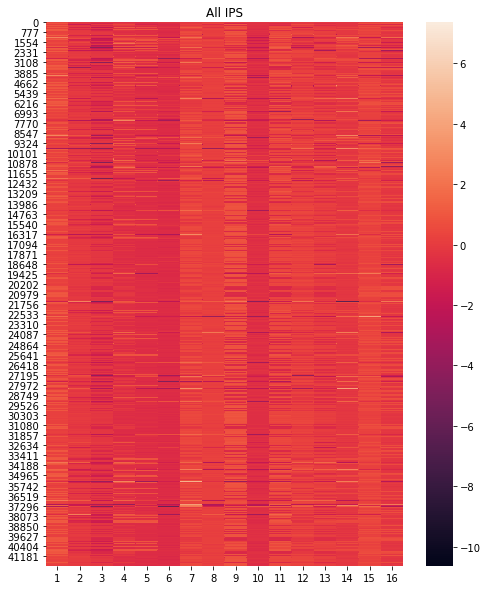

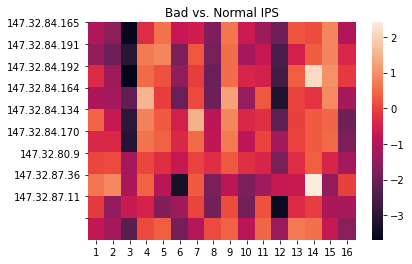

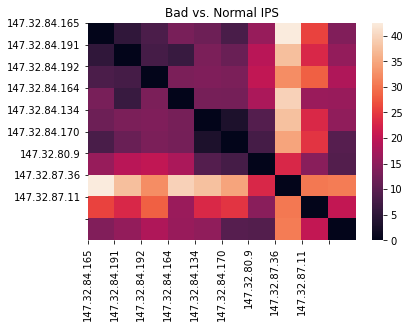

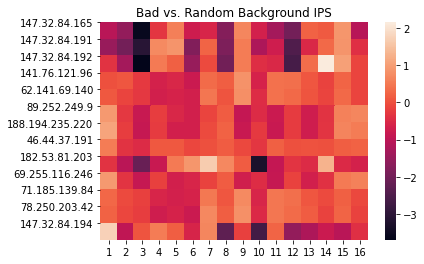

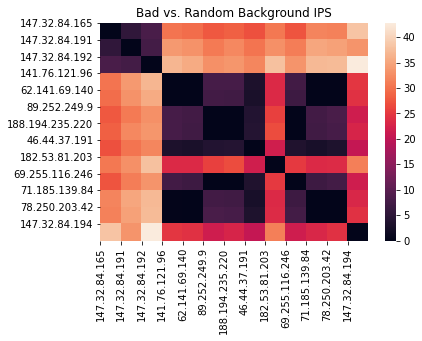

--------------------------------------------------
n_walks: 25, walk_length: 20, representation_size: 16, window_size: 4 Running Time:  614.4003036022186


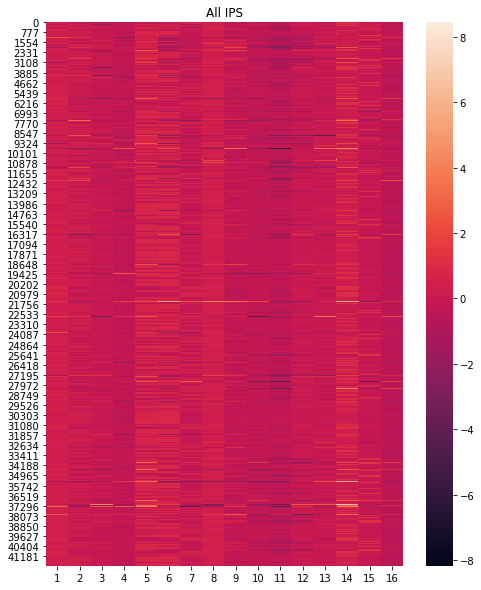

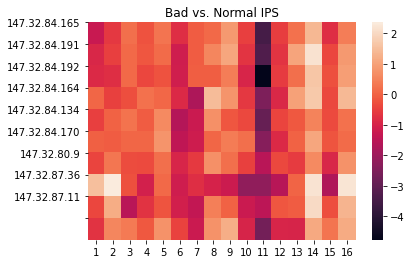

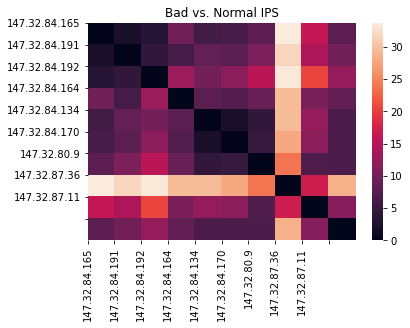

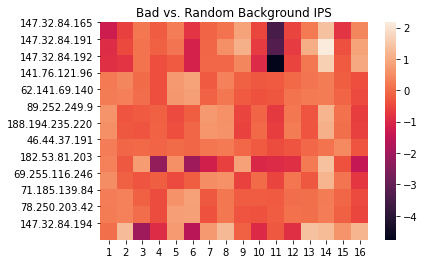

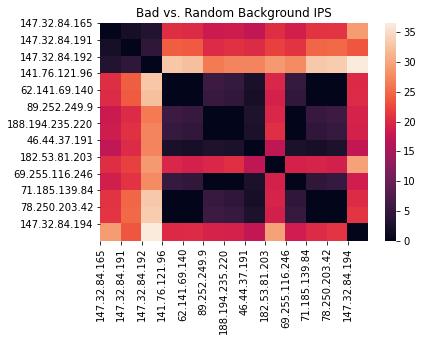

--------------------------------------------------
n_walks: 25, walk_length: 20, representation_size: 16, window_size: 8 Running Time:  886.2338037490845


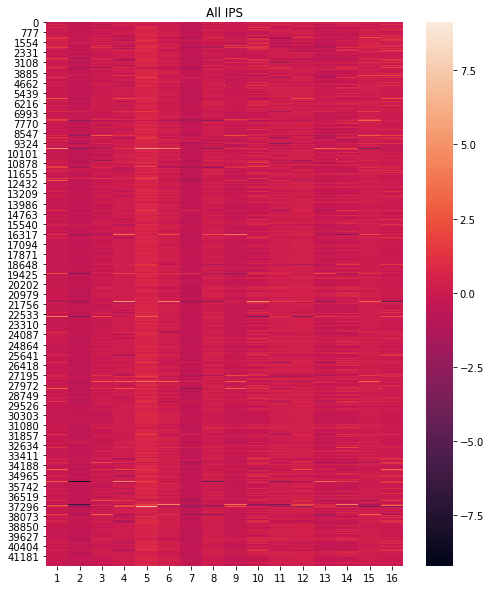

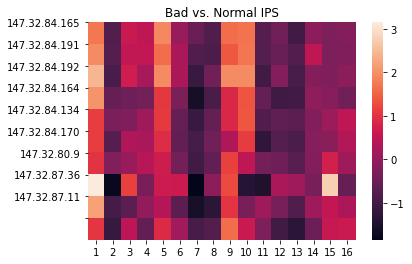

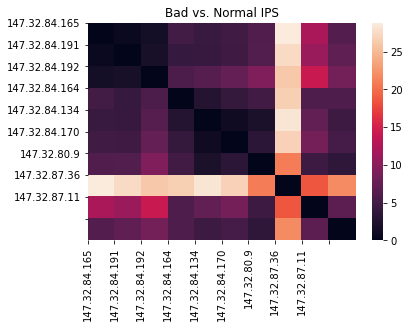

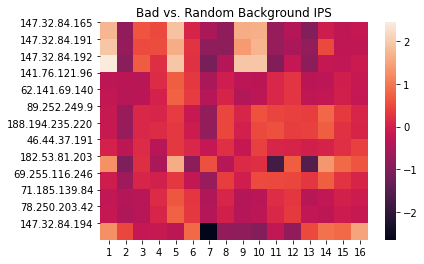

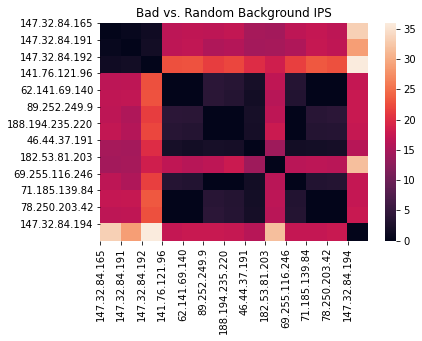

--------------------------------------------------
n_walks: 50, walk_length: 5, representation_size: 16, window_size: 2 Running Time:  201.88730239868164


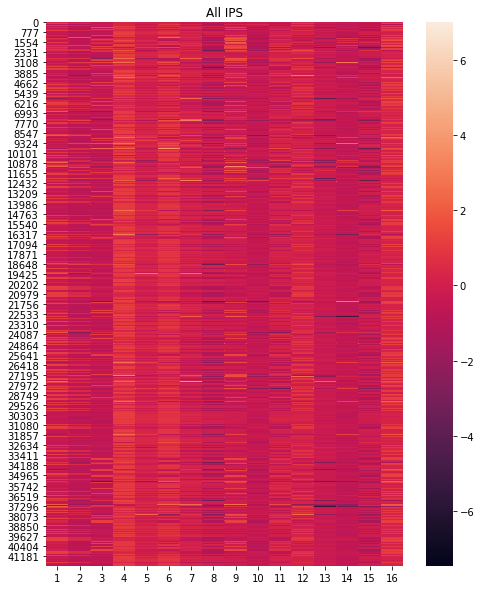

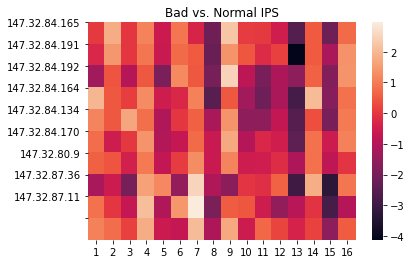

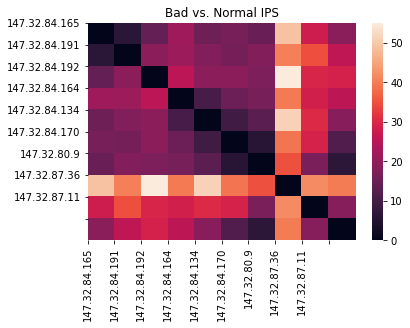

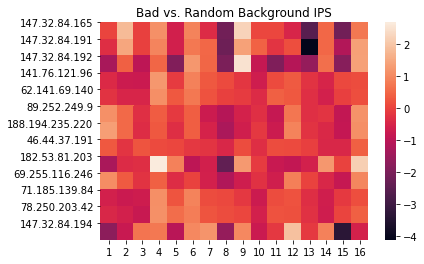

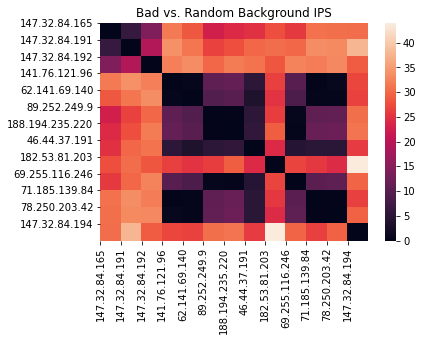

--------------------------------------------------
n_walks: 50, walk_length: 10, representation_size: 16, window_size: 2 Running Time:  398.4550642967224


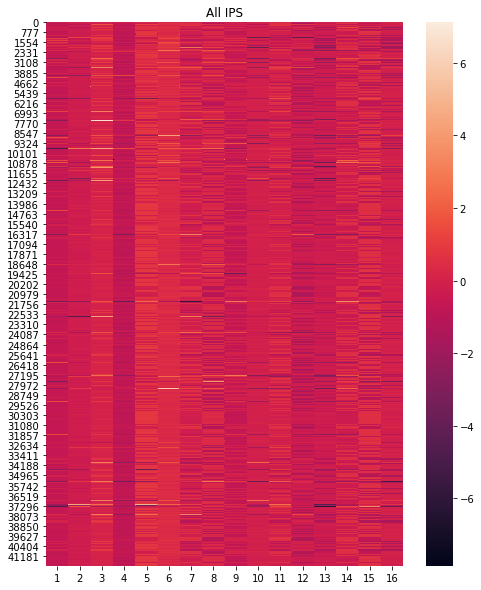

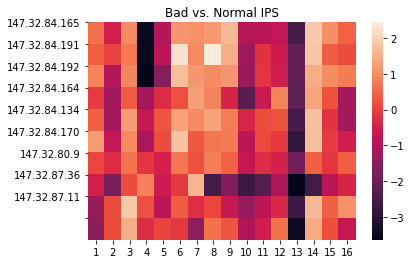

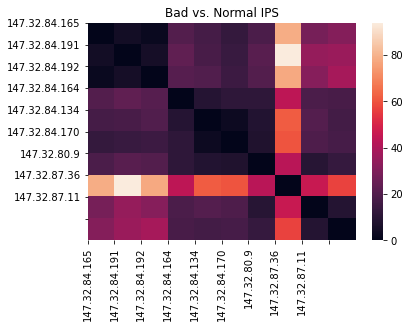

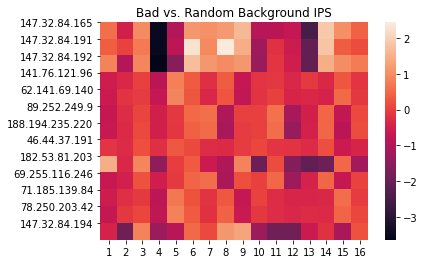

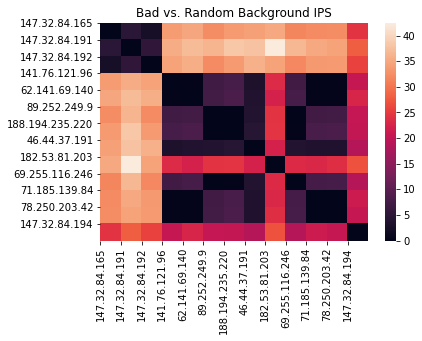

--------------------------------------------------
n_walks: 50, walk_length: 10, representation_size: 16, window_size: 4 Running Time:  519.363249540329


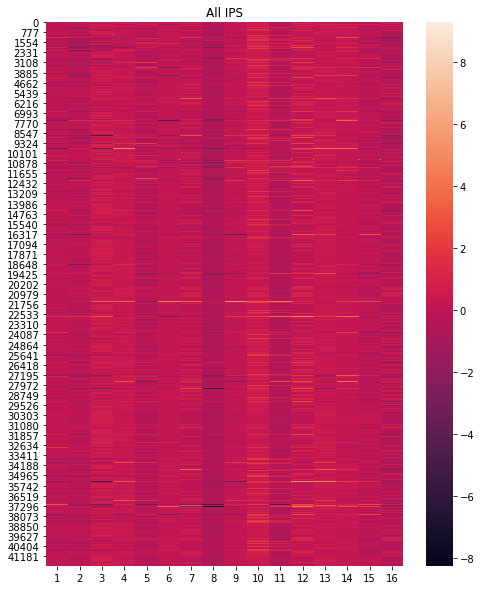

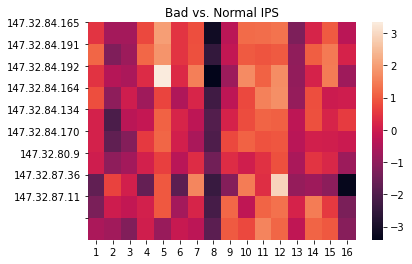

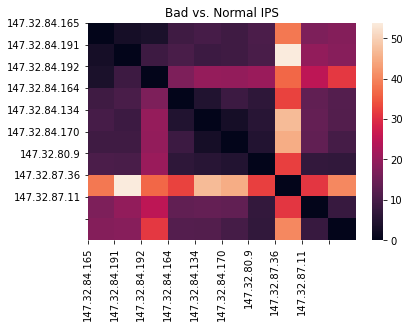

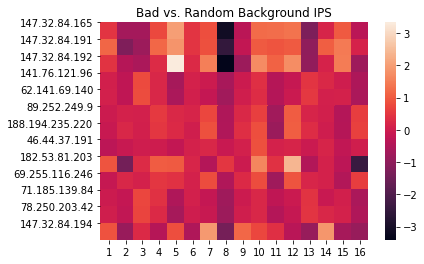

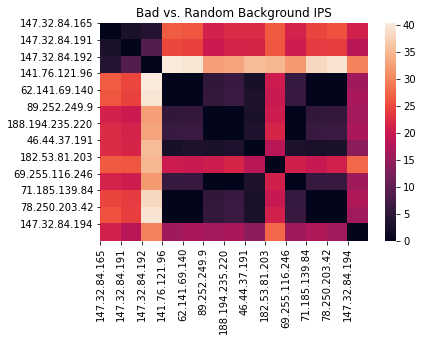

--------------------------------------------------
n_walks: 50, walk_length: 20, representation_size: 16, window_size: 2 Running Time:  845.2608211040497


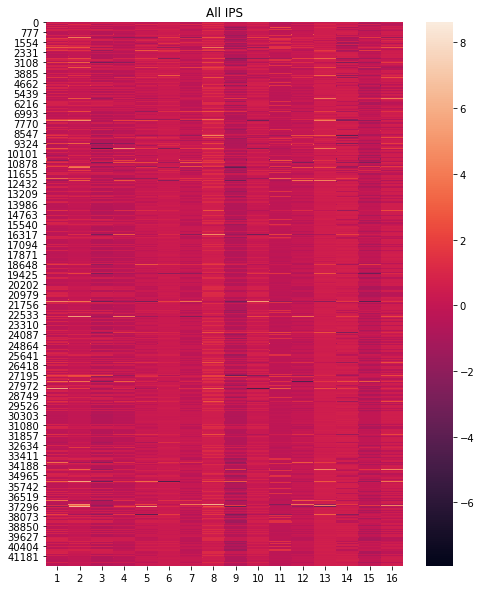

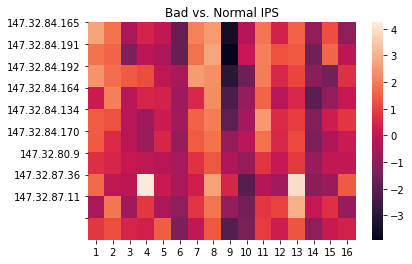

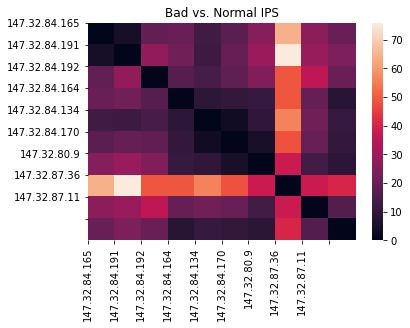

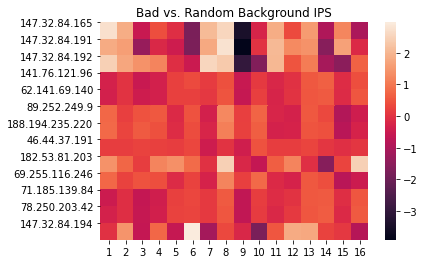

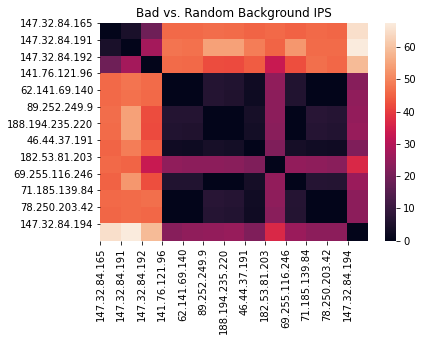

--------------------------------------------------
n_walks: 50, walk_length: 20, representation_size: 16, window_size: 4 Running Time:  1144.0375413894653


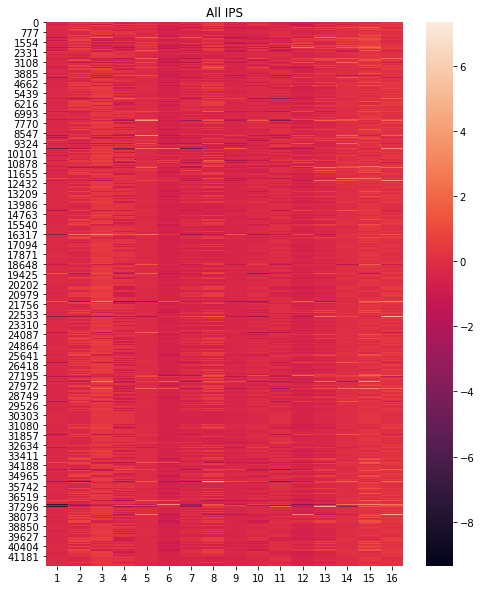

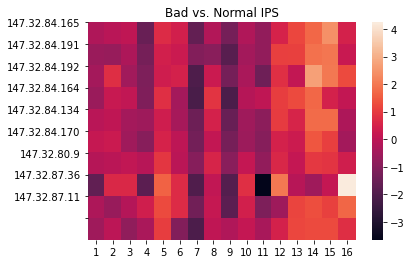

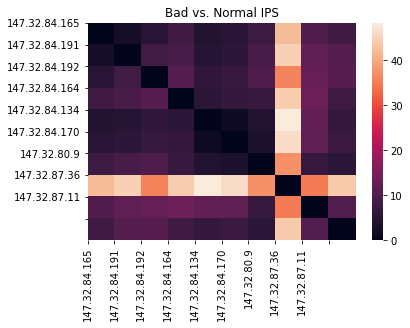

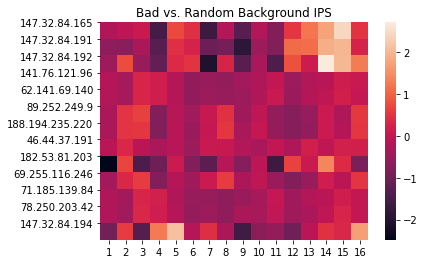

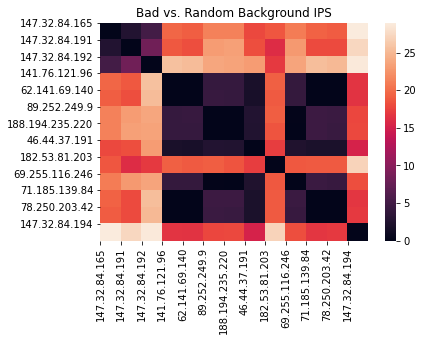

--------------------------------------------------
n_walks: 50, walk_length: 20, representation_size: 16, window_size: 8 Running Time:  1633.7287573814392


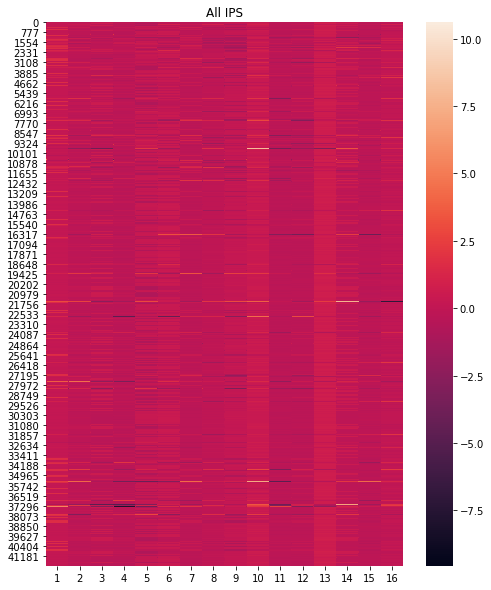

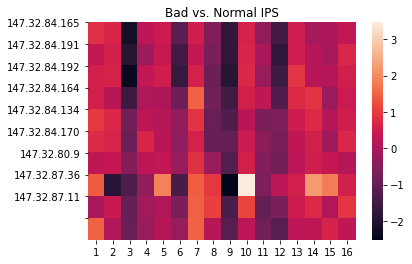

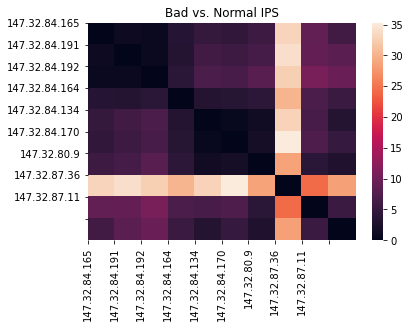

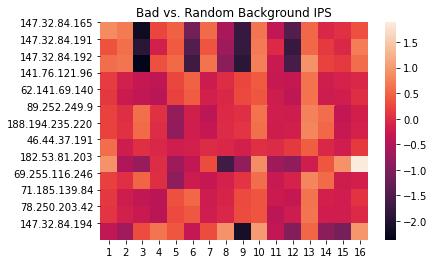

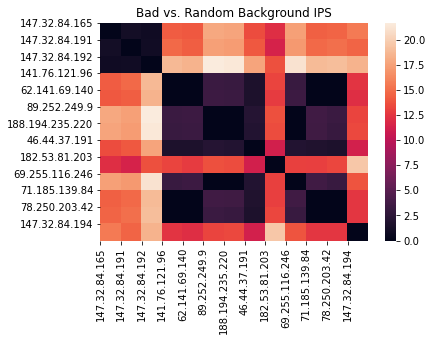

In [23]:
for representation_size in [16]:
    for n_walks in [5, 10, 25, 50]:
        for walk_length in [2, 5, 10, 20]:
            for window_size in [2, 4, 8]:
                if walk_length > 2*window_size:
                    run_deepwalk(G, 
                                 n_walks=n_walks, 
                                 walk_length=walk_length, 
                                 representation_size=representation_size, 
                                 window_size=window_size, 
                                 n_jobs=1)
        